## Imports

In [1]:
import pandas as pd
import numpy as np
import os

from sklearn.metrics import average_precision_score
from scipy.stats import mannwhitneyu
from scipy.stats import hypergeom
from scipy.stats import fisher_exact
from scipy.stats import wilcoxon
from scipy.stats import pearsonr
from scipy.stats import spearmanr

import matplotlib.pyplot as plt
import seaborn as sns

## Addresses

In [2]:
score_dir = '/oak/stanford/groups/akundaje/projects/african_omics/outs/10_15_2022_per_ancestry_scores/score_outputs'
table_dir = '/oak/stanford/groups/akundaje/projects/african_omics/outs/10_15_2022_per_ancestry_scores/tables'
merged_scores_file = table_dir + '/' + 'all.scores.pvals.pkl'

ancestries = [i for i in os.listdir(score_dir)]
folds = ['fold_' + str(i) for i in range(5)]

## Load Scores

In [3]:
merged_scores = pd.read_pickle(merged_scores_file)

merged_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.logfc,afr.mean.abs_logfc,afr.mean.jsd,eur.mean.logfc,eur.mean.abs_logfc,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval
0,chr1,16103,T,G,1_16103_T_G,0.005473,0.055423,0.015963,0.000984,0.000249,...,-0.040160,0.051663,0.013872,-0.049819,0.112214,0.018561,0.211619,0.234169,0.162379,0.187760
1,chr1,51479,T,A,1_51479_T_A,0.005228,0.015471,0.011684,0.000183,0.000078,...,-0.007020,0.014498,0.010759,-0.043471,0.047858,0.009873,0.731393,0.465941,0.507994,0.684013
2,chr1,51898,C,A,1_51898_C_A,-0.041237,0.042117,0.013937,0.000675,0.000354,...,-0.019467,0.042715,0.013278,-0.060124,0.082105,0.017154,0.269705,0.264774,0.261462,0.226823
3,chr1,51928,G,A,1_51928_G_A,-0.061888,0.061888,0.011073,0.000672,0.000346,...,-0.069831,0.069987,0.012255,-0.093683,0.093683,0.010890,0.137473,0.330525,0.215563,0.590671
4,chr1,51954,G,C,1_51954_G_C,0.013026,0.026674,0.007917,0.000217,0.000108,...,0.022003,0.043516,0.012541,0.051624,0.079512,0.014274,0.263670,0.310245,0.273581,0.347712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78885403,chr22,50799877,T,C,22_50799877_T_C,0.201037,0.201037,0.022667,0.006017,0.001864,...,0.166028,0.166028,0.020587,0.240640,0.240640,0.022297,0.031924,0.079089,0.040136,0.120919
78885404,chr22,50799907,A,T,22_50799907_A_T,-0.015225,0.060101,0.013130,0.000936,0.000227,...,0.022870,0.051497,0.011641,0.076308,0.106741,0.014846,0.212543,0.379807,0.176017,0.318274
78885405,chr22,50807819,T,C,22_50807819_T_C,0.268630,0.268630,0.041126,0.013706,0.010245,...,0.218994,0.221751,0.036076,0.174813,0.174813,0.033012,0.018364,0.020075,0.074467,0.047606
78885406,chr22,50807843,A,C,22_50807843_A_C,0.000816,0.029372,0.012104,0.000403,0.000325,...,0.003891,0.028490,0.011169,0.044921,0.067404,0.013213,0.421164,0.423521,0.341236,0.410930


## ASB Analysis

In [4]:
non_sig_asb_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/siteCountTable.ASB.testedNotSig.txt'
sig_asb_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/siteCountTable.sigASB.5.30.txt'
sig_asb_same_direction_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/asb_results_sig.summary.high_confidence.same_direction.tsv'
asb_logfc_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/siteCountTable.ASB.allSig.logFC.txt'

In [5]:
non_sig_asb = pd.read_csv(non_sig_asb_file, sep='\t')
print(non_sig_asb.shape)

non_sig_asb.dropna(subset='variantID', inplace=True)
non_sig_asb.drop_duplicates(subset='variantID', inplace=True)
non_sig_asb_snps = non_sig_asb['variantID'].tolist()

non_sig_asb

(312355, 4)


,variantID,n.tested,n.sig,prop
0,1_100018449_A_G,1,NaN,NaN
1,1_1000258_G_A,1,NaN,NaN
2,1_100025919_A_G,1,NaN,NaN
3,1_100027311_A_G,1,NaN,NaN
4,1_100029096_A_G,2,NaN,NaN
...,...,...,...,...
312350,9_99906903_T_C,2,NaN,NaN
312351,9_99907498_T_C,1,NaN,NaN
312352,9_99907562_C_T,1,NaN,NaN
312353,9_99954478_G_T,2,NaN,NaN


In [6]:
sig_asb_same_direction = pd.read_csv(sig_asb_same_direction_file, sep='\t')
sig_asb_same_direction_snps = sig_asb_same_direction['variantID'].tolist()

display(sig_asb_same_direction.head())
display(sig_asb_same_direction.shape)

,chr_pos,variantID,maf,n_tested,n_sig,prop_sig,median_refRatio_sig_low,median_refRatio_sig_high,n_sig_low,mean_refRatio_sig_low,sd_refRatio_sig_low,n_sig_high,mean_refRatio_sig_high,sd_refRatio_sig_high,prop_sig_high,prop_sig_low
0,10_100014590,10_100014590_G_C,0.040,8,5,0.625000,NaN,0.769231,0,NaN,NaN,5,0.771855,0.023181,0.625000,0.000000
1,10_101013083,10_101013083_T_C,0.185,28,17,0.607143,0.233333,NaN,17,0.221956,0.065409,0,NaN,NaN,0.000000,0.607143
2,10_10209477,10_10209477_A_T,0.170,13,8,0.615385,0.192402,NaN,8,0.190296,0.050779,0,NaN,NaN,0.000000,0.615385
3,10_103467624,10_103467624_G_A,0.070,11,8,0.727273,NaN,0.720085,0,NaN,NaN,8,0.738575,0.045687,0.727273,0.000000
4,10_103579043,10_103579043_G_T,0.125,6,4,0.666667,NaN,0.879166,0,NaN,NaN,4,0.854735,0.096297,0.666667,0.000000


(7559, 16)

In [7]:
sig_asb = pd.read_csv(sig_asb_file, sep='\t')
print(sig_asb.shape)

sig_asb.dropna(subset='variantID', inplace=True)
sig_asb.drop_duplicates(subset='variantID', inplace=True)

sig_asb

(11606, 4)


,variantID,n.tested,n.sig,prop
0,1_1000079_A_G,11,6,0.545455
1,1_1000279_C_T,9,7,0.777778
2,1_100050364_C_T,9,7,0.777778
3,1_1000830_C_A,9,5,0.555556
4,1_100130892_A_G,8,6,0.750000
...,...,...,...,...
11601,9_9892461_C_G,17,9,0.529412
11602,9_9901813_T_C,14,9,0.642857
11603,9_99515286_A_G,18,13,0.722222
11604,9_99823766_G_C,15,8,0.533333


In [8]:
sig_asb = sig_asb.loc[sig_asb['variantID'].isin(sig_asb_same_direction_snps)]
sig_asb_snps = sig_asb['variantID'].tolist()

sig_asb

,variantID,n.tested,n.sig,prop
0,1_1000079_A_G,11,6,0.545455
2,1_100050364_C_T,9,7,0.777778
4,1_100130892_A_G,8,6,0.750000
7,1_100364923_T_C,6,4,0.666667
8,1_100386034_T_A,22,13,0.590909
...,...,...,...,...
11598,9_9881856_T_C,7,4,0.571429
11599,9_9892379_A_C,8,7,0.875000
11602,9_9901813_T_C,14,9,0.642857
11603,9_99515286_A_G,18,13,0.722222


In [9]:
non_sig_asb['n.tested'].describe()

count    312355.000000
mean          1.799337
std           2.761492
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          65.000000
Name: n.tested, dtype: float64

In [10]:
non_sig_asb['n.sig'].describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: n.sig, dtype: float64

In [11]:
non_sig_asb['prop'].describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: prop, dtype: float64

In [12]:
sig_asb['n.tested'].describe()

count    7559.000000
mean       12.538431
std         9.647029
min         5.000000
25%         6.000000
50%         9.000000
75%        15.000000
max        60.000000
Name: n.tested, dtype: float64

In [13]:
sig_asb['n.sig'].describe()

count    7559.000000
mean        8.939807
std         7.105559
min         3.000000
25%         4.000000
50%         6.000000
75%        11.000000
max        53.000000
Name: n.sig, dtype: float64

In [14]:
sig_asb['prop'].describe()

count    7559.000000
mean        0.717296
std         0.133928
min         0.511111
25%         0.600000
50%         0.687500
75%         0.800000
max         1.000000
Name: prop, dtype: float64

In [15]:
for snp in sig_asb_snps:
    if snp in non_sig_asb_snps:
        print(snp)

In [16]:
tested_asb = pd.concat([non_sig_asb, sig_asb])
tested_asb_snps = tested_asb['variantID'].tolist()
tested_asb['chr'] = 'chr' + tested_asb['variantID'].apply(lambda x: x.split('_')[0])
tested_asb['pos'] = tested_asb['variantID'].apply(lambda x: int(x.split('_')[1]))
tested_asb['allele1_asb'] = tested_asb['variantID'].apply(lambda x: x.split('_')[2])
tested_asb['allele2_asb'] = tested_asb['variantID'].apply(lambda x: x.split('_')[3])

tested_asb

,variantID,n.tested,n.sig,prop,chr,pos,allele1_asb,allele2_asb
0,1_100018449_A_G,1,NaN,NaN,chr1,100018449,A,G
1,1_1000258_G_A,1,NaN,NaN,chr1,1000258,G,A
2,1_100025919_A_G,1,NaN,NaN,chr1,100025919,A,G
3,1_100027311_A_G,1,NaN,NaN,chr1,100027311,A,G
4,1_100029096_A_G,2,NaN,NaN,chr1,100029096,A,G
...,...,...,...,...,...,...,...,...
11598,9_9881856_T_C,7,4.0,0.571429,chr9,9881856,T,C
11599,9_9892379_A_C,8,7.0,0.875000,chr9,9892379,A,C
11602,9_9901813_T_C,14,9.0,0.642857,chr9,9901813,T,C
11603,9_99515286_A_G,18,13.0,0.722222,chr9,99515286,A,G


In [17]:
# asb_scores = merged_scores.merge(tested_asb, on=['chr', 'pos'])

# corrected_logfc = []

# for index,row in asb_scores.iterrows():
#     if row['allele1'] != row['rsid'].split('_')[2]:
#         if row['allele2'] == row['rsid'].split('_')[2]:
#             corrected_logfc.append(-1 * row['all.mean.logfc'])
#             assert row['allele2'] == row['allele1_asb']
#     else:
#         corrected_logfc.append(1 * row['all.mean.logfc'])
#         assert row['allele1'] == row['allele1_asb']
        
# asb_scores['all.mean.logfc'] = corrected_logfc

# asb_scores

In [18]:
asb_scores = merged_scores.loc[merged_scores['rsid'].isin(tested_asb_snps)].copy()

afr_corrected_logfc_asb = []
eur_corrected_logfc_asb = []

for index,row in asb_scores.iterrows():
    if row['allele1'] != row['rsid'].split('_')[2]:
        if row['allele2'] == row['rsid'].split('_')[2]:
            afr_corrected_logfc_asb.append(-1 * row['afr.mean.logfc'])
            eur_corrected_logfc_asb.append(-1 * row['eur.mean.logfc'])
    else:
        afr_corrected_logfc_asb.append(1 * row['afr.mean.logfc'])
        eur_corrected_logfc_asb.append(1 * row['eur.mean.logfc'])
        
asb_scores['afr.mean.logfc'] = afr_corrected_logfc_asb
asb_scores['eur.mean.logfc'] = eur_corrected_logfc_asb

asb_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.logfc,afr.mean.abs_logfc,afr.mean.jsd,eur.mean.logfc,eur.mean.abs_logfc,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval
297,chr1,778804,T,C,1_778804_T_C,-0.096629,0.130529,0.054519,0.007278,0.006981,...,-0.107990,0.146657,0.061116,-0.084425,0.190463,0.093023,0.040007,0.005029,0.063346,0.002778
515,chr1,805477,G,A,1_805477_G_A,-0.041345,0.045147,0.011498,0.000489,0.000210,...,-0.071710,0.072344,0.010974,-0.069352,0.080530,0.013161,0.130758,0.443146,0.268723,0.414312
825,chr1,827463,C,T,1_827463_C_T,-0.007429,0.025537,0.013138,0.000343,0.000336,...,-0.019276,0.039324,0.015012,-0.003518,0.056971,0.022409,0.297727,0.187446,0.419229,0.119490
1623,chr1,869729,G,A,1_869729_G_A,0.035423,0.035423,0.008918,0.000326,0.000257,...,0.050755,0.050755,0.009858,0.015855,0.034986,0.011113,0.216654,0.573238,0.675900,0.571108
1634,chr1,870176,T,A,1_870176_T_A,0.007269,0.019045,0.013279,0.000265,0.000193,...,0.005320,0.023767,0.012242,0.066168,0.084349,0.015354,0.499425,0.331473,0.251585,0.294618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78881325,chr22,50625182,C,T,22_50625182_C_T,-0.020768,0.052686,0.013834,0.000784,0.000145,...,-0.034552,0.040824,0.011910,-0.027847,0.056137,0.012281,0.284860,0.357189,0.426462,0.476339
78881384,chr22,50626470,G,A,22_50626470_G_A,-0.015676,0.021936,0.012953,0.000315,0.000010,...,-0.021476,0.024827,0.011938,-0.071908,0.094540,0.014532,0.480088,0.354963,0.212602,0.334034
78881399,chr22,50626801,G,A,22_50626801_G_A,-0.041337,0.041337,0.009222,0.000426,0.000015,...,-0.023610,0.034043,0.009686,-0.062443,0.093547,0.012437,0.350244,0.595739,0.216031,0.464764
78881463,chr22,50628623,G,C,22_50628623_G_C,0.007134,0.015338,0.007728,0.000107,0.000084,...,0.003362,0.015876,0.007652,0.028564,0.032750,0.009672,0.688450,0.869717,0.710359,0.703191


In [19]:
asb_scores['asb'] = asb_scores['rsid'].apply(lambda x: 1 if x in sig_asb_snps else 0)

asb_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.abs_logfc,afr.mean.jsd,eur.mean.logfc,eur.mean.abs_logfc,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,asb
297,chr1,778804,T,C,1_778804_T_C,-0.096629,0.130529,0.054519,0.007278,0.006981,...,0.146657,0.061116,-0.084425,0.190463,0.093023,0.040007,0.005029,0.063346,0.002778,0
515,chr1,805477,G,A,1_805477_G_A,-0.041345,0.045147,0.011498,0.000489,0.000210,...,0.072344,0.010974,-0.069352,0.080530,0.013161,0.130758,0.443146,0.268723,0.414312,0
825,chr1,827463,C,T,1_827463_C_T,-0.007429,0.025537,0.013138,0.000343,0.000336,...,0.039324,0.015012,-0.003518,0.056971,0.022409,0.297727,0.187446,0.419229,0.119490,0
1623,chr1,869729,G,A,1_869729_G_A,0.035423,0.035423,0.008918,0.000326,0.000257,...,0.050755,0.009858,0.015855,0.034986,0.011113,0.216654,0.573238,0.675900,0.571108,0
1634,chr1,870176,T,A,1_870176_T_A,0.007269,0.019045,0.013279,0.000265,0.000193,...,0.023767,0.012242,0.066168,0.084349,0.015354,0.499425,0.331473,0.251585,0.294618,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78881325,chr22,50625182,C,T,22_50625182_C_T,-0.020768,0.052686,0.013834,0.000784,0.000145,...,0.040824,0.011910,-0.027847,0.056137,0.012281,0.284860,0.357189,0.426462,0.476339,0
78881384,chr22,50626470,G,A,22_50626470_G_A,-0.015676,0.021936,0.012953,0.000315,0.000010,...,0.024827,0.011938,-0.071908,0.094540,0.014532,0.480088,0.354963,0.212602,0.334034,0
78881399,chr22,50626801,G,A,22_50626801_G_A,-0.041337,0.041337,0.009222,0.000426,0.000015,...,0.034043,0.009686,-0.062443,0.093547,0.012437,0.350244,0.595739,0.216031,0.464764,0
78881463,chr22,50628623,G,C,22_50628623_G_C,0.007134,0.015338,0.007728,0.000107,0.000084,...,0.015876,0.007652,0.028564,0.032750,0.009672,0.688450,0.869717,0.710359,0.703191,0


## AUPRC

## Absolute LogFC

In [20]:
for ancestry in [i for i in ancestries] + ['afr', 'eur']:
    print(ancestry, ': ', average_precision_score(asb_scores['asb'], asb_scores[ancestry + '.mean.abs_logfc']))

GM12878.ENCSR637XSC :  0.22554161729309835
Maasai :  0.24142008512146035
Yoruba :  0.2573139221794851
Luhya :  0.24878061733816317
Gambian :  0.24765959344700586
Esan :  0.2476580733300656
GM12878.ENCSR095QNB :  0.21521961609951273
Mende :  0.24906022418764606
afr :  0.26169957406513294
eur :  0.23030296260655592


## Absolute LogFC P-val

In [21]:
for ancestry in [i for i in ancestries] + ['afr', 'eur']:
    print(ancestry, ': ', average_precision_score(asb_scores['asb'], -1 * asb_scores[ancestry + '.mean.abs_logfc.pval']))

GM12878.ENCSR637XSC :  0.22553978439251596
Maasai :  0.24142305513374063
Yoruba :  0.25726117575409924
Luhya :  0.24878303942617536
Gambian :  0.24765736017022105
Esan :  0.247659566386482
GM12878.ENCSR095QNB :  0.21521648906768825
Mende :  0.24905958109158455
afr :  0.2617162883871271
eur :  0.23030341310177033


## JSD

In [22]:
for ancestry in [i for i in ancestries] + ['afr', 'eur']:
    print(ancestry, ': ', average_precision_score(asb_scores['asb'], asb_scores[ancestry + '.mean.jsd']))

GM12878.ENCSR637XSC :  0.1562319991592505
Maasai :  0.18144194463935398
Yoruba :  0.19167778151697193
Luhya :  0.18496939860773484
Gambian :  0.1877402205784378
Esan :  0.17998794497098186
GM12878.ENCSR095QNB :  0.15643969154547543
Mende :  0.18598578373152747
afr :  0.19266121447319579
eur :  0.16104325679732806


## JSD P-val

In [23]:
for ancestry in [i for i in ancestries] + ['afr', 'eur']:
    print(ancestry, ': ', average_precision_score(asb_scores['asb'], -1 * asb_scores[ancestry + '.mean.jsd.pval']))

GM12878.ENCSR637XSC :  0.15623098291938578
Maasai :  0.18142743931507838
Yoruba :  0.191677690735712
Luhya :  0.18496179769271603
Gambian :  0.18773935301630862
Esan :  0.17998779764981668
GM12878.ENCSR095QNB :  0.15643710003962927
Mende :  0.18598591361032113
afr :  0.19265355973076304
eur :  0.1610406627741978


In [24]:
for ancestry in [i for i in ancestries if i.startswith('GM12878')]:
    print(ancestry, ': ', average_precision_score(asb_scores['asb'], asb_scores[ancestry + '.mean.abs_logfc_x_jsd_x_max_percentile']))

GM12878.ENCSR637XSC :  0.22436000888222832
GM12878.ENCSR095QNB :  0.22415197802072992


In [25]:
asb_scores['afr.sig.abs_logfc'] = asb_scores['afr.mean.abs_logfc.pval'].apply(lambda x: 1 if x < 0.01 else 0)
asb_scores['afr.sig.jsd'] = asb_scores['afr.mean.jsd.pval'].apply(lambda x: 1 if x < 0.01 else 0)

asb_scores['eur.sig.abs_logfc'] = asb_scores['eur.mean.abs_logfc.pval'].apply(lambda x: 1 if x < 0.01 else 0)
asb_scores['eur.sig.jsd'] = asb_scores['eur.mean.jsd.pval'].apply(lambda x: 1 if x < 0.01 else 0)

asb_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,asb,afr.sig.abs_logfc,afr.sig.jsd,eur.sig.abs_logfc,eur.sig.jsd
297,chr1,778804,T,C,1_778804_T_C,-0.096629,0.130529,0.054519,0.007278,0.006981,...,0.093023,0.040007,0.005029,0.063346,0.002778,0,0,1,0,1
515,chr1,805477,G,A,1_805477_G_A,-0.041345,0.045147,0.011498,0.000489,0.000210,...,0.013161,0.130758,0.443146,0.268723,0.414312,0,0,0,0,0
825,chr1,827463,C,T,1_827463_C_T,-0.007429,0.025537,0.013138,0.000343,0.000336,...,0.022409,0.297727,0.187446,0.419229,0.119490,0,0,0,0,0
1623,chr1,869729,G,A,1_869729_G_A,0.035423,0.035423,0.008918,0.000326,0.000257,...,0.011113,0.216654,0.573238,0.675900,0.571108,0,0,0,0,0
1634,chr1,870176,T,A,1_870176_T_A,0.007269,0.019045,0.013279,0.000265,0.000193,...,0.015354,0.499425,0.331473,0.251585,0.294618,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78881325,chr22,50625182,C,T,22_50625182_C_T,-0.020768,0.052686,0.013834,0.000784,0.000145,...,0.012281,0.284860,0.357189,0.426462,0.476339,0,0,0,0,0
78881384,chr22,50626470,G,A,22_50626470_G_A,-0.015676,0.021936,0.012953,0.000315,0.000010,...,0.014532,0.480088,0.354963,0.212602,0.334034,0,0,0,0,0
78881399,chr22,50626801,G,A,22_50626801_G_A,-0.041337,0.041337,0.009222,0.000426,0.000015,...,0.012437,0.350244,0.595739,0.216031,0.464764,0,0,0,0,0
78881463,chr22,50628623,G,C,22_50628623_G_C,0.007134,0.015338,0.007728,0.000107,0.000084,...,0.009672,0.688450,0.869717,0.710359,0.703191,0,0,0,0,0


## LogFC ASB Plot

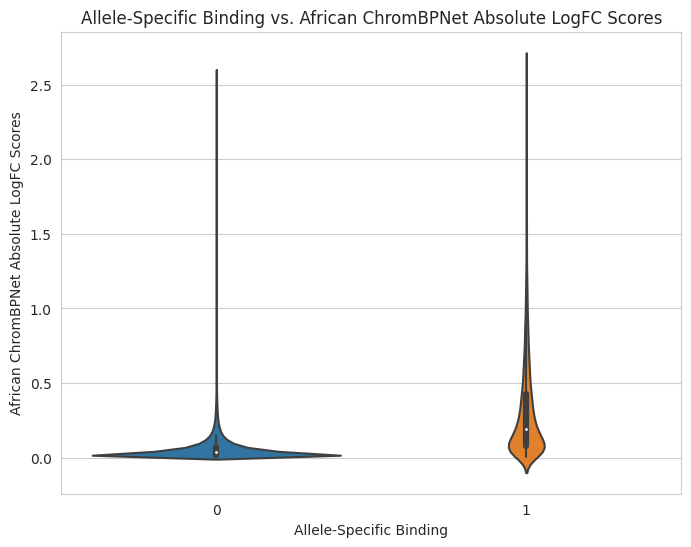

In [26]:
plt.rcParams['figure.figsize'] = [8, 6]

sns.set_style("whitegrid")
ax = sns.violinplot(x='asb', y=asb_scores['afr' + '.mean.abs_logfc'], data=asb_scores)
ax.set(xlabel='Allele-Specific Binding', ylabel='African ChromBPNet Absolute LogFC Scores',
       title='Allele-Specific Binding vs. African ChromBPNet Absolute LogFC Scores')
plt.show()

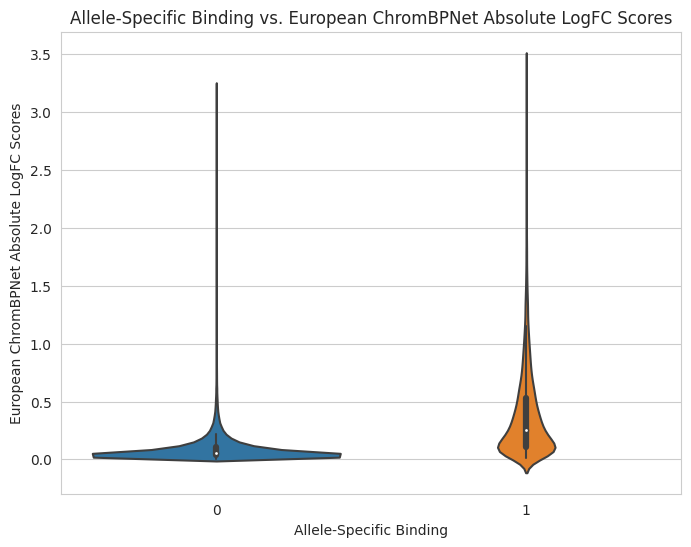

In [27]:
plt.rcParams['figure.figsize'] = [8, 6]

sns.set_style("whitegrid")
ax = sns.violinplot(x='asb', y=asb_scores['eur' + '.mean.abs_logfc'], data=asb_scores)
ax.set(xlabel='Allele-Specific Binding', ylabel='European ChromBPNet Absolute LogFC Scores',
       title='Allele-Specific Binding vs. European ChromBPNet Absolute LogFC Scores')
plt.show()

## JSD ASB Plot

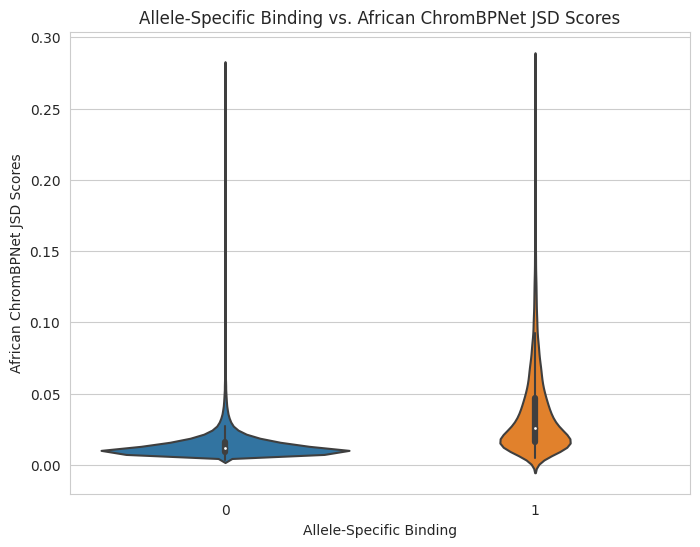

In [28]:
plt.rcParams['figure.figsize'] = [8, 6]

ax = sns.violinplot(x='asb', y=asb_scores['afr' + '.mean.jsd'], data=asb_scores)
ax.set(xlabel='Allele-Specific Binding', ylabel='African ChromBPNet JSD Scores',
       title='Allele-Specific Binding vs. African ChromBPNet JSD Scores')
plt.show()

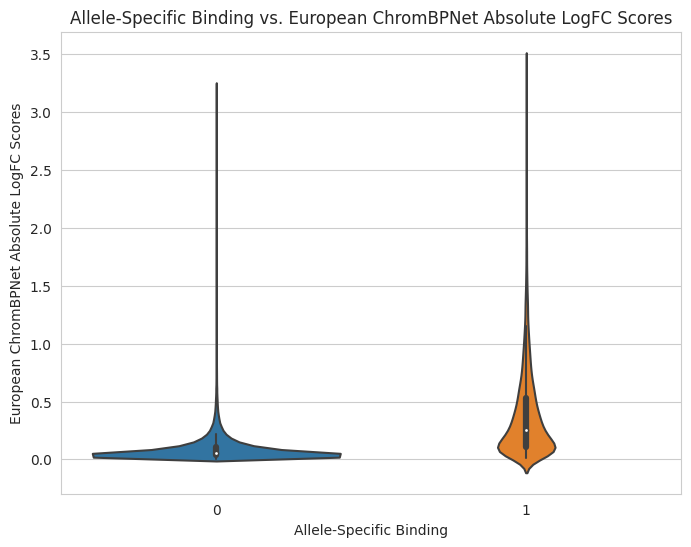

In [29]:
plt.rcParams['figure.figsize'] = [8, 6]

sns.set_style("whitegrid")
ax = sns.violinplot(x='asb', y=asb_scores['eur' + '.mean.abs_logfc'], data=asb_scores)
ax.set(xlabel='Allele-Specific Binding', ylabel='European ChromBPNet Absolute LogFC Scores',
       title='Allele-Specific Binding vs. European ChromBPNet Absolute LogFC Scores')
plt.show()

## Mean Values

In [30]:
asb_scores.loc[asb_scores['asb'] == 0]['afr' + '.mean.abs_logfc'].describe()

count    309709.000000
mean          0.060915
std           0.081119
min           0.003277
25%           0.018797
50%           0.035537
75%           0.070881
max           2.588141
Name: afr.mean.abs_logfc, dtype: float64

In [31]:
asb_scores.loc[asb_scores['asb'] == 1]['afr' + '.mean.abs_logfc'].describe()

count    7559.000000
mean        0.304126
std         0.313507
min         0.004549
25%         0.079515
50%         0.190496
75%         0.427908
max         2.607870
Name: afr.mean.abs_logfc, dtype: float64

In [32]:
asb_scores.loc[asb_scores['asb'] == 0]['afr' + '.mean.jsd'].describe()

count    309709.000000
mean          0.014242
std           0.009672
min           0.003127
25%           0.008951
50%           0.011716
75%           0.016308
max           0.281330
Name: afr.mean.jsd, dtype: float64

In [33]:
asb_scores.loc[asb_scores['asb'] == 1]['afr' + '.mean.jsd'].describe()

count    7559.000000
mean        0.036556
std         0.031372
min         0.004944
25%         0.015867
50%         0.025840
75%         0.046529
max         0.278625
Name: afr.mean.jsd, dtype: float64

## Mann-Whiteney U Test

In [34]:
mannwhitneyu(x=abs(asb_scores.loc[asb_scores['asb']==0]['afr' + '.mean.abs_logfc']),
             y=abs(asb_scores.loc[asb_scores['asb']==1]['afr' + '.mean.abs_logfc']))

MannwhitneyuResult(statistic=369732087.0, pvalue=0.0)

In [35]:
mannwhitneyu(x=abs(asb_scores.loc[asb_scores['asb']==0]['afr' + '.mean.jsd']),
             y=abs(asb_scores.loc[asb_scores['asb']==1]['afr' + '.mean.jsd']))

MannwhitneyuResult(statistic=427893488.0, pvalue=0.0)

In [36]:
mannwhitneyu(x=abs(asb_scores.loc[asb_scores['asb']==0]['eur' + '.mean.abs_logfc']),
             y=abs(asb_scores.loc[asb_scores['asb']==1]['eur' + '.mean.abs_logfc']))

MannwhitneyuResult(statistic=402446168.0, pvalue=0.0)

In [37]:
mannwhitneyu(x=abs(asb_scores.loc[asb_scores['asb']==0]['eur' + '.mean.jsd']),
             y=abs(asb_scores.loc[asb_scores['asb']==1]['eur' + '.mean.jsd']))

MannwhitneyuResult(statistic=458294987.0, pvalue=0.0)

## Fisher's Exact Test

In [38]:
no_asb_no_logfc = len(asb_scores.loc[(asb_scores['asb'] == 0) &
                        (asb_scores['afr.sig.abs_logfc'] == 0)])
no_asb_yes_logfc = len(asb_scores.loc[(asb_scores['asb'] == 0) &
                        (asb_scores['afr.sig.abs_logfc'] == 1)])
yes_asb_no_logfc = len(asb_scores.loc[(asb_scores['asb'] == 1) &
                        (asb_scores['afr.sig.abs_logfc'] == 0)])
yes_asb_yes_logfc = len(asb_scores.loc[(asb_scores['asb'] == 1) &
                        (asb_scores['afr.sig.abs_logfc'] == 1)])

logfc_table = np.array([[no_asb_no_logfc, no_asb_yes_logfc],
                        [yes_asb_no_logfc, yes_asb_yes_logfc]])

print(logfc_table)
print()
print(fisher_exact(logfc_table))

[[303492   6217]
 [  4823   2736]]

SignificanceResult(statistic=27.692694290877604, pvalue=0.0)


In [39]:
no_asb_no_jsd = len(asb_scores.loc[(asb_scores['asb'] == 0) &
                        (asb_scores['afr.sig.jsd'] == 0)])
no_asb_yes_jsd = len(asb_scores.loc[(asb_scores['asb'] == 0) &
                        (asb_scores['afr.sig.jsd'] == 1)])
yes_asb_no_jsd = len(asb_scores.loc[(asb_scores['asb'] == 1) &
                        (asb_scores['afr.sig.jsd'] == 0)])
yes_asb_yes_jsd = len(asb_scores.loc[(asb_scores['asb'] == 1) &
                        (asb_scores['afr.sig.jsd'] == 1)])

jsd_table = np.array([[no_asb_no_jsd, no_asb_yes_jsd],
                        [yes_asb_no_jsd, yes_asb_yes_jsd]])

print(jsd_table)
print()
print(fisher_exact(jsd_table))

[[305627   4082]
 [  5742   1817]]

SignificanceResult(statistic=23.692476429298306, pvalue=0.0)


## ASB LogFC Table

In [40]:
asb_logfc = pd.read_csv(asb_logfc_file, sep='\t')

display(asb_logfc.head())
display(asb_logfc.shape)

,variantID,meanLog2FC
0,10_100007241_C_T,1.415037
1,10_100009580_T_C,1.459432
2,10_100009635_T_G,-0.233221
3,10_100009776_G_A,-1.402098
4,10_100014090_A_G,1.736966


(299247, 2)

In [41]:
asb_logfc.dropna(subset='variantID', inplace=True)
asb_logfc.drop_duplicates(subset='variantID', inplace=True)

asb_logfc

,variantID,meanLog2FC
0,10_100007241_C_T,1.415037
1,10_100009580_T_C,1.459432
2,10_100009635_T_G,-0.233221
3,10_100009776_G_A,-1.402098
4,10_100014090_A_G,1.736966
...,...,...
299242,9_99907595_G_T,-1.505986
299243,9_99907933_T_A,-1.877444
299244,9_99954355_A_G,2.000000
299245,9_99954379_G_A,-2.321928


In [42]:
asb_logfc['meanLog2FC'].describe()

count    299247.000000
mean         -0.038493
std           1.781667
min          -4.247928
25%          -1.581158
50%          -0.044910
75%           1.437235
max           4.247928
Name: meanLog2FC, dtype: float64

In [43]:
asb_logfc_scores = merged_scores.merge(asb_logfc, left_on='rsid', right_on='variantID')

afr_corrected_logfc_asb = []
eur_corrected_logfc_asb = []

for index,row in asb_logfc_scores.iterrows():
    if row['allele1'] != row['rsid'].split('_')[2]:
        if row['allele2'] == row['rsid'].split('_')[2]:
            afr_corrected_logfc_asb.append(-1 * row['afr.mean.logfc'])
            eur_corrected_logfc_asb.append(-1 * row['eur.mean.logfc'])
    else:
        afr_corrected_logfc_asb.append(1 * row['afr.mean.logfc'])
        eur_corrected_logfc_asb.append(1 * row['eur.mean.logfc'])
        
asb_logfc_scores['afr.mean.logfc'] = afr_corrected_logfc_asb
asb_logfc_scores['eur.mean.logfc'] = eur_corrected_logfc_asb

asb_logfc_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd,eur.mean.logfc,eur.mean.abs_logfc,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,variantID,meanLog2FC
0,chr1,88338,G,A,1_88338_G_A,0.006526,0.010023,0.007320,0.000078,0.000001,...,0.007950,0.008736,0.034895,0.009034,0.821917,0.833148,0.677281,0.764432,1_88338_G_A,-1.415037
1,chr1,778597,C,T,1_778597_C_T,-0.011861,0.040785,0.013504,0.000580,0.000536,...,0.014317,-0.052828,0.063788,0.015496,0.336617,0.214203,0.365924,0.288387,1_778597_C_T,-2.263034
2,chr1,817341,A,G,1_817341_A_G,0.564681,0.564681,0.054295,0.033599,0.021291,...,0.045632,0.553012,0.553012,0.045810,0.003251,0.011182,0.006405,0.021292,1_817341_A_G,0.103225
3,chr1,866087,G,C,1_866087_G_C,-0.003554,0.006256,0.005852,0.000036,0.000026,...,0.006457,-0.005981,0.010611,0.005988,0.918482,0.972348,0.995434,0.984842,1_866087_G_C,2.807355
4,chr1,870118,C,T,1_870118_C_T,0.053810,0.058805,0.014021,0.000904,0.000731,...,0.013884,0.007695,0.035872,0.015593,0.340112,0.233575,0.662673,0.284218,1_870118_C_T,1.321928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298273,chr22,50684561,G,A,22_50684561_G_A,-0.013252,0.023482,0.010344,0.000243,0.000008,...,0.009696,-0.004504,0.062976,0.011588,0.739143,0.594389,0.371779,0.531019,22_50684561_G_A,-1.584963
298274,chr22,50695642,C,T,22_50695642_C_T,-0.005576,0.005684,0.005769,0.000034,0.000007,...,0.006718,-0.028095,0.028127,0.005846,0.993092,0.957279,0.785241,0.988272,22_50695642_C_T,-1.736966
298275,chr22,50728229,C,T,22_50728229_C_T,0.019484,0.031083,0.012768,0.000466,0.000008,...,0.010894,0.016325,0.064118,0.014997,0.309551,0.451474,0.363592,0.310962,22_50728229_C_T,1.321928
298276,chr22,50783303,T,C,22_50783303_T_C,0.026489,0.026731,0.006908,0.000198,0.000170,...,0.006882,0.021628,0.043136,0.006916,0.465347,0.945552,0.563352,0.944215,22_50783303_T_C,-1.930768


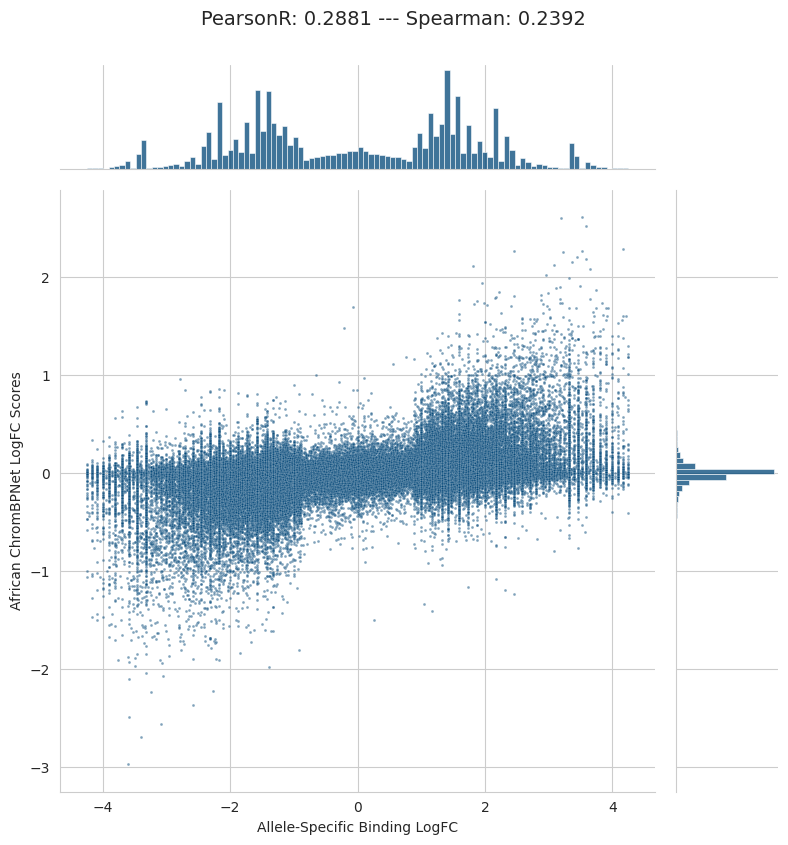

In [44]:
ax = sns.jointplot(x='meanLog2FC', y='afr.mean.logfc', data=asb_logfc_scores,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Allele-Specific Binding LogFC', ylabel='African ChromBPNet LogFC Scores')
ax.fig.suptitle('PearsonR: ' +  str(round(pearsonr(x=asb_logfc_scores['meanLog2FC'],
                                                   y=asb_logfc_scores['afr.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=asb_logfc_scores['meanLog2FC'],
                                                     b=asb_logfc_scores['afr.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

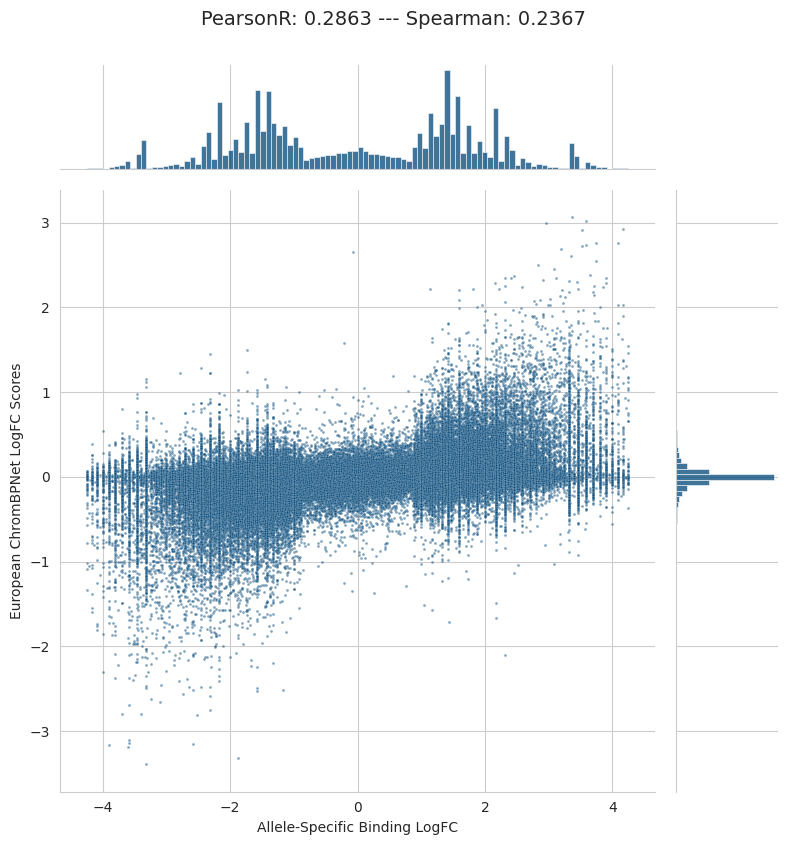

In [45]:
ax = sns.jointplot(x='meanLog2FC', y='eur.mean.logfc', data=asb_logfc_scores,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Allele-Specific Binding LogFC', ylabel='European ChromBPNet LogFC Scores')
ax.fig.suptitle('PearsonR: ' +  str(round(pearsonr(x=asb_logfc_scores['meanLog2FC'],
                                                   y=asb_logfc_scores['eur.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=asb_logfc_scores['meanLog2FC'],
                                                     b=asb_logfc_scores['eur.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

In [46]:
sig_asb_logfc_scores = asb_logfc_scores.loc[asb_logfc_scores['variantID'].isin(sig_asb_same_direction_snps)].copy()

sig_asb_logfc_scores

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd,eur.mean.logfc,eur.mean.abs_logfc,eur.mean.jsd,afr.mean.abs_logfc.pval,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,variantID,meanLog2FC
27,chr1,976215,A,G,1_976215_A_G,0.148617,0.186169,0.029973,0.005416,0.003405,...,0.036430,-0.027498,0.218047,0.052142,0.048619,0.019607,0.048772,0.015193,1_976215_A_G,-1.852605
30,chr1,1000079,A,G,1_1000079_A_G,0.001207,0.012582,0.017991,0.000220,0.000198,...,0.021034,0.004492,0.028228,0.019831,0.457881,0.074831,0.783580,0.160148,1_1000079_A_G,-2.087074
74,chr1,1038800,T,G,1_1038800_G_T,0.013834,0.078046,0.014067,0.001314,0.000522,...,0.014347,-0.002473,0.040055,0.015031,0.230560,0.212956,0.603360,0.309351,1_1038800_G_T,3.172063
75,chr1,1038819,T,C,1_1038819_C_T,0.139453,0.139453,0.021787,0.003160,0.001386,...,0.020315,-0.208648,0.208648,0.021750,0.071184,0.081884,0.053131,0.128314,1_1038819_C_T,2.390945
76,chr1,1038845,G,A,1_1038845_A_G,-0.354500,0.354500,0.029879,0.010773,0.006039,...,0.032463,0.552679,0.552679,0.034941,0.006371,0.025877,0.006414,0.041549,1_1038845_A_G,2.163432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297800,chr22,45413743,A,C,22_45413743_C_A,0.060161,0.066485,0.019021,0.001365,0.001260,...,0.020757,-0.018733,0.090525,0.019066,0.116673,0.077437,0.226901,0.176034,22_45413743_C_A,-2.318303
297945,chr22,46773373,C,T,22_46773373_C_T,0.418584,0.418584,0.053580,0.026134,0.003178,...,0.055695,0.340042,0.356065,0.037673,0.002674,0.006544,0.017863,0.034637,22_46773373_C_T,2.662931
297962,chr22,47001539,A,G,22_47001539_G_A,0.629396,0.629396,0.048494,0.031881,0.024380,...,0.053411,-0.716982,0.716982,0.056260,0.001611,0.007358,0.003153,0.012395,22_47001539_G_A,-2.249763
297971,chr22,47918714,G,A,22_47918714_G_A,0.603185,0.603185,0.044448,0.029488,0.020895,...,0.046358,0.531554,0.707046,0.047225,0.001273,0.010731,0.003282,0.019691,22_47918714_G_A,3.353036


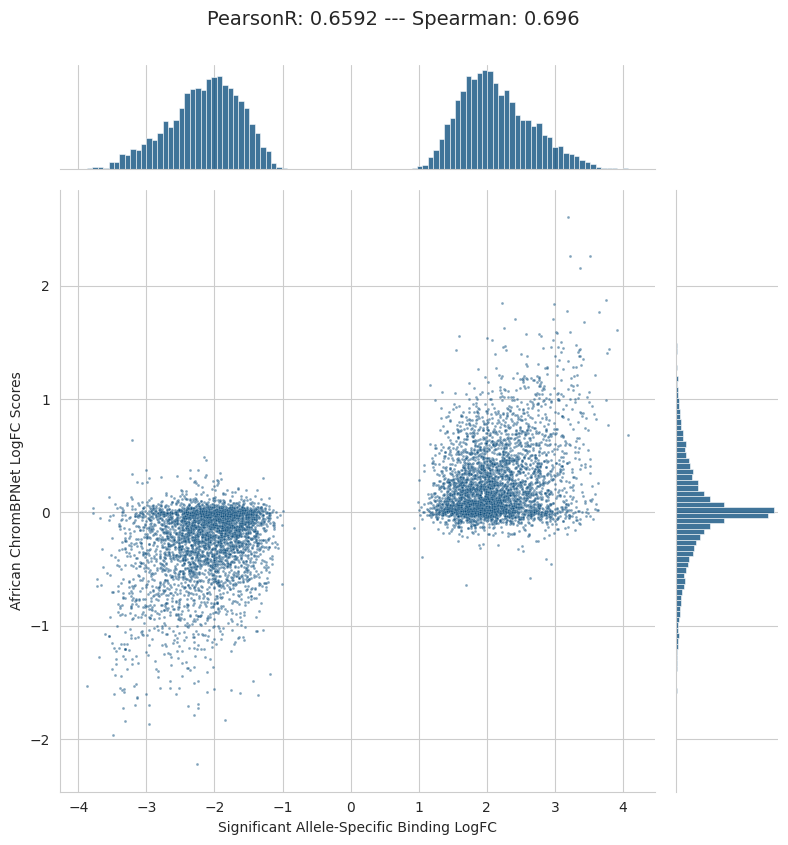

In [47]:
ax = sns.jointplot(x='meanLog2FC', y='afr.mean.logfc', data=sig_asb_logfc_scores,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Significant Allele-Specific Binding LogFC', ylabel='African ChromBPNet LogFC Scores')
ax.fig.suptitle('PearsonR: ' +  str(round(pearsonr(x=sig_asb_logfc_scores['meanLog2FC'],
                                                   y=sig_asb_logfc_scores['afr.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=sig_asb_logfc_scores['meanLog2FC'],
                                                        b=sig_asb_logfc_scores['afr.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

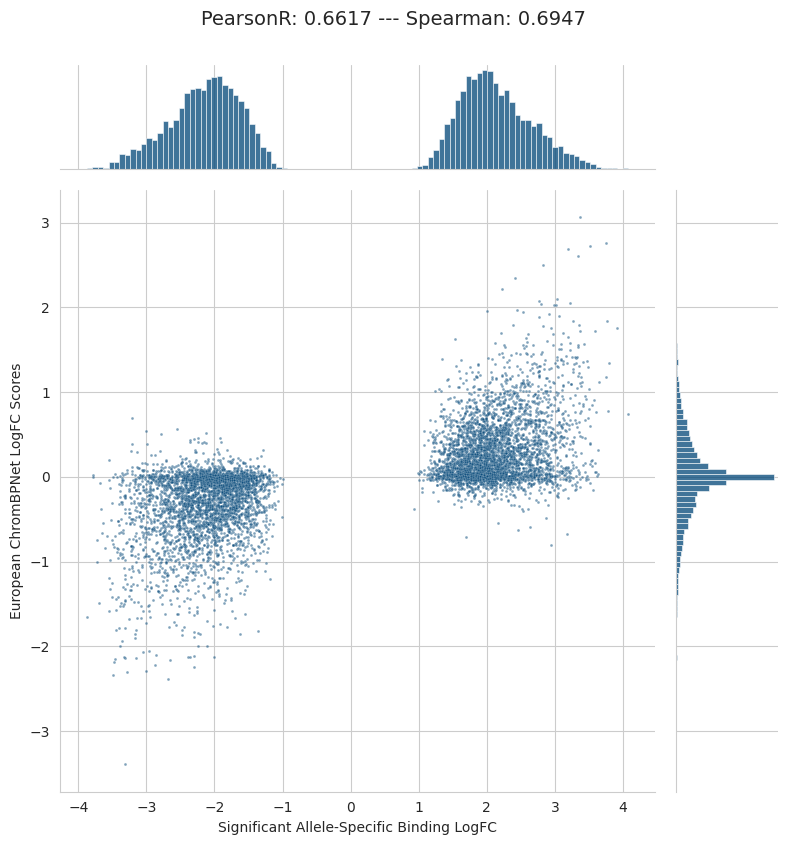

In [48]:
ax = sns.jointplot(x='meanLog2FC', y='eur.mean.logfc', data=sig_asb_logfc_scores,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Significant Allele-Specific Binding LogFC', ylabel='European ChromBPNet LogFC Scores')
ax.fig.suptitle('PearsonR: ' +  str(round(pearsonr(x=sig_asb_logfc_scores['meanLog2FC'],
                                                   y=sig_asb_logfc_scores['eur.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=sig_asb_logfc_scores['meanLog2FC'],
                                                        b=sig_asb_logfc_scores['eur.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

## All caQTLs Comparison

In [49]:
all_caqtls_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/AFGR.caQTL.penPC.maf05.90.qn.idr.all_in_peak.txt'
sig_caqtls_file = '/oak/stanford/groups/akundaje/projects/african_omics/data/snps/AFGR.caQTL.penPC.maf05.90.qn.idr.nominal_in_peak.txt'

In [50]:
all_caqtls = pd.read_csv(all_caqtls_file, names=['region', 'snp', 'distance', 'pval', 'beta', 'se'],
                         skiprows=1, sep='\t')
all_caqtls['abs_beta'] = np.abs(all_caqtls['beta'])

all_caqtls

,region,snp,distance,pval,beta,se,abs_beta
0,1:631878:632377,1_632160_A_G,281,0.000013,0.615745,0.133365,0.615745
1,1:632486:632769,1_632560_T_C,73,0.030888,0.330680,0.150736,0.330680
2,1:866099:866351,1_866281_C_T,181,0.974280,0.006546,0.202449,0.006546
3,1:866099:866351,1_866300_A_C,200,0.974280,0.006546,0.202449,0.006546
4,1:869800:870282,1_870176_T_A,375,0.071532,-0.250142,0.137133,0.250142
...,...,...,...,...,...,...,...
237326,9:137877638:137877838,9_137877642_C_A,3,0.177656,0.163752,0.120505,0.163752
237327,9:138125759:138126390,9_138126002_T_G,242,0.162899,0.175837,0.124958,0.175837
237328,9:138125759:138126390,9_138126031_C_T,271,0.699501,0.045293,0.116958,0.045293
237329,9:138155811:138156011,9_138155904_T_G,92,0.459881,0.117089,0.157737,0.117089


In [51]:
sig_caqtls = pd.read_csv(sig_caqtls_file, names=['region', 'snp', 'distance', 'pval', 'beta', 'se'],
                         skiprows=1, sep='\t')
sig_caqtls['abs_beta'] = np.abs(sig_caqtls['beta'])

sig_caqtls

,region,snp,distance,pval,beta,se,abs_beta
0,1:906596:907043,1_906982_C_T,385,4.802840e-06,-0.520262,0.106740,0.520262
1,1:921132:921332,1_921203_G_A,70,6.892040e-06,0.905971,0.189412,0.905971
2,1:975872:976361,1_976215_A_G,342,2.622420e-11,-0.615266,0.080637,0.615266
3,1:1038791:1039035,1_1038800_G_T,8,1.169820e-11,0.700579,0.089787,0.700579
4,1:1038791:1039035,1_1038819_C_T,27,1.169820e-11,0.700579,0.089787,0.700579
...,...,...,...,...,...,...,...
11844,9:137461802:137462407,9_137461970_G_C,167,1.349240e-12,0.620770,0.075135,0.620770
11845,9:137482067:137482354,9_137482216_A_G,148,7.011810e-21,1.118040,0.090659,1.118040
11846,9:137744641:137745329,9_137744902_G_A,260,1.620350e-08,0.533627,0.085771,0.533627
11847,9:137744641:137745329,9_137744905_G_A,263,1.620350e-08,0.533627,0.085771,0.533627


In [52]:
all_caqtls_merged = merged_scores.merge(all_caqtls, left_on='rsid', right_on='snp')

afr_corrected_logfc_caqtl = []
eur_corrected_logfc_caqtl = []

for index,row in all_caqtls_merged.iterrows():
    if row['allele1'] != row['rsid'].split('_')[2]:
        if row['allele2'] == row['rsid'].split('_')[2]:
            afr_corrected_logfc_caqtl.append(-1 * row['afr.mean.logfc'])
            eur_corrected_logfc_caqtl.append(-1 * row['eur.mean.logfc'])
    else:
        afr_corrected_logfc_caqtl.append(1 * row['afr.mean.logfc'])
        eur_corrected_logfc_caqtl.append(1 * row['eur.mean.logfc'])
        
all_caqtls_merged['afr.mean.logfc'] = afr_corrected_logfc_caqtl
all_caqtls_merged['eur.mean.logfc'] = eur_corrected_logfc_caqtl

all_caqtls_merged

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,region,snp,distance,pval,beta,se,abs_beta
0,chr1,866281,C,T,1_866281_C_T,-0.017276,0.035986,0.010862,0.000482,0.000195,...,0.649093,0.519612,0.686427,1:866099:866351,1_866281_C_T,181,0.974280,0.006546,0.202449,0.006546
1,chr1,866300,A,C,1_866300_A_C,-0.009280,0.022847,0.008537,0.000175,0.000082,...,0.800424,0.441420,0.636851,1:866099:866351,1_866300_A_C,200,0.974280,0.006546,0.202449,0.006546
2,chr1,870176,T,A,1_870176_T_A,0.007269,0.019045,0.013279,0.000265,0.000193,...,0.331473,0.251585,0.294618,1:869800:870282,1_870176_T_A,375,0.071532,-0.250142,0.137133,0.250142
3,chr1,904947,G,A,1_904947_G_A,-0.027669,0.027669,0.010101,0.000265,0.000234,...,0.500773,0.799295,0.513734,1:904938:905544,1_904947_G_A,8,0.290840,0.174397,0.164112,0.174397
4,chr1,905373,C,T,1_905373_T_C,-0.132262,0.132262,0.014543,0.001979,0.001549,...,0.187633,0.100221,0.095542,1:904938:905544,1_905373_T_C,434,0.188152,-0.130176,0.098145,0.130176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219377,chr22,50627388,G,A,22_50627388_G_A,0.005296,0.027551,0.010789,0.000299,0.000075,...,0.495623,0.756070,0.526640,22:50627308:50627508,22_50627388_G_A,79,0.405697,-0.136940,0.163901,0.136940
219378,chr22,50628124,C,G,22_50628124_C_G,-0.069978,0.069978,0.019913,0.001445,0.001242,...,0.078649,0.175254,0.090050,22:50627514:50628822,22_50628124_C_G,609,0.742636,0.021773,0.066098,0.021773
219379,chr22,50628493,G,A,22_50628493_G_A,0.025575,0.025575,0.015997,0.000458,0.000383,...,0.292637,0.204932,0.314371,22:50627514:50628822,22_50628493_G_A,978,0.729436,0.028973,0.083502,0.028973
219380,chr22,50628562,C,T,22_50628562_C_T,0.022417,0.028005,0.007993,0.000222,0.000175,...,0.778577,0.745510,0.591567,22:50627514:50628822,22_50628562_C_T,1047,0.191678,-0.076209,0.057921,0.076209


In [53]:
sig_caqtls_merged = merged_scores.merge(sig_caqtls, left_on='rsid', right_on='snp')

afr_corrected_logfc_caqtl = []
eur_corrected_logfc_caqtl = []

for index,row in sig_caqtls_merged.iterrows():
    if row['allele1'] != row['rsid'].split('_')[2]:
        if row['allele2'] == row['rsid'].split('_')[2]:
            afr_corrected_logfc_caqtl.append(-1 * row['afr.mean.logfc'])
            eur_corrected_logfc_caqtl.append(-1 * row['eur.mean.logfc'])
    else:
        afr_corrected_logfc_caqtl.append(1 * row['afr.mean.logfc'])
        eur_corrected_logfc_caqtl.append(1 * row['eur.mean.logfc'])
        
sig_caqtls_merged['afr.mean.logfc'] = afr_corrected_logfc_caqtl
sig_caqtls_merged['eur.mean.logfc'] = eur_corrected_logfc_caqtl

sig_caqtls_merged

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,region,snp,distance,pval,beta,se,abs_beta
0,chr1,906982,C,T,1_906982_C_T,-0.154969,0.154969,0.013386,0.002378,0.000782,...,0.283322,0.019017,0.102896,1:906596:907043,1_906982_C_T,385,4.802840e-06,-0.520262,0.106740,0.520262
1,chr1,921203,G,A,1_921203_G_A,0.459098,0.459098,0.084942,0.044398,0.013597,...,0.002686,0.001354,0.001950,1:921132:921332,1_921203_G_A,70,6.892040e-06,0.905971,0.189412,0.905971
2,chr1,976215,A,G,1_976215_A_G,0.148617,0.186169,0.029973,0.005416,0.003405,...,0.019607,0.048772,0.015193,1:975872:976361,1_976215_A_G,342,2.622420e-11,-0.615266,0.080637,0.615266
3,chr1,1038800,T,G,1_1038800_G_T,0.013834,0.078046,0.014067,0.001314,0.000522,...,0.212956,0.603360,0.309351,1:1038791:1039035,1_1038800_G_T,8,1.169820e-11,0.700579,0.089787,0.700579
4,chr1,1038819,T,C,1_1038819_C_T,0.139453,0.139453,0.021787,0.003160,0.001386,...,0.081884,0.053131,0.128314,1:1038791:1039035,1_1038819_C_T,27,1.169820e-11,0.700579,0.089787,0.700579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11093,chr22,47918570,C,T,22_47918570_C_T,0.045728,0.045728,0.012345,0.000625,0.000259,...,0.381904,0.434258,0.442124,22:47918335:47918580,22_47918570_C_T,234,2.097070e-07,1.086220,0.192851,1.086220
11094,chr22,47918714,G,A,22_47918714_G_A,0.603185,0.603185,0.044448,0.029488,0.020895,...,0.010731,0.003282,0.019691,22:47918594:47919371,22_47918714_G_A,119,3.198390e-34,1.186160,0.059816,1.186160
11095,chr22,47919267,A,G,22_47919267_A_G,0.055235,0.055235,0.009790,0.000595,0.000229,...,0.382060,0.181527,0.332910,22:47918594:47919371,22_47919267_A_G,672,2.085350e-13,0.847828,0.097935,0.847828
11096,chr22,49919331,C,T,22_49919331_C_T,0.028704,0.028704,0.011540,0.000329,0.000149,...,0.560768,0.533515,0.471160,22:49919131:49919331,22_49919331_C_T,199,2.270740e-06,-0.449995,0.088926,0.449995


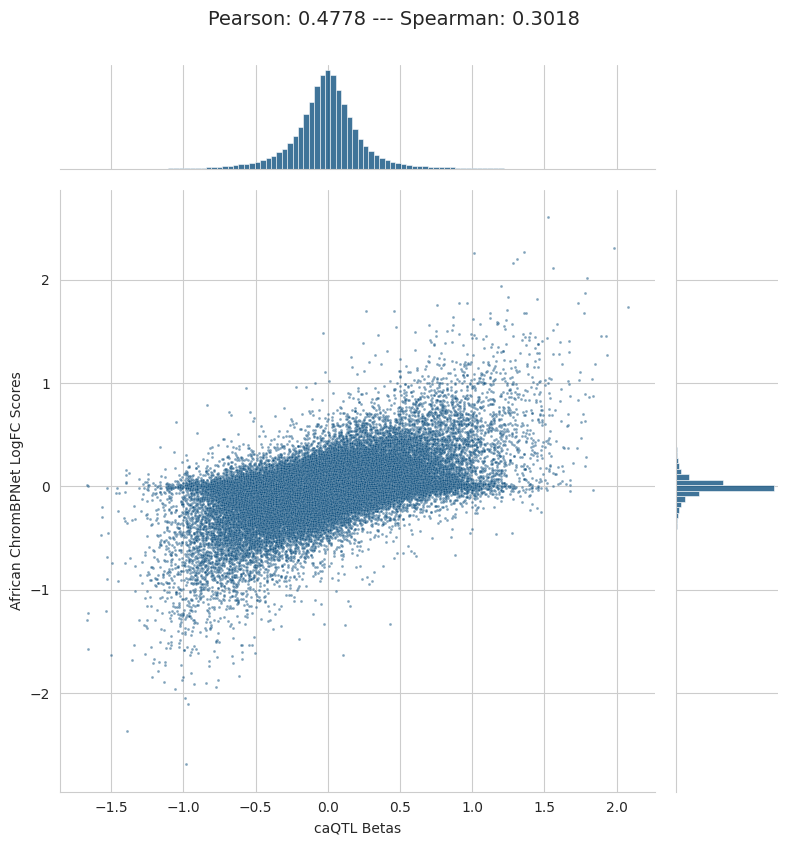

In [54]:
ax = sns.jointplot(x='beta', y='afr.mean.logfc', data=all_caqtls_merged,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='caQTL Betas', ylabel='African ChromBPNet LogFC Scores')
ax.fig.suptitle('Pearson: ' +  str(round(pearsonr(x=all_caqtls_merged['beta'],
                                                  y=all_caqtls_merged['afr.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=all_caqtls_merged['beta'],
                                                        b=all_caqtls_merged['afr.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

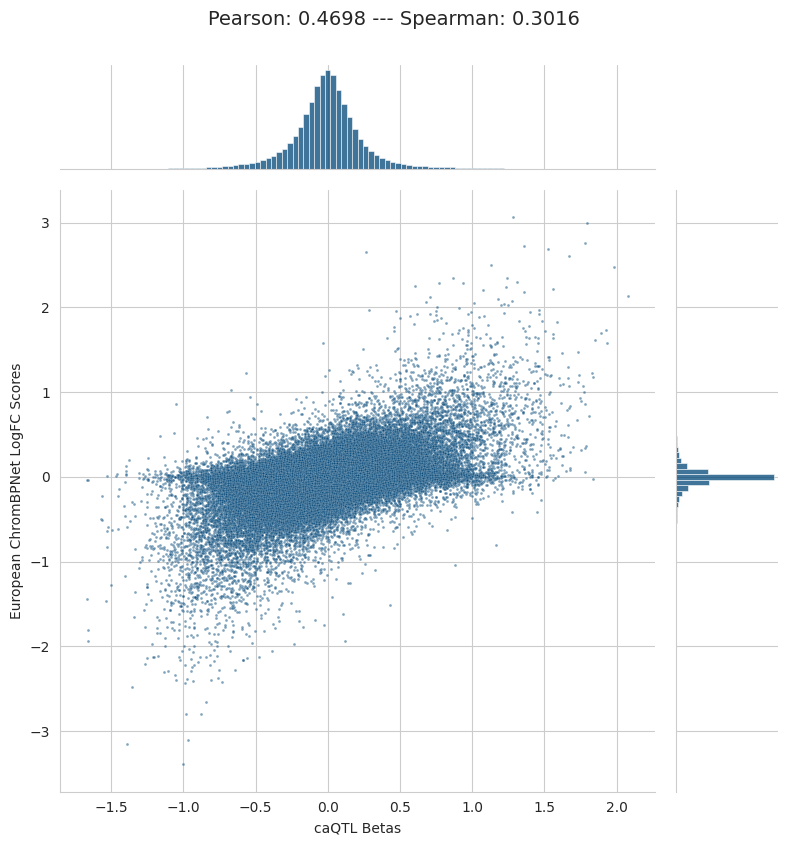

In [55]:
ax = sns.jointplot(x='beta', y='eur.mean.logfc', data=all_caqtls_merged,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='caQTL Betas', ylabel='European ChromBPNet LogFC Scores')
ax.fig.suptitle('Pearson: ' +  str(round(pearsonr(x=all_caqtls_merged['beta'],
                                                  y=all_caqtls_merged['eur.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=all_caqtls_merged['beta'],
                                                        b=all_caqtls_merged['eur.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

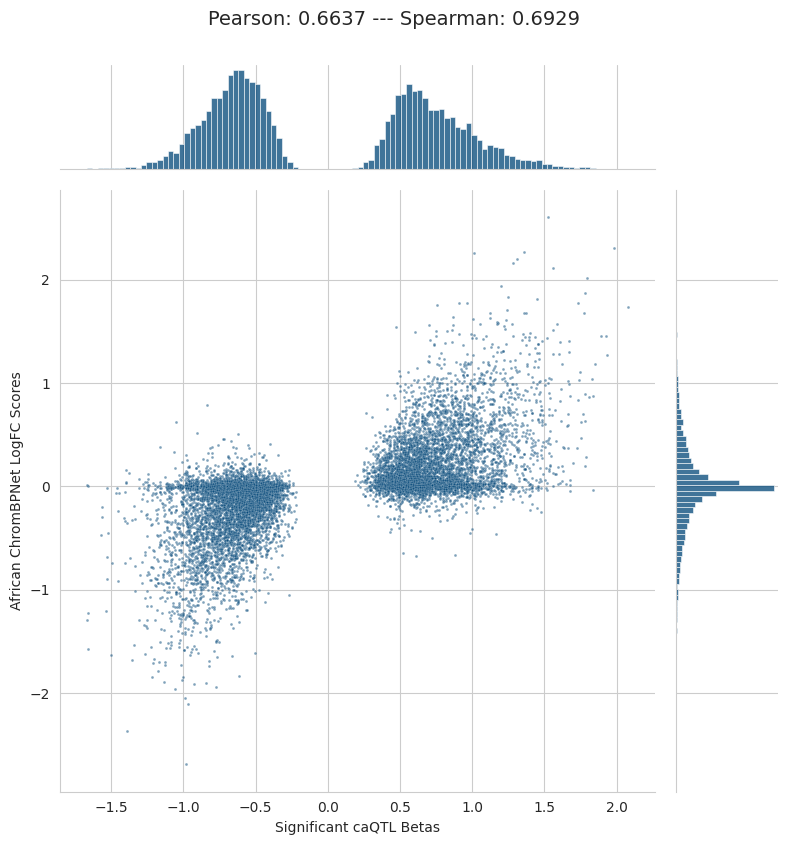

In [56]:
ax = sns.jointplot(x='beta', y='afr.mean.logfc', data=sig_caqtls_merged,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Allele-Specific Binding LogFC', ylabel='ChromBPNet LogFC Scores')

ax.ax_joint.set(xlabel='Significant caQTL Betas', ylabel='African ChromBPNet LogFC Scores')
ax.fig.suptitle('Pearson: ' +  str(round(pearsonr(x=sig_caqtls_merged['beta'],
                                                  y=sig_caqtls_merged['afr.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=sig_caqtls_merged['beta'],
                                                        b=sig_caqtls_merged['afr.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

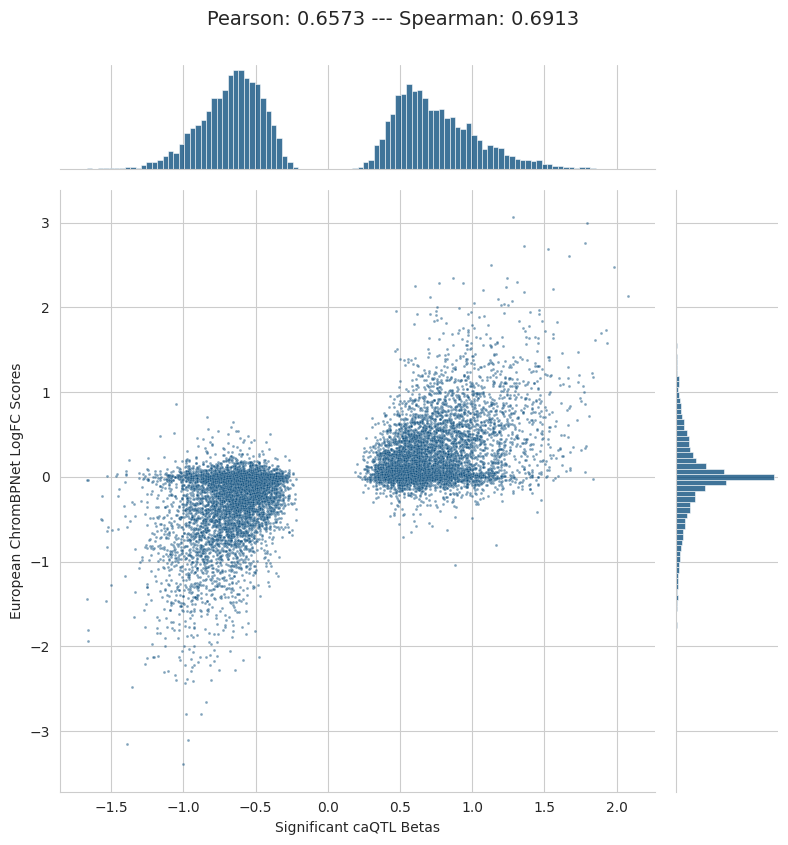

In [57]:
ax = sns.jointplot(x='beta', y='eur.mean.logfc', data=sig_caqtls_merged,
                   alpha=0.5, s=4, height=8, ratio=5, color=sns.xkcd_rgb['prussian blue'], marginal_kws=dict(bins=100))
ax.ax_joint.set(xlabel='Allele-Specific Binding LogFC', ylabel='ChromBPNet LogFC Scores')

ax.ax_joint.set(xlabel='Significant caQTL Betas', ylabel='European ChromBPNet LogFC Scores')
ax.fig.suptitle('Pearson: ' +  str(round(pearsonr(x=sig_caqtls_merged['beta'],
                                                  y=sig_caqtls_merged['eur.mean.logfc'])[0], 4)) +
                ' --- Spearman: ' + str(round(spearmanr(a=sig_caqtls_merged['beta'],
                                                        b=sig_caqtls_merged['eur.mean.logfc'])[0], 4)),
                fontsize=14, y=1.05)

plt.show()

## Save all ASB / caQTL Table

In [58]:
asb_logfc_scores.to_csv(table_dir + '/' + 'asb.scores.tsv', index=False, sep='\t')

In [59]:
all_caqtls_merged.to_csv(table_dir + '/' + 'all_caqtls.scores.tsv', index=False, sep='\t')

## Save sig ASB / caQTL Table

In [60]:
sig_asb_logfc_scores.to_csv(table_dir + '/' + 'sig.asb.scores.tsv', index=False, sep='\t')

In [61]:
sig_caqtls_merged.to_csv(table_dir + '/' + 'sig_caqtls.scores.tsv', index=False, sep='\t')

## Enrichment Plots

In [60]:
sns.set(style='whitegrid')

def plot_enrichment_curves(df, compare_score, model_score, compare_score_ascending=False, model_score_ascending=True,
                           title=None, xlabel=None, ylabel=None,
                           thresh_list=[0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001], subsample=False, ymax='auto', debug=False):
    by_thresh_dict = {'score':[], 'ratio':[], 'threshold':[]}
    
    for thresh in thresh_list:
        sample_df = df.sort_values(by=[compare_score, model_score], ascending=[False, True])
        ratio = len(sample_df.loc[sample_df[model_score] < thresh]) / len(sample_df)
        sample_df['sig'] = sample_df[model_score].apply(lambda x: x < thresh)
        sample_df['expected'] = [ratio] * len(sample_df)
        expected = sample_df['expected'].cumsum().tolist()
        observed = sample_df['sig'].cumsum().tolist()
        
        enrich_ratio = np.array(observed) / np.array(expected)
        compare_vals = sample_df[compare_score].tolist()
        enrich_ratio = enrich_ratio.tolist()
        assert len(compare_vals) == len(enrich_ratio)
        by_thresh_dict['ratio'].extend(enrich_ratio)
        by_thresh_dict['score'].extend(compare_vals)
        by_thresh_dict['threshold'].extend([thresh] * len(sample_df))
        
        if debug:
            print(thresh)
            print('Expected:', expected[:10])
            print('Observed:', observed[:10])
            print('Ratio:', enrich_ratio[:10])
            print('Compare Scores:', compare_vals[:10])
            print()
        
    by_thresh_df = pd.DataFrame(by_thresh_dict)
    by_thresh_df.sort_values(by=['score'], ascending=False, inplace=True)
    
    if subsample:
        by_thresh_df = pd.concat([by_thresh_df.iloc[:10000,].copy(), by_thresh_df.iloc[10000:,].copy().sample(10000)])
    
    g = sns.JointGrid(data=by_thresh_df, x='score', y='ratio', hue='threshold',
                      palette=sns.color_palette('rocket', 10), height=8, ratio=5)
    g.plot_joint(sns.lineplot, linewidth=1)
    sns.histplot(x='score', data=by_thresh_df, ax=g.ax_marg_x, color='b', stat='density', kde=True)

    if str(ymax) != 'auto':
        g.ax_joint.set_ylim(0, ymax)
    if xlabel == None:    
        xlabel = compare_score
    if ylabel == None:
        ylabel = 'observed / expected'
    if title == None:
        title = compare_score + ' vs ' + model_score
        
    g.ax_joint.set_xlabel(xlabel)
    g.ax_joint.set_ylabel(ylabel)
    g.fig.suptitle(title, fontsize=14, y=1.05)
    g.ax_marg_y.grid(False)
    plt.show()

In [62]:
sig_caqtls_merged

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,region,snp,distance,pval,beta,se,abs_beta
0,chr1,906982,C,T,1_906982_C_T,-0.154969,0.154969,0.013386,0.002378,0.000782,...,0.283322,0.019017,0.102896,1:906596:907043,1_906982_C_T,385,4.802840e-06,-0.520262,0.106740,0.520262
1,chr1,921203,G,A,1_921203_G_A,0.459098,0.459098,0.084942,0.044398,0.013597,...,0.002686,0.001354,0.001950,1:921132:921332,1_921203_G_A,70,6.892040e-06,0.905971,0.189412,0.905971
2,chr1,976215,A,G,1_976215_A_G,0.148617,0.186169,0.029973,0.005416,0.003405,...,0.019607,0.048772,0.015193,1:975872:976361,1_976215_A_G,342,2.622420e-11,-0.615266,0.080637,0.615266
3,chr1,1038800,T,G,1_1038800_G_T,0.013834,0.078046,0.014067,0.001314,0.000522,...,0.212956,0.603360,0.309351,1:1038791:1039035,1_1038800_G_T,8,1.169820e-11,0.700579,0.089787,0.700579
4,chr1,1038819,T,C,1_1038819_C_T,0.139453,0.139453,0.021787,0.003160,0.001386,...,0.081884,0.053131,0.128314,1:1038791:1039035,1_1038819_C_T,27,1.169820e-11,0.700579,0.089787,0.700579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11093,chr22,47918570,C,T,22_47918570_C_T,0.045728,0.045728,0.012345,0.000625,0.000259,...,0.381904,0.434258,0.442124,22:47918335:47918580,22_47918570_C_T,234,2.097070e-07,1.086220,0.192851,1.086220
11094,chr22,47918714,G,A,22_47918714_G_A,0.603185,0.603185,0.044448,0.029488,0.020895,...,0.010731,0.003282,0.019691,22:47918594:47919371,22_47918714_G_A,119,3.198390e-34,1.186160,0.059816,1.186160
11095,chr22,47919267,A,G,22_47919267_A_G,0.055235,0.055235,0.009790,0.000595,0.000229,...,0.382060,0.181527,0.332910,22:47918594:47919371,22_47919267_A_G,672,2.085350e-13,0.847828,0.097935,0.847828
11096,chr22,49919331,C,T,22_49919331_C_T,0.028704,0.028704,0.011540,0.000329,0.000149,...,0.560768,0.533515,0.471160,22:49919131:49919331,22_49919331_C_T,199,2.270740e-06,-0.449995,0.088926,0.449995


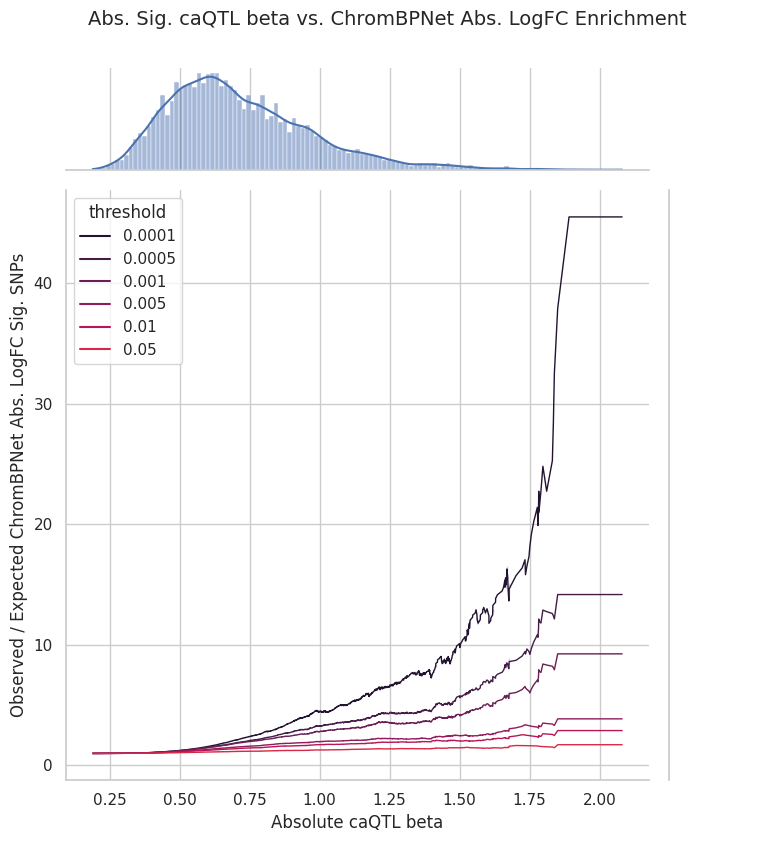

In [63]:
plot_enrichment_curves(sig_caqtls_merged,
                       compare_score='abs_beta', model_score='afr.mean.abs_logfc.pval',
                       compare_score_ascending=False, model_score_ascending=True,
                       subsample=False,
                       title='Abs. Sig. caQTL beta vs. ChromBPNet Abs. LogFC Enrichment',
                       xlabel='Absolute caQTL beta', ylabel='Observed / Expected ChromBPNet Abs. LogFC Sig. SNPs'                    
                      )

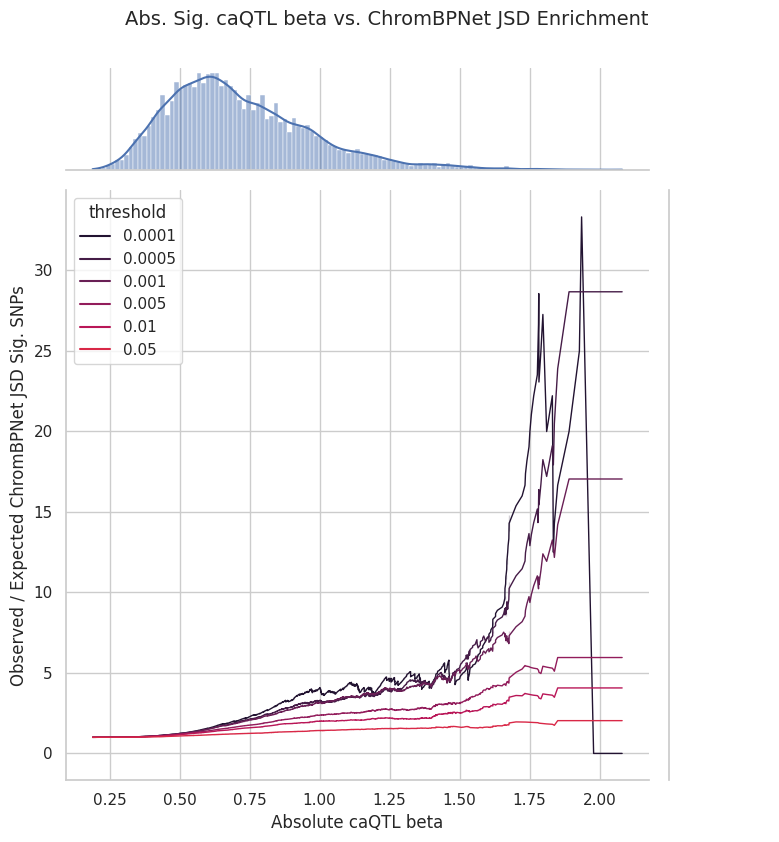

In [64]:
plot_enrichment_curves(sig_caqtls_merged,
                       compare_score='abs_beta', model_score='afr.mean.jsd.pval',
                       compare_score_ascending=False, model_score_ascending=True,
                       subsample=False,
                       title='Abs. Sig. caQTL beta vs. ChromBPNet JSD Enrichment',
                       xlabel='Absolute caQTL beta', ylabel='Observed / Expected ChromBPNet JSD Sig. SNPs'                    
                      )

## Differences between Ancestries

In [65]:
all_caqtls_merged

,chr,pos,allele1,allele2,rsid,Esan.mean.logfc,Esan.mean.abs_logfc,Esan.mean.jsd,Esan.mean.abs_logfc_x_jsd,Esan.mean.abs_logfc_x_jsd_x_max_percentile,...,afr.mean.jsd.pval,eur.mean.abs_logfc.pval,eur.mean.jsd.pval,region,snp,distance,pval,beta,se,abs_beta
0,chr1,866281,C,T,1_866281_C_T,-0.017276,0.035986,0.010862,0.000482,0.000195,...,0.649093,0.519612,0.686427,1:866099:866351,1_866281_C_T,181,0.974280,0.006546,0.202449,0.006546
1,chr1,866300,A,C,1_866300_A_C,-0.009280,0.022847,0.008537,0.000175,0.000082,...,0.800424,0.441420,0.636851,1:866099:866351,1_866300_A_C,200,0.974280,0.006546,0.202449,0.006546
2,chr1,870176,T,A,1_870176_T_A,0.007269,0.019045,0.013279,0.000265,0.000193,...,0.331473,0.251585,0.294618,1:869800:870282,1_870176_T_A,375,0.071532,-0.250142,0.137133,0.250142
3,chr1,904947,G,A,1_904947_G_A,-0.027669,0.027669,0.010101,0.000265,0.000234,...,0.500773,0.799295,0.513734,1:904938:905544,1_904947_G_A,8,0.290840,0.174397,0.164112,0.174397
4,chr1,905373,C,T,1_905373_T_C,-0.132262,0.132262,0.014543,0.001979,0.001549,...,0.187633,0.100221,0.095542,1:904938:905544,1_905373_T_C,434,0.188152,-0.130176,0.098145,0.130176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219377,chr22,50627388,G,A,22_50627388_G_A,0.005296,0.027551,0.010789,0.000299,0.000075,...,0.495623,0.756070,0.526640,22:50627308:50627508,22_50627388_G_A,79,0.405697,-0.136940,0.163901,0.136940
219378,chr22,50628124,C,G,22_50628124_C_G,-0.069978,0.069978,0.019913,0.001445,0.001242,...,0.078649,0.175254,0.090050,22:50627514:50628822,22_50628124_C_G,609,0.742636,0.021773,0.066098,0.021773
219379,chr22,50628493,G,A,22_50628493_G_A,0.025575,0.025575,0.015997,0.000458,0.000383,...,0.292637,0.204932,0.314371,22:50627514:50628822,22_50628493_G_A,978,0.729436,0.028973,0.083502,0.028973
219380,chr22,50628562,C,T,22_50628562_C_T,0.022417,0.028005,0.007993,0.000222,0.000175,...,0.778577,0.745510,0.591567,22:50627514:50628822,22_50628562_C_T,1047,0.191678,-0.076209,0.057921,0.076209


In [66]:
ancestry_order = [ancestry for ancestry in ancestries if not ancestry.startswith('GM12878')] + \
                 [ancestry for ancestry in ancestries if ancestry.startswith('GM12878')]

ancestry_order

['Maasai',
 'Yoruba',
 'Luhya',
 'Gambian',
 'Esan',
 'Mende',
 'GM12878.ENCSR637XSC',
 'GM12878.ENCSR095QNB']

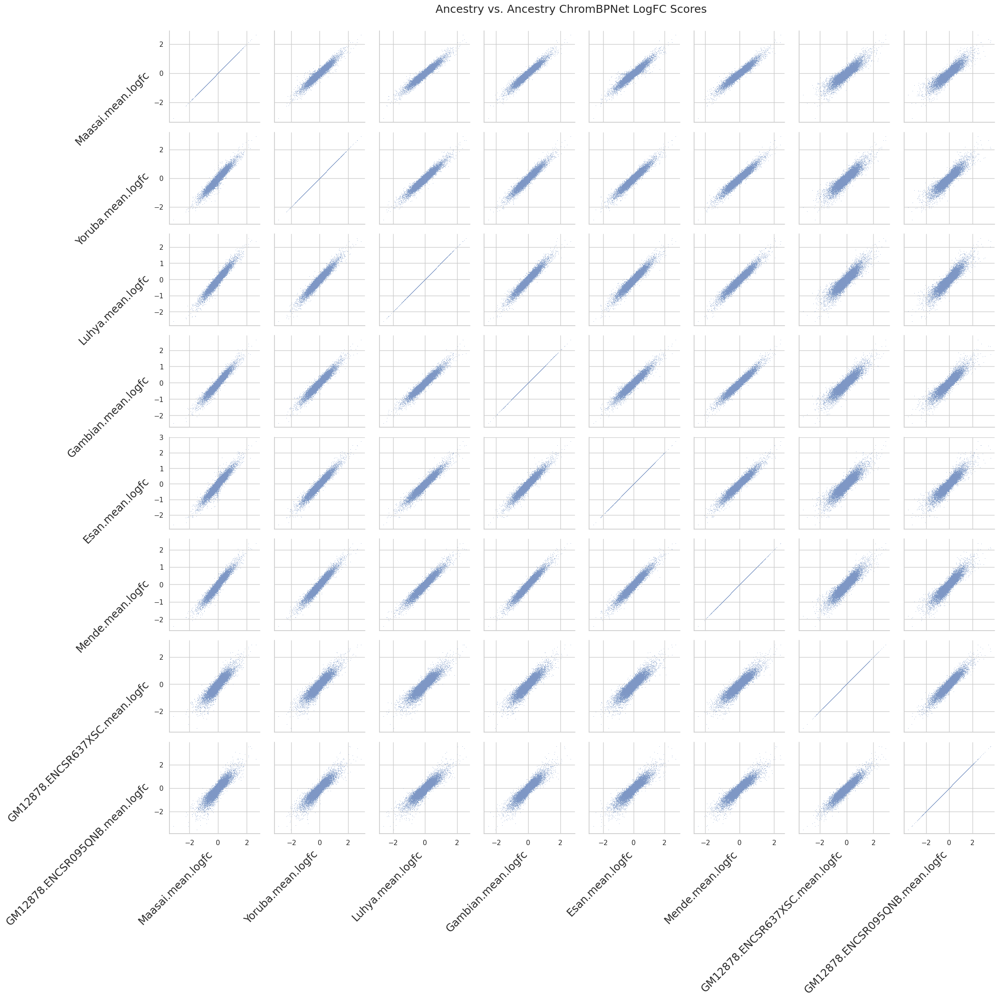

In [67]:
g = sns.PairGrid(data=all_caqtls_merged, vars=[i + '.mean.logfc' for i in ancestry_order])
g.map(sns.scatterplot, s=0.5)

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # set y labels alignment
    # ax.yaxis.get_label().set_horizontalalignment('right')

# xlabels,ylabels = [i for i in range(8)],[i for i in range(8)]
# g.set(xlabel=xlabels, ylabel=ylabels)

g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet LogFC Scores', fontsize=18)

plt.show()

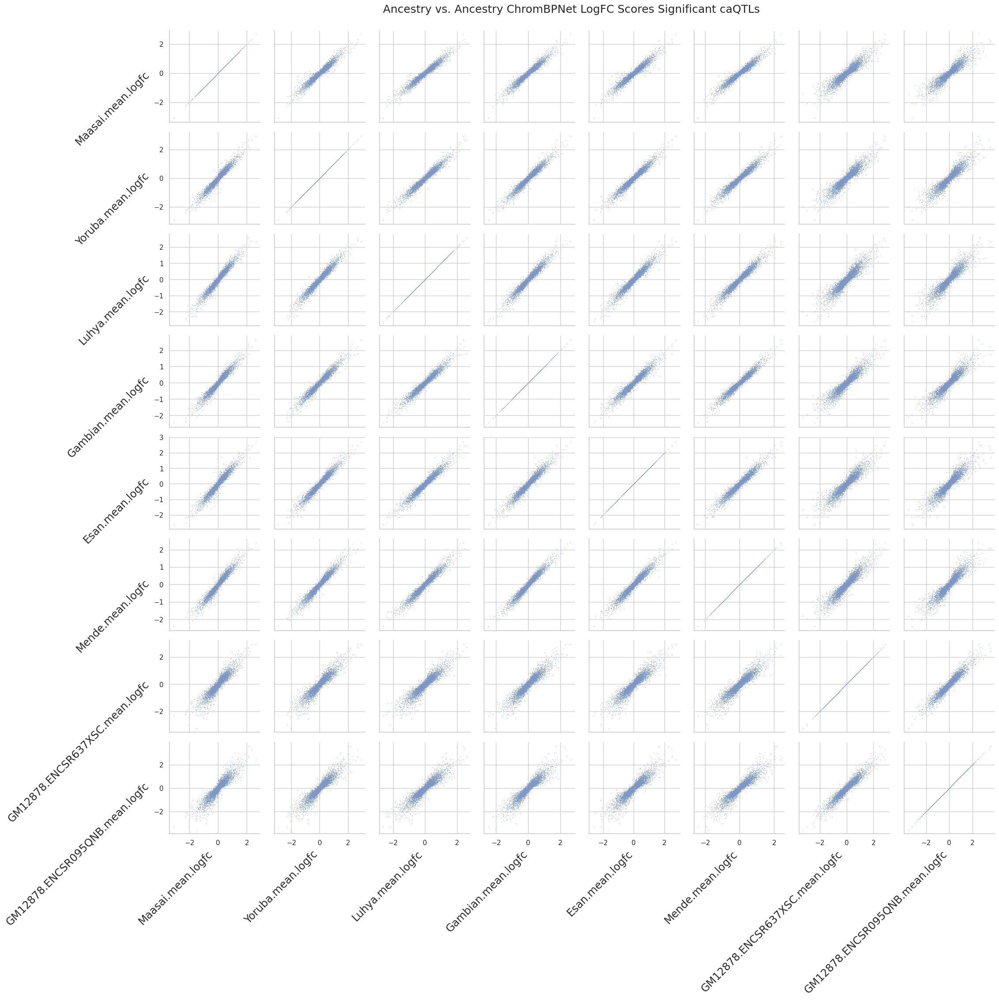

In [68]:
g = sns.PairGrid(data=sig_caqtls_merged, vars=[i + '.mean.logfc' for i in ancestry_order])
g.map(sns.scatterplot, s=0.5)

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # set y labels alignment
    # ax.yaxis.get_label().set_horizontalalignment('right')

# xlabels,ylabels = [i for i in range(8)],[i for i in range(8)]
# g.set(xlabel=xlabels, ylabel=ylabels)

g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet LogFC Scores Significant caQTLs', fontsize=18)

plt.show()

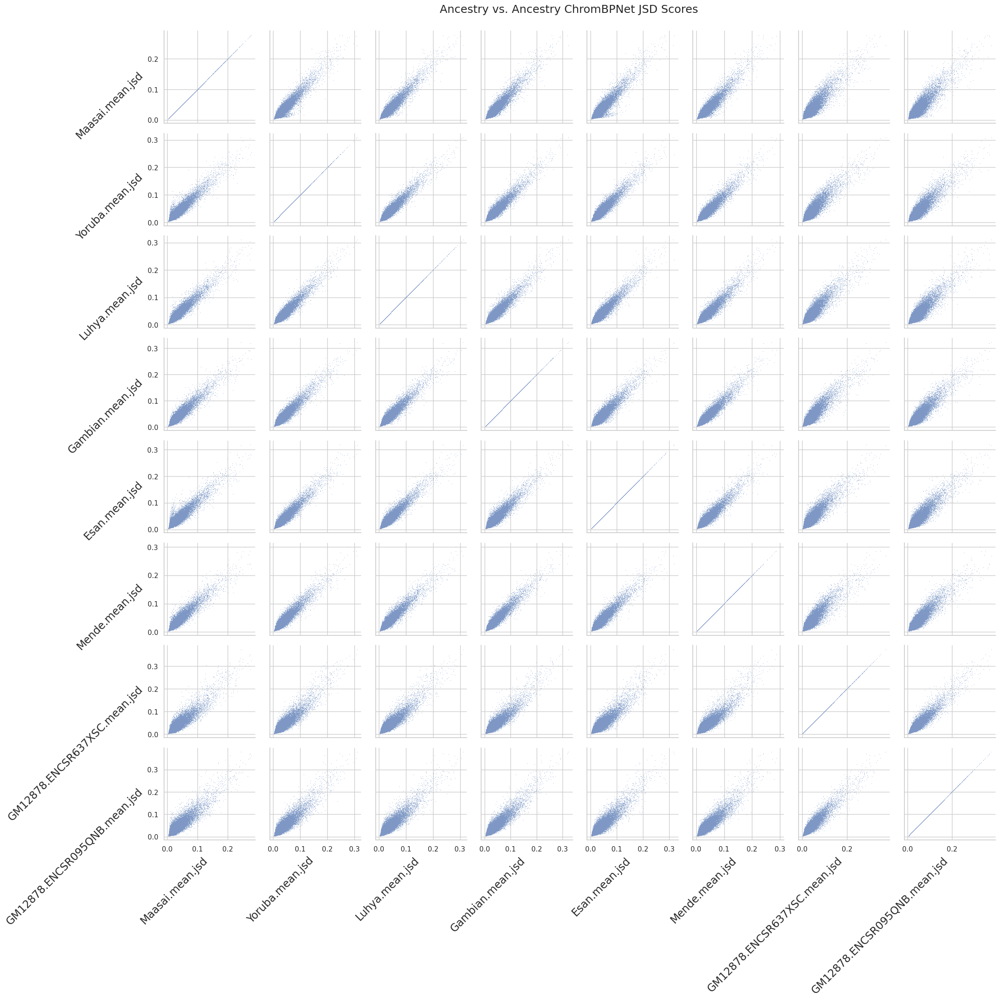

In [69]:
g = sns.PairGrid(data=all_caqtls_merged, vars=[i + '.mean.jsd' for i in ancestry_order])
g.map(sns.scatterplot, s=0.5)

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # set y labels alignment
    # ax.yaxis.get_label().set_horizontalalignment('right')

# xlabels,ylabels = [i for i in range(8)],[i for i in range(8)]
# g.set(xlabel=xlabels, ylabel=ylabels)

g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet JSD Scores', fontsize=18)

plt.show()

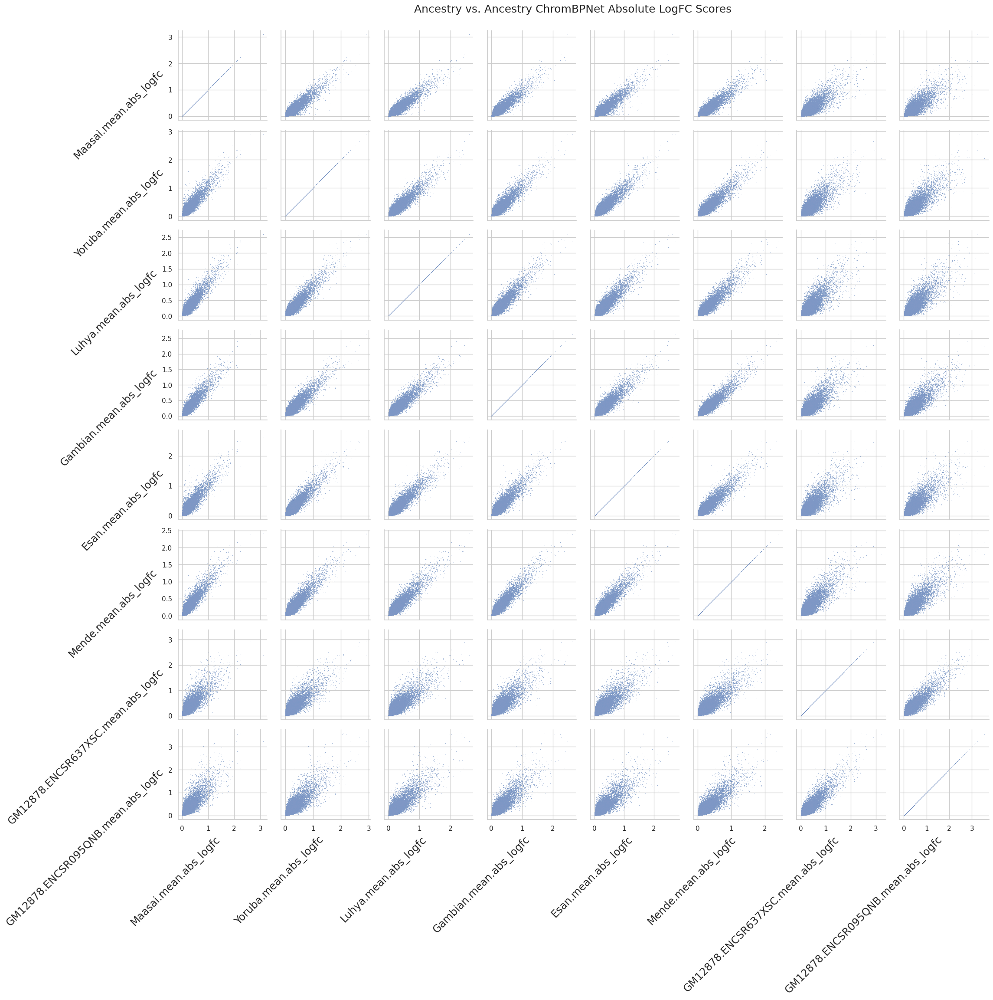

In [70]:
g = sns.PairGrid(data=all_caqtls_merged, vars=[i + '.mean.abs_logfc' for i in ancestry_order])
g.map(sns.scatterplot, s=0.5)

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45, horizontalalignment='right', fontsize='x-large')
    # set y labels alignment
    # ax.yaxis.get_label().set_horizontalalignment('right')

# xlabels,ylabels = [i for i in range(8)],[i for i in range(8)]
# g.set(xlabel=xlabels, ylabel=ylabels)

g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet Absolute LogFC Scores', fontsize=18)

plt.show()

In [71]:
logfc_dict = {x: [] for x in ancestries}
logfc_dict['ancestry'] = []

for outer_ancestry in ancestries:
    logfc_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        logfc_dict[ancestry].append(pearsonr(sig_caqtls_merged[outer_ancestry + '.mean.logfc'],
                                             sig_caqtls_merged[ancestry + '.mean.logfc'])[0])
        
logfc_df = pd.DataFrame(logfc_dict)
logfc_df.set_index('ancestry', inplace=True)

logfc_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.921404,0.928462,0.928646,0.933214,0.925904,0.952034,0.934423
Maasai,0.921404,1.000000,0.964792,0.968982,0.967564,0.960997,0.921218,0.965765
Yoruba,0.928462,0.964792,1.000000,0.970077,0.968167,0.969556,0.928391,0.968452
Luhya,0.928646,0.968982,0.970077,1.000000,0.969562,0.967084,0.929612,0.969014
Gambian,0.933214,0.967564,0.968167,0.969562,1.000000,0.964643,0.932511,0.972361
Esan,0.925904,0.960997,0.969556,0.967084,0.964643,1.000000,0.926866,0.968069
GM12878.ENCSR095QNB,0.952034,0.921218,0.928391,0.929612,0.932511,0.926866,1.000000,0.934573
Mende,0.934423,0.965765,0.968452,0.969014,0.972361,0.968069,0.934573,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet LogFC Pearson Correlation Significnat caQTLs')

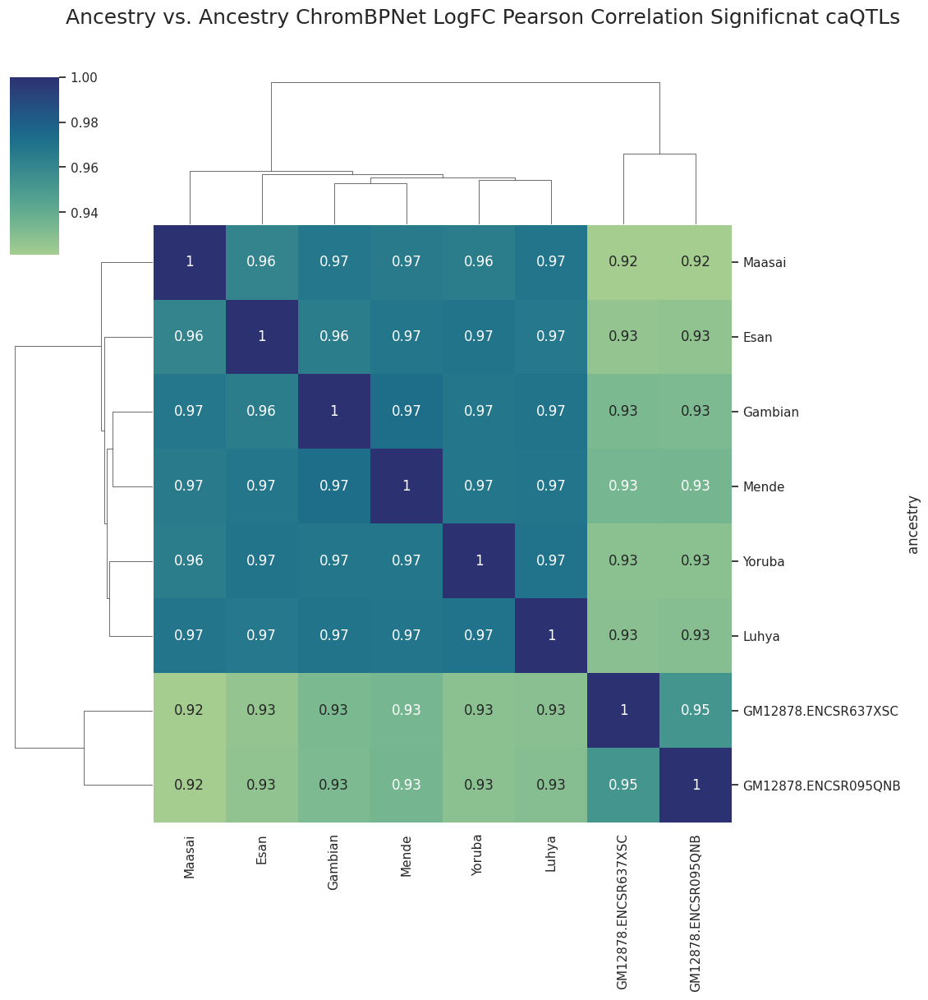

In [72]:
g = sns.clustermap(logfc_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet LogFC Pearson Correlation Significnat caQTLs', fontsize=18, y=1.05)

In [73]:
logfc_spearman_dict = {x: [] for x in ancestries}
logfc_spearman_dict['ancestry'] = []

for outer_ancestry in ancestries:
    logfc_spearman_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        logfc_spearman_dict[ancestry].append(spearmanr(all_caqtls_merged[outer_ancestry + '.mean.logfc'],
                                                       all_caqtls_merged[ancestry + '.mean.logfc'])[0])
        
logfc_spearman_df = pd.DataFrame(logfc_spearman_dict)
logfc_spearman_df.set_index('ancestry', inplace=True)

logfc_spearman_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.725336,0.726062,0.729915,0.731750,0.730396,0.747365,0.735876
Maasai,0.725336,1.000000,0.815148,0.833779,0.843754,0.831707,0.743318,0.847226
Yoruba,0.726062,0.815148,1.000000,0.815875,0.820790,0.819558,0.743323,0.825178
Luhya,0.729915,0.833779,0.815875,1.000000,0.833745,0.827299,0.746121,0.836135
Gambian,0.731750,0.843754,0.820790,0.833745,1.000000,0.833000,0.755584,0.849358
Esan,0.730396,0.831707,0.819558,0.827299,0.833000,1.000000,0.749138,0.839370
GM12878.ENCSR095QNB,0.747365,0.743318,0.743323,0.746121,0.755584,0.749138,1.000000,0.756942
Mende,0.735876,0.847226,0.825178,0.836135,0.849358,0.839370,0.756942,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet LogFC Spearman Correlation')

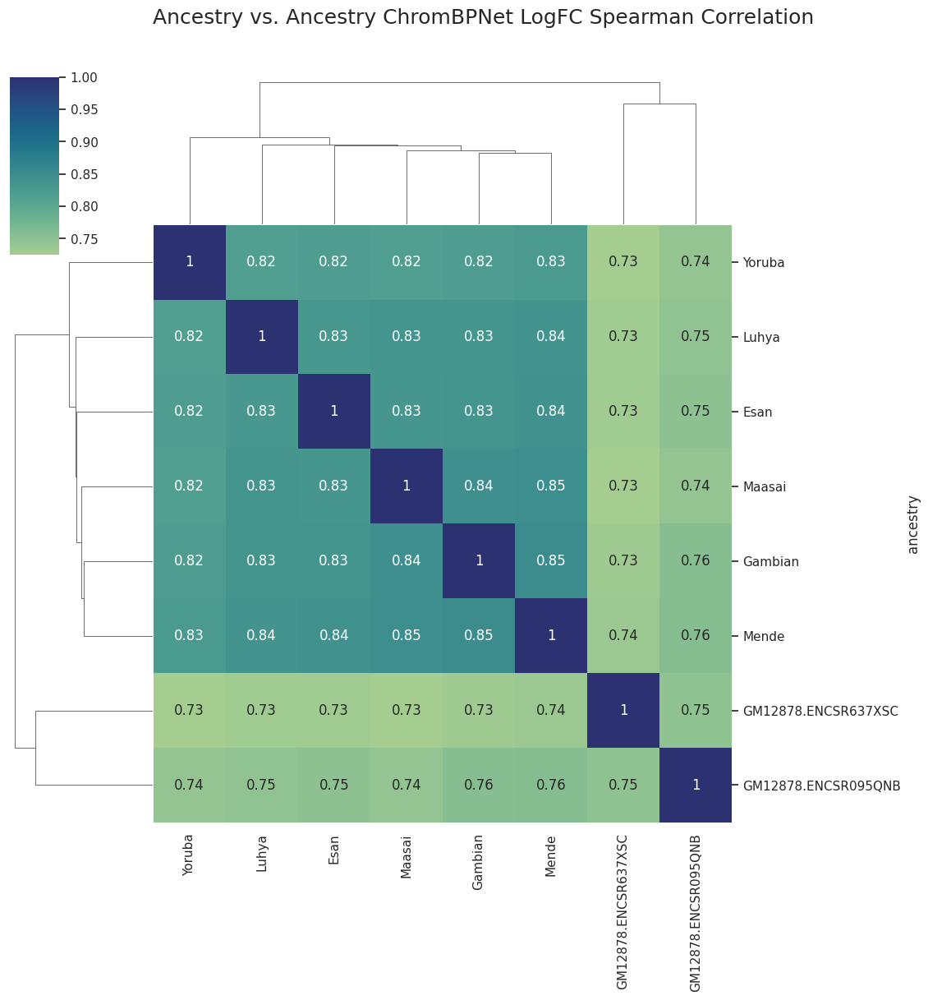

In [74]:
g = sns.clustermap(logfc_spearman_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet LogFC Spearman Correlation', fontsize=18, y=1.05)

In [75]:
jsd_dict = {x: [] for x in ancestries}
jsd_dict['ancestry'] = []

for outer_ancestry in ancestries:
    jsd_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        jsd_dict[ancestry].append(pearsonr(sig_caqtls_merged[outer_ancestry + '.mean.jsd'],
                                             sig_caqtls_merged[ancestry + '.mean.jsd'])[0])
        
jsd_df = pd.DataFrame(jsd_dict)
jsd_df.set_index('ancestry', inplace=True)

jsd_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.932454,0.939108,0.942355,0.940038,0.938390,0.956828,0.933711
Maasai,0.932454,1.000000,0.962870,0.966359,0.962763,0.958346,0.931820,0.957902
Yoruba,0.939108,0.962870,1.000000,0.970269,0.967169,0.969004,0.938692,0.966588
Luhya,0.942355,0.966359,0.970269,1.000000,0.966313,0.966483,0.938742,0.964428
Gambian,0.940038,0.962763,0.967169,0.966313,1.000000,0.961599,0.944993,0.968640
Esan,0.938390,0.958346,0.969004,0.966483,0.961599,1.000000,0.938222,0.964945
GM12878.ENCSR095QNB,0.956828,0.931820,0.938692,0.938742,0.944993,0.938222,1.000000,0.939929
Mende,0.933711,0.957902,0.966588,0.964428,0.968640,0.964945,0.939929,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet JSD Pearson Correlation Significant caQTLs')

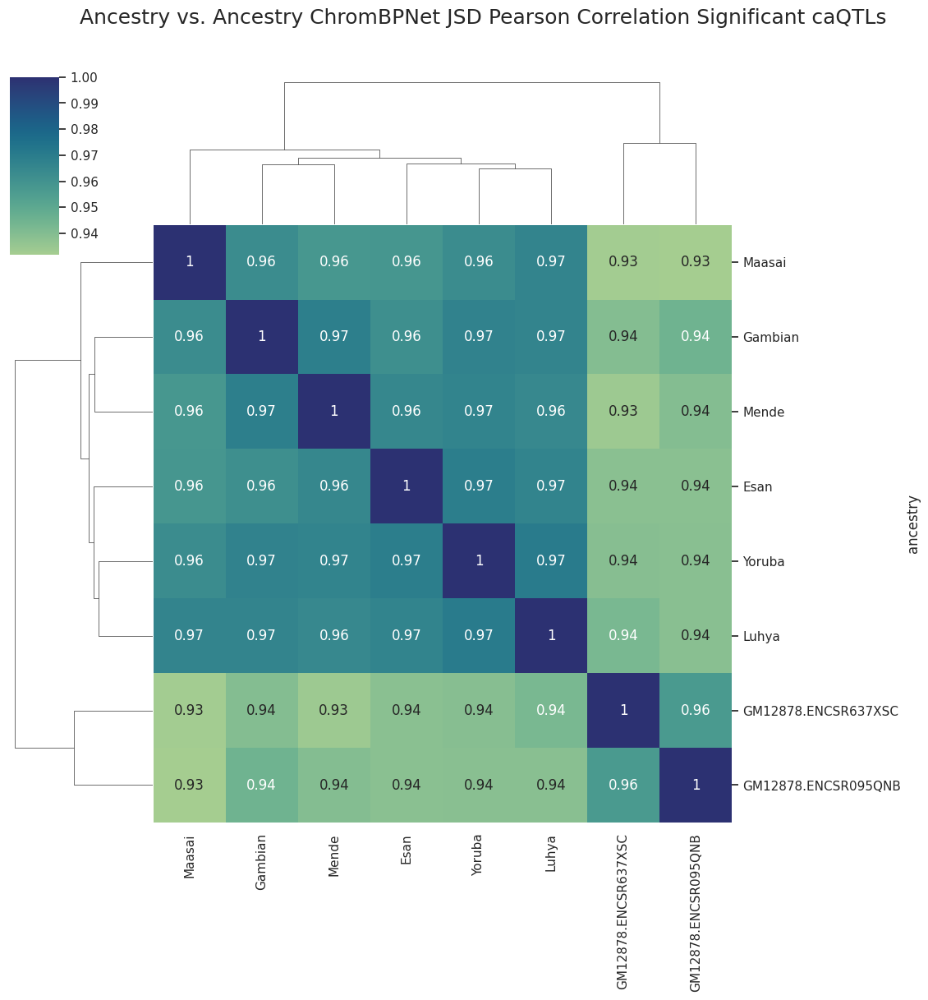

In [76]:
g = sns.clustermap(jsd_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet JSD Pearson Correlation Significant caQTLs', fontsize=18, y=1.05)

In [77]:
jsd_spearman_dict = {x: [] for x in ancestries}
jsd_spearman_dict['ancestry'] = []

for outer_ancestry in ancestries:
    jsd_spearman_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        jsd_spearman_dict[ancestry].append(spearmanr(all_caqtls_merged[outer_ancestry + '.mean.jsd'],
                                                     all_caqtls_merged[ancestry + '.mean.jsd'])[0])
        
jsd_spearman_df = pd.DataFrame(jsd_spearman_dict)
jsd_spearman_df.set_index('ancestry', inplace=True)

jsd_spearman_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.832263,0.855122,0.860422,0.857622,0.855370,0.897453,0.845267
Maasai,0.832263,1.000000,0.913717,0.914083,0.911800,0.904380,0.843239,0.913363
Yoruba,0.855122,0.913717,1.000000,0.921732,0.917703,0.917787,0.864355,0.917887
Luhya,0.860422,0.914083,0.921732,1.000000,0.918786,0.915593,0.867176,0.915601
Gambian,0.857622,0.911800,0.917703,0.918786,1.000000,0.911858,0.876578,0.918177
Esan,0.855370,0.904380,0.917787,0.915593,0.911858,1.000000,0.864042,0.912842
GM12878.ENCSR095QNB,0.897453,0.843239,0.864355,0.867176,0.876578,0.864042,1.000000,0.858825
Mende,0.845267,0.913363,0.917887,0.915601,0.918177,0.912842,0.858825,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet JSD Spearman Correlation')

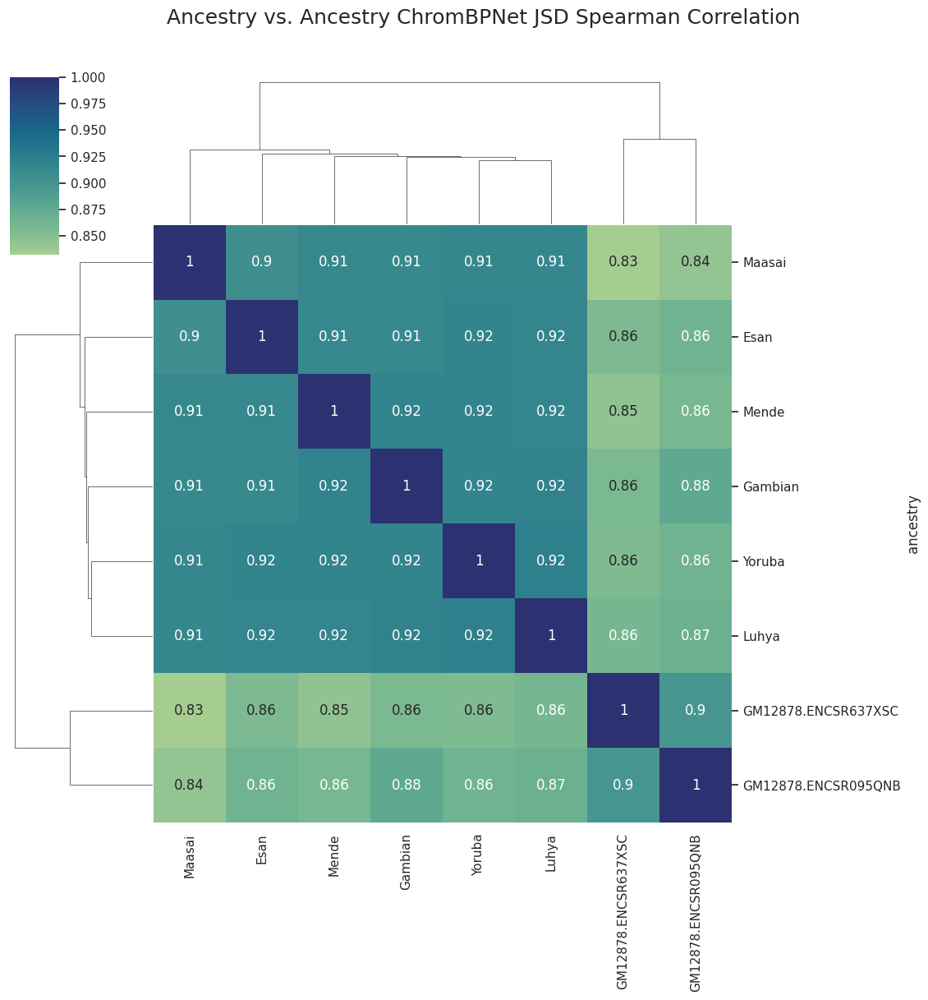

In [78]:
g = sns.clustermap(jsd_spearman_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet JSD Spearman Correlation', fontsize=18, y=1.05)

In [79]:
abs_logfc_dict = {x: [] for x in ancestries}
abs_logfc_dict['ancestry'] = []

for outer_ancestry in ancestries:
    abs_logfc_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        abs_logfc_dict[ancestry].append(pearsonr(all_caqtls_merged[outer_ancestry + '.mean.abs_logfc'],
                                                 all_caqtls_merged[ancestry + '.mean.abs_logfc'])[0])
        
abs_logfc_df = pd.DataFrame(abs_logfc_dict)
abs_logfc_df.set_index('ancestry', inplace=True)

abs_logfc_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.859903,0.868623,0.868828,0.873074,0.865540,0.899405,0.876781
Maasai,0.859903,1.000000,0.926300,0.934053,0.932591,0.921946,0.863711,0.930416
Yoruba,0.868623,0.926300,1.000000,0.932986,0.929515,0.931597,0.872667,0.930795
Luhya,0.868828,0.934053,0.932986,1.000000,0.933487,0.929479,0.874765,0.933391
Gambian,0.873074,0.932591,0.929515,0.933487,1.000000,0.925617,0.880847,0.938333
Esan,0.865540,0.921946,0.931597,0.929479,0.925617,1.000000,0.871959,0.931292
GM12878.ENCSR095QNB,0.899405,0.863711,0.872667,0.874765,0.880847,0.871959,1.000000,0.882657
Mende,0.876781,0.930416,0.930795,0.933391,0.938333,0.931292,0.882657,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet Absolute LogFC Pearson Correlation')

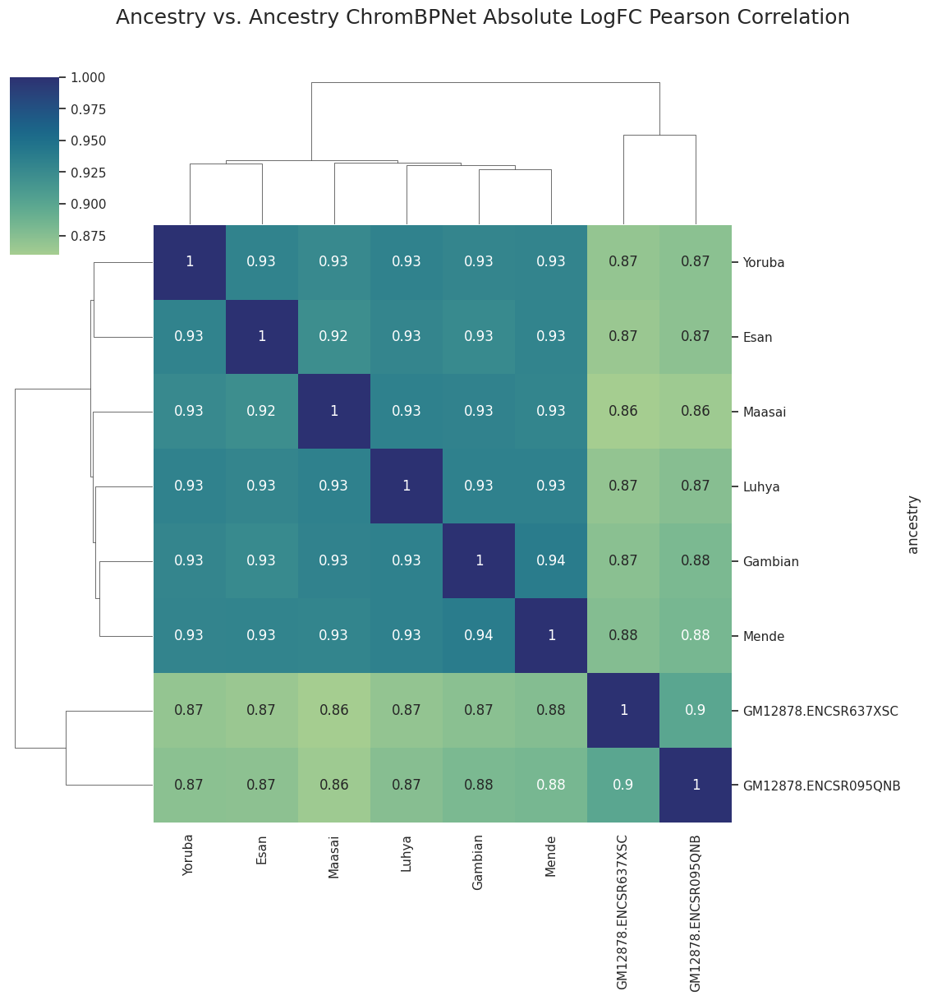

In [80]:
g = sns.clustermap(abs_logfc_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet Absolute LogFC Pearson Correlation', fontsize=18, y=1.05)

In [81]:
abs_logfc_spearman_dict = {x: [] for x in ancestries}
abs_logfc_spearman_dict['ancestry'] = []

for outer_ancestry in ancestries:
    abs_logfc_spearman_dict['ancestry'].append(outer_ancestry)
    for ancestry in ancestries:
        abs_logfc_spearman_dict[ancestry].append(spearmanr(all_caqtls_merged[outer_ancestry + '.mean.abs_logfc'],
                                                           all_caqtls_merged[ancestry + '.mean.abs_logfc'])[0])
        
abs_logfc_spearman_df = pd.DataFrame(abs_logfc_spearman_dict)
abs_logfc_spearman_df.set_index('ancestry', inplace=True)

abs_logfc_spearman_df

,GM12878.ENCSR637XSC,Maasai,Yoruba,Luhya,Gambian,Esan,GM12878.ENCSR095QNB,Mende
ancestry,,,,,,,,
GM12878.ENCSR637XSC,1.000000,0.798404,0.803931,0.805779,0.804326,0.804212,0.816252,0.805159
Maasai,0.798404,1.000000,0.854764,0.863147,0.865013,0.857324,0.807148,0.864528
Yoruba,0.803931,0.854764,1.000000,0.861597,0.860263,0.859971,0.812474,0.858929
Luhya,0.805779,0.863147,0.861597,1.000000,0.865565,0.862032,0.815685,0.862769
Gambian,0.804326,0.865013,0.860263,0.865565,1.000000,0.860646,0.818086,0.867965
Esan,0.804212,0.857324,0.859971,0.862032,0.860646,1.000000,0.814560,0.862293
GM12878.ENCSR095QNB,0.816252,0.807148,0.812474,0.815685,0.818086,0.814560,1.000000,0.815562
Mende,0.805159,0.864528,0.858929,0.862769,0.867965,0.862293,0.815562,1.000000


Text(0.5, 1.05, 'Ancestry vs. Ancestry ChromBPNet Absolute LogFC Spearman Correlation')

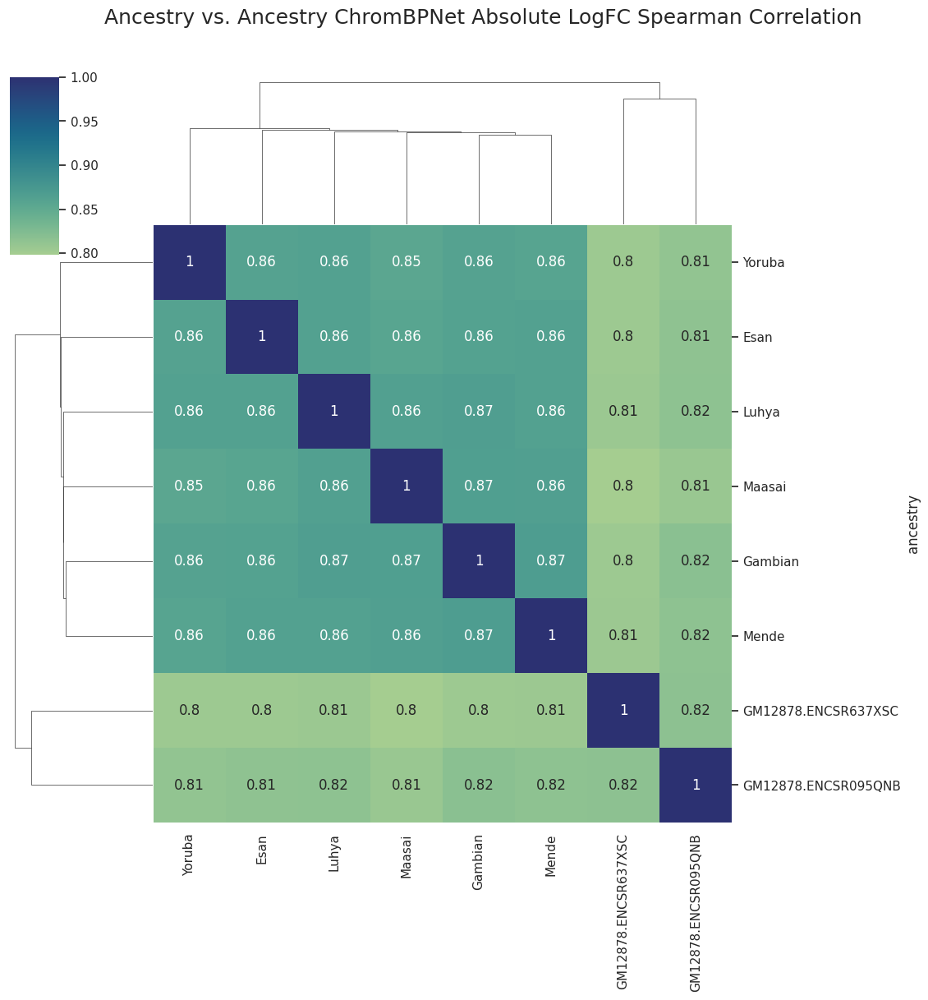

In [82]:
g = sns.clustermap(abs_logfc_spearman_df, annot=True, cmap="crest")
g.fig.set_figwidth(12)
g.fig.set_figheight(12)
g.fig.suptitle('Ancestry vs. Ancestry ChromBPNet Absolute LogFC Spearman Correlation', fontsize=18, y=1.05)

Pearson: 0.8411040268022593
Spearman: 0.6994769070890783


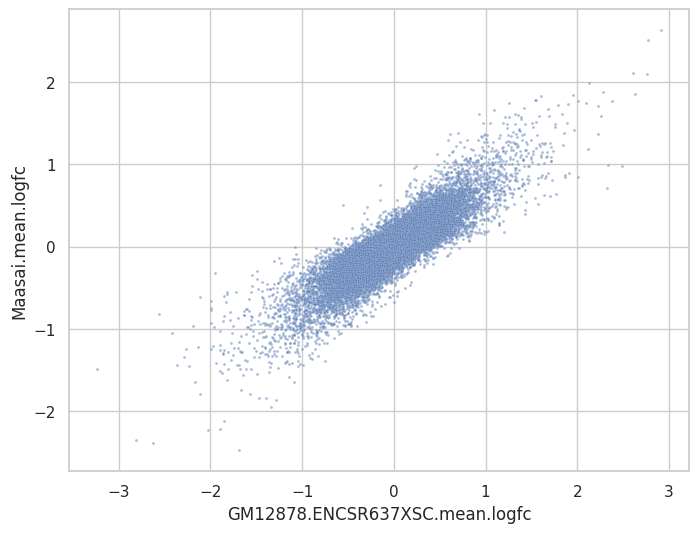

Pearson: 0.8462736166364541
Spearman: 0.6991724561478525


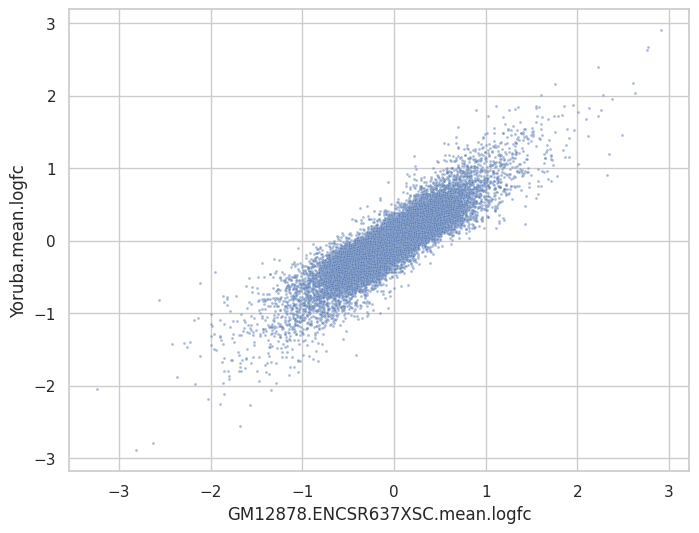

Pearson: 0.8502849954103318
Spearman: 0.7041809576129894


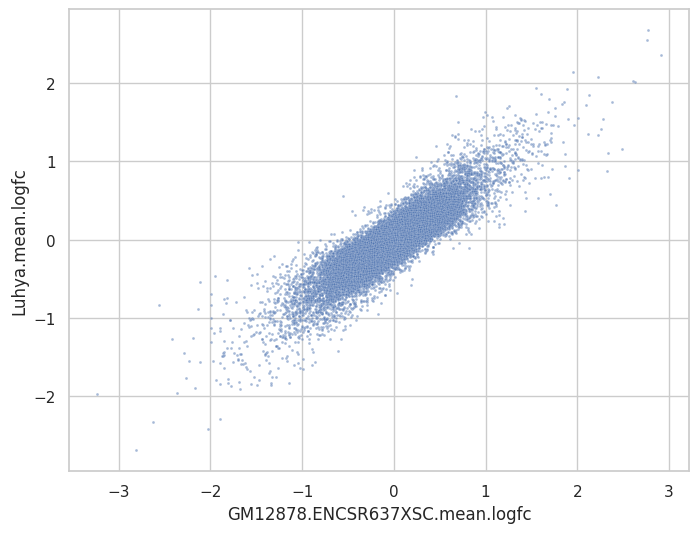

Pearson: 0.8518381152096897
Spearman: 0.7043137215608419


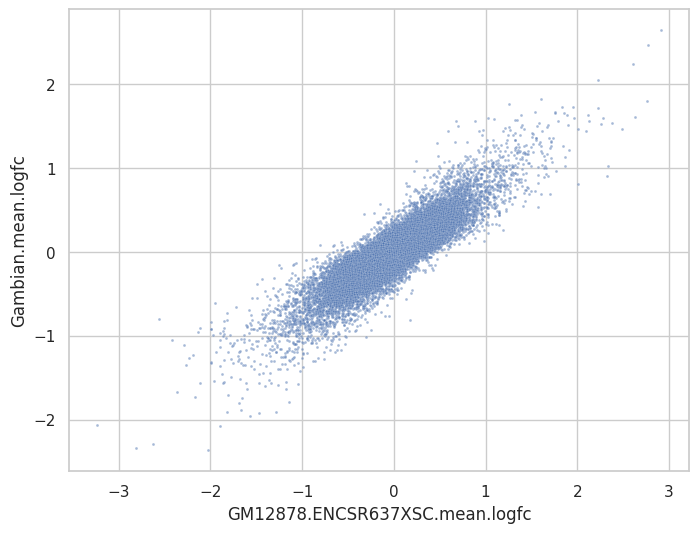

Pearson: 0.8472558290608585
Spearman: 0.7034859219712057


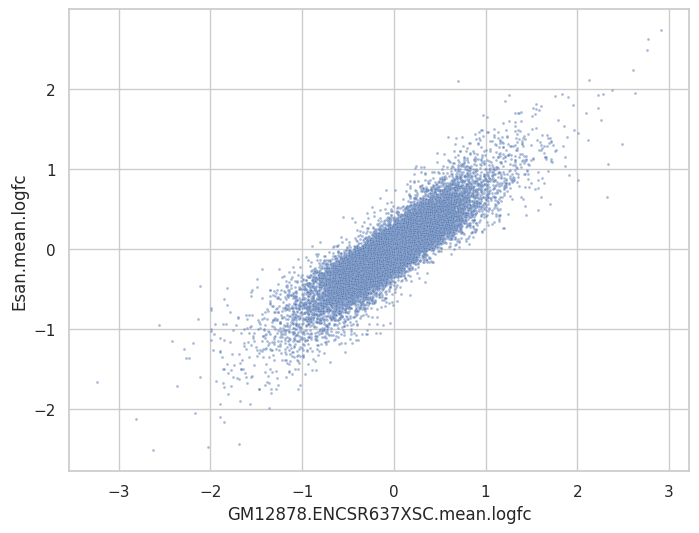

Pearson: 0.8777365543368699
Spearman: 0.7252754963815475


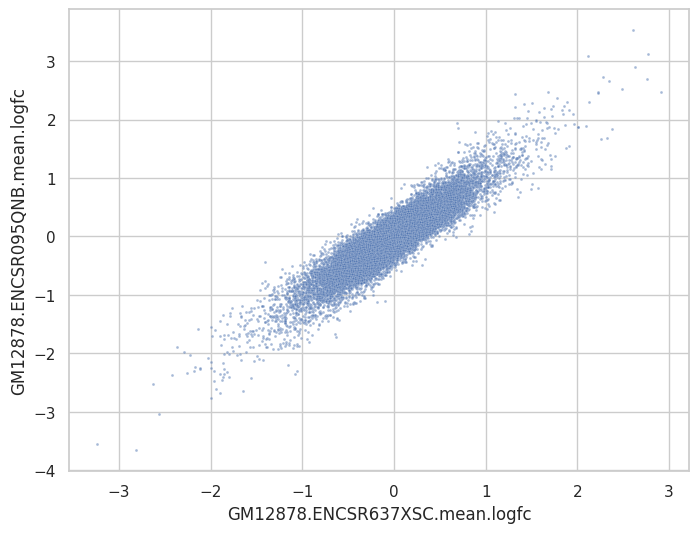

Pearson: 0.8583021963925399
Spearman: 0.7100606021436121


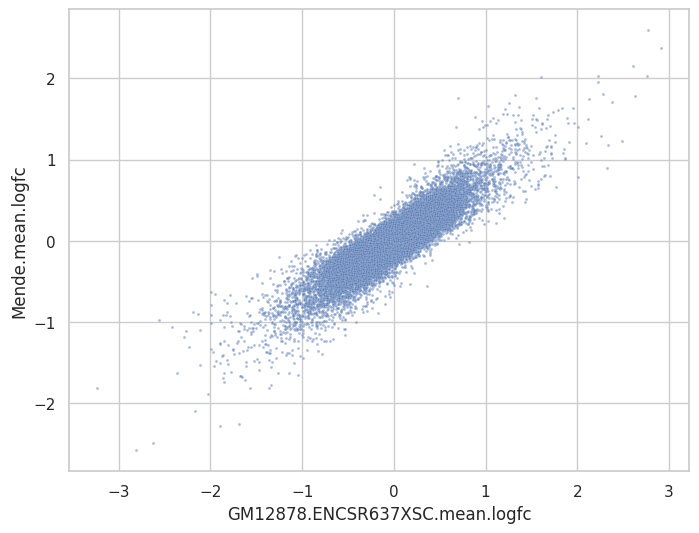

Pearson: 0.8411040268022593
Spearman: 0.6994769070890783


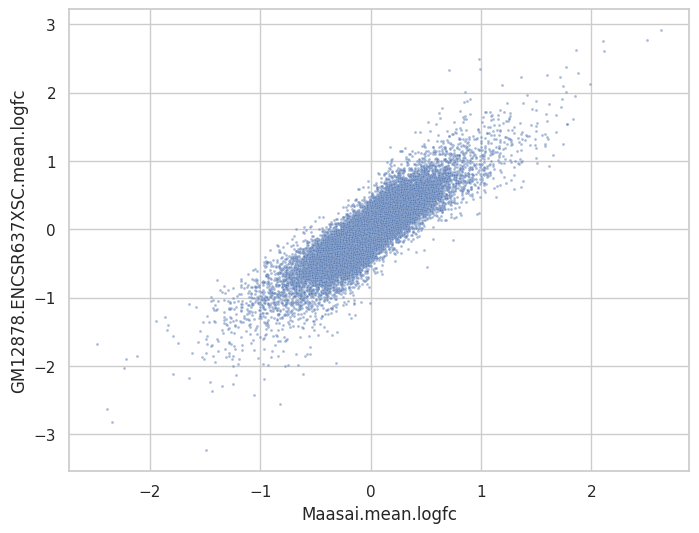

Pearson: 0.9139599317890704
Spearman: 0.7928516657896135


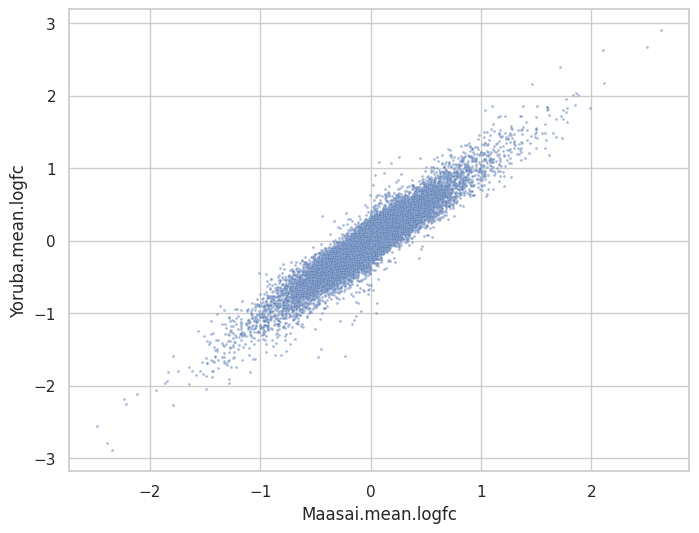

Pearson: 0.9248138071177541
Spearman: 0.8132046661437086


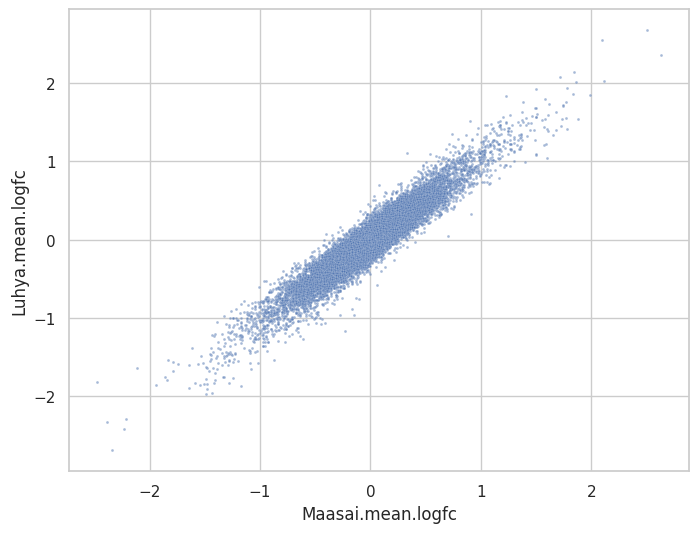

Pearson: 0.925957267834403
Spearman: 0.8271706193429276


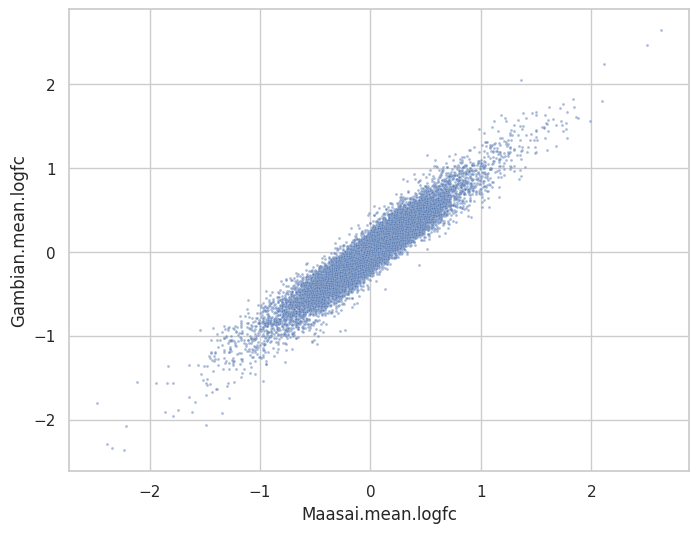

Pearson: 0.913772545672138
Spearman: 0.812886526055885


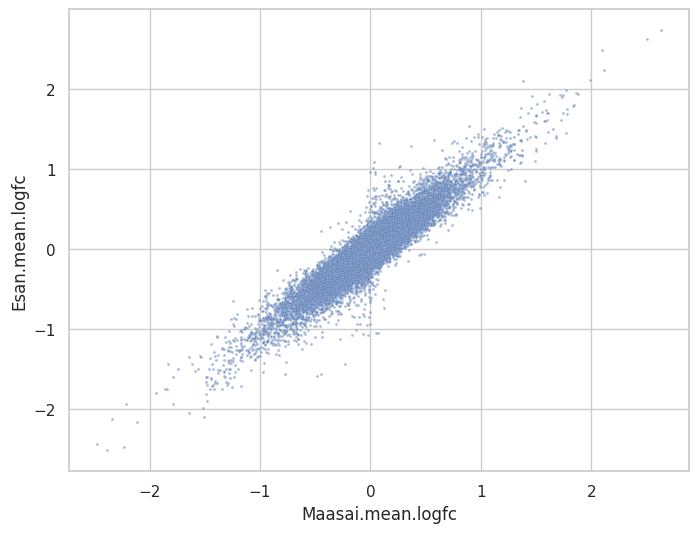

Pearson: 0.849999833054997
Spearman: 0.7188576946868737


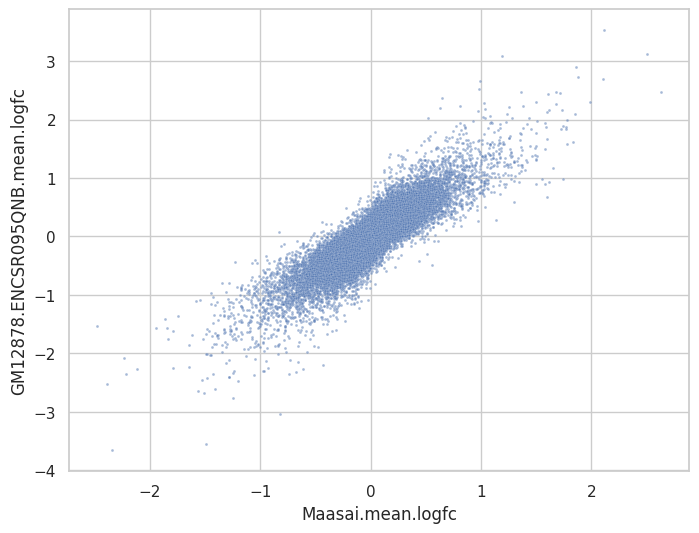

Pearson: 0.9246884690815796
Spearman: 0.8324328011043209


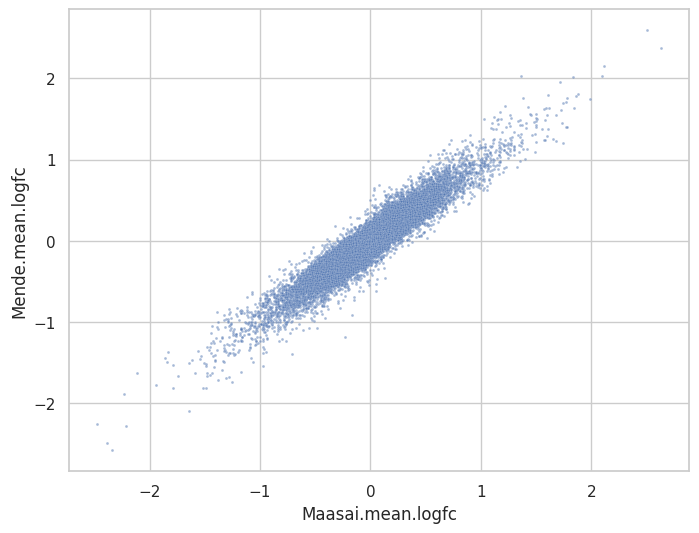

Pearson: 0.8462736166364541
Spearman: 0.6991724561478526


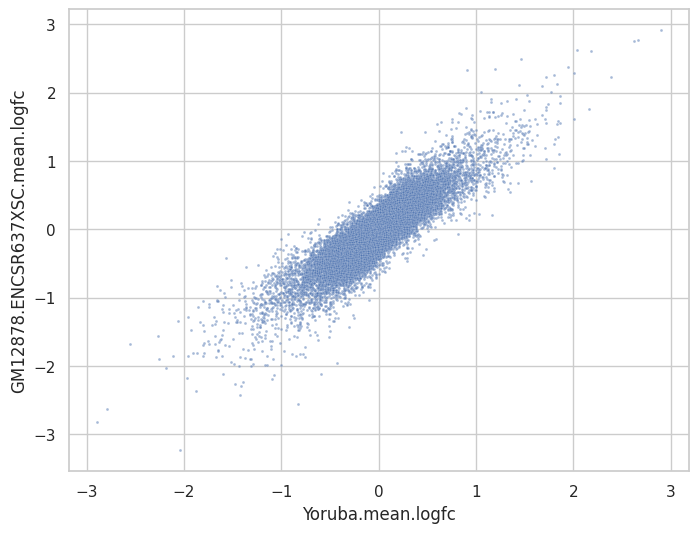

Pearson: 0.9139599317890704
Spearman: 0.7928516657896135


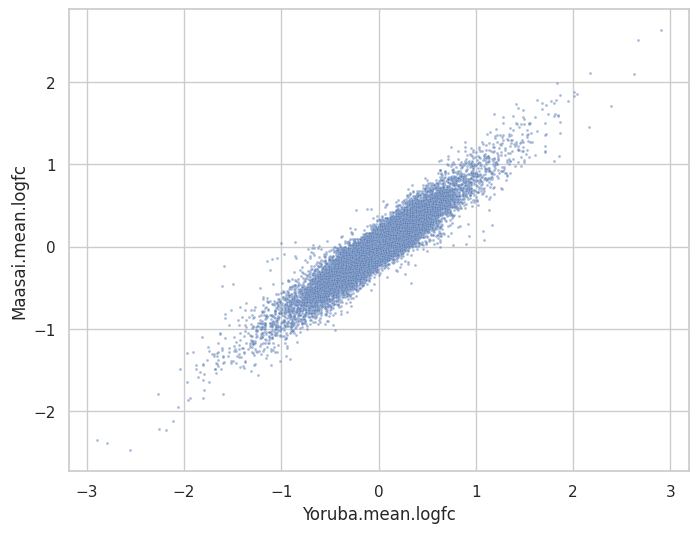

Pearson: 0.9203881222493153
Spearman: 0.7921237523369119


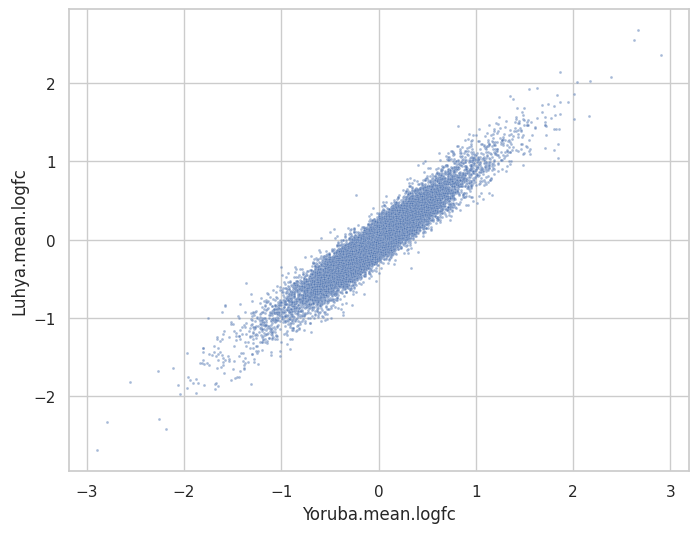

Pearson: 0.9194436876901786
Spearman: 0.7994195076929583


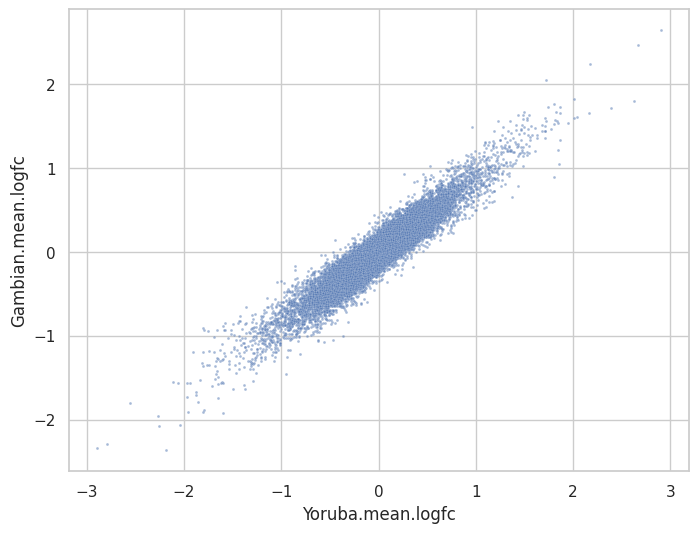

Pearson: 0.920785625617862
Spearman: 0.7947312645217143


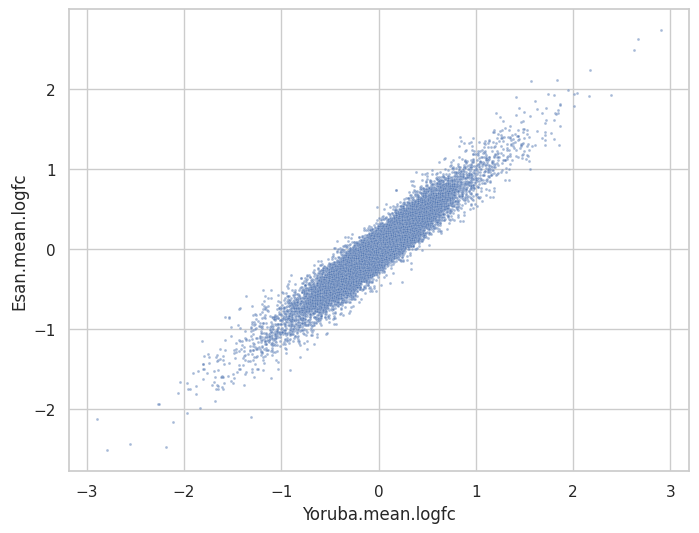

Pearson: 0.8554468879227621
Spearman: 0.7160194821035534


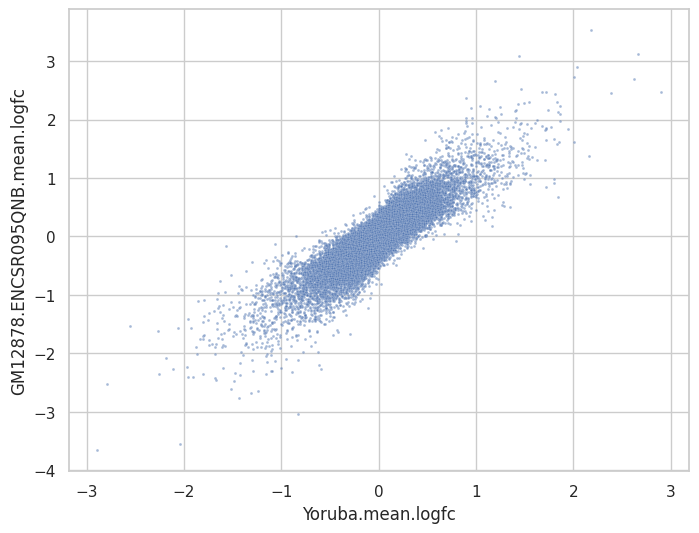

Pearson: 0.9204746660811407
Spearman: 0.8032543592063721


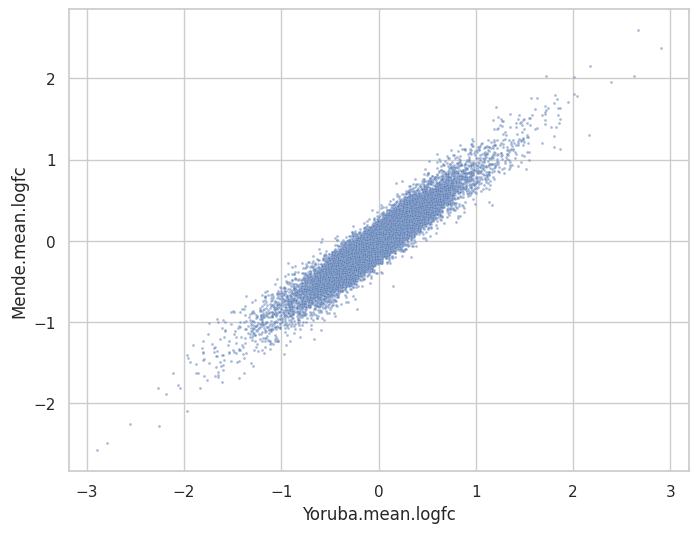

Pearson: 0.8502849954103318
Spearman: 0.7041809576129894


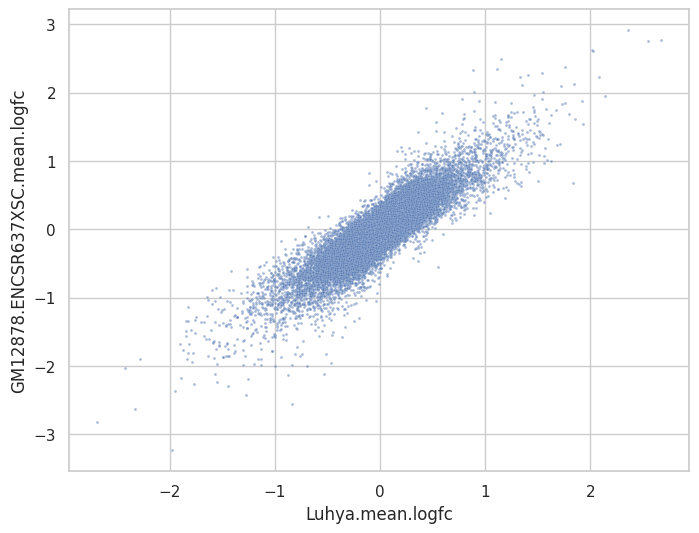

Pearson: 0.9248138071177541
Spearman: 0.8132046661437086


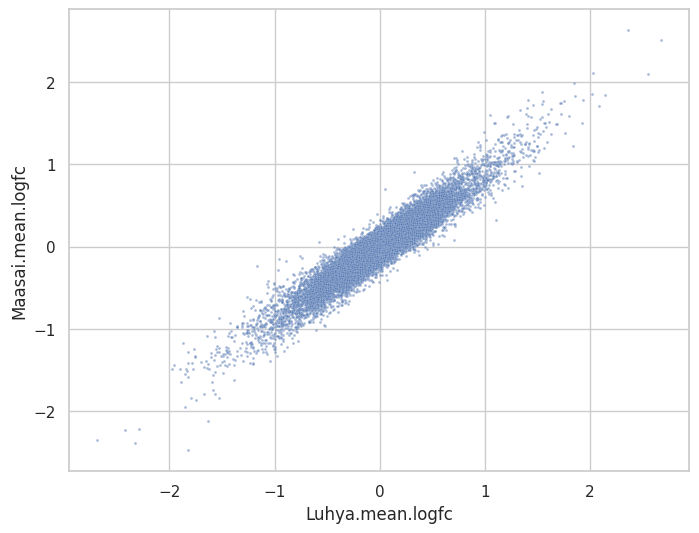

Pearson: 0.9203881222493153
Spearman: 0.7921237523369118


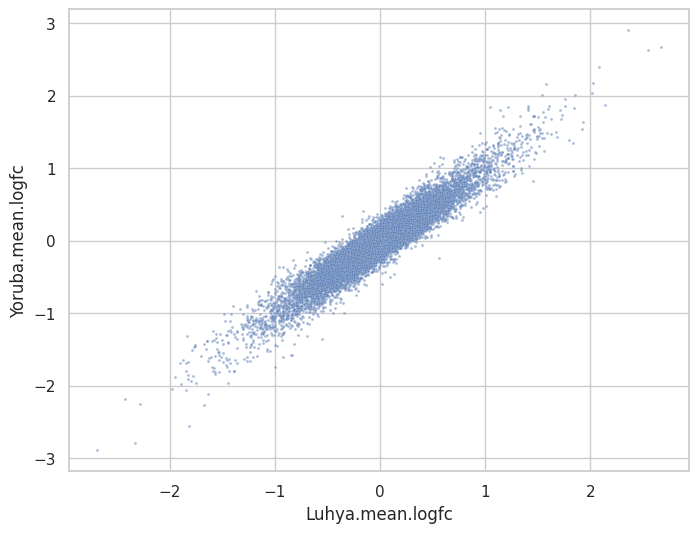

Pearson: 0.9249450944750107
Spearman: 0.81352310968352


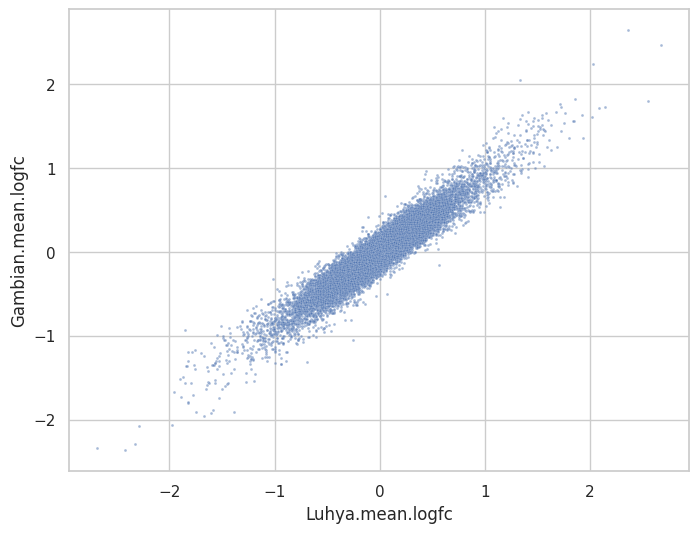

Pearson: 0.9205312785455517
Spearman: 0.8061448084650219


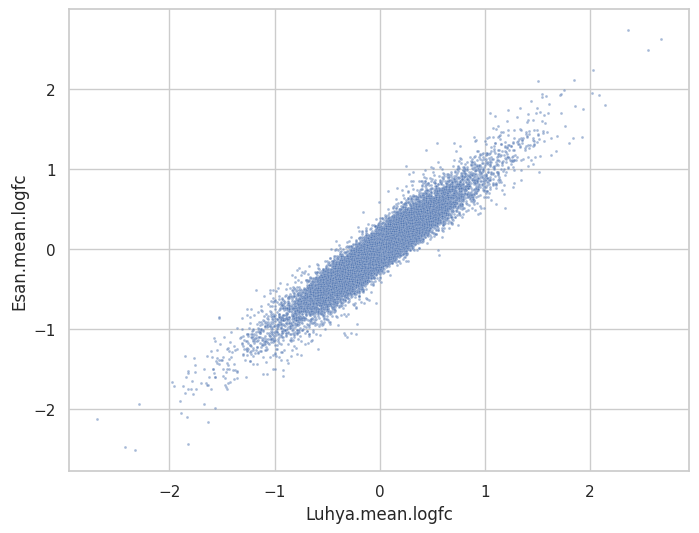

Pearson: 0.8603927958439019
Spearman: 0.720344071183067


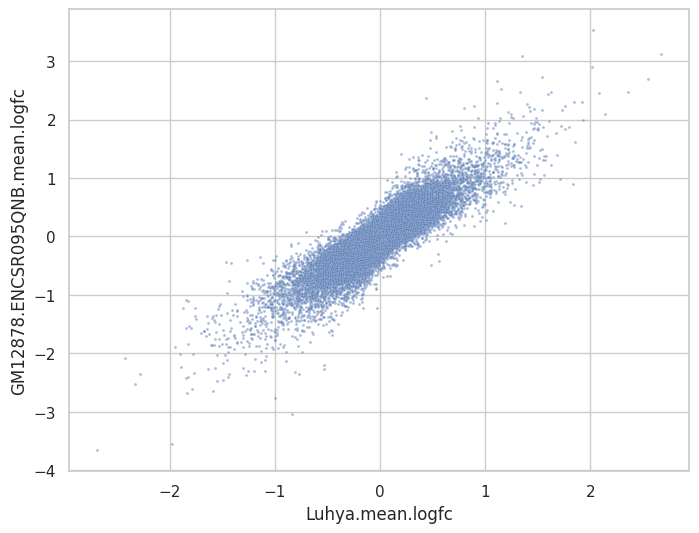

Pearson: 0.9256201778877189
Spearman: 0.8167970570141502


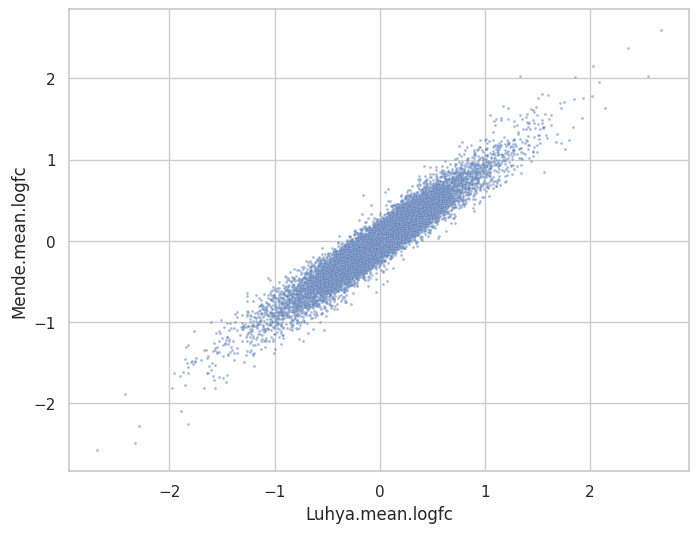

Pearson: 0.8518381152096897
Spearman: 0.7043137215608419


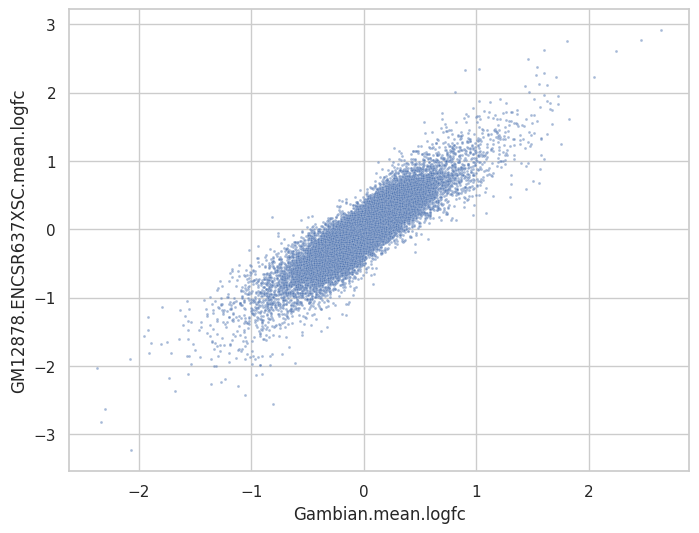

Pearson: 0.925957267834403
Spearman: 0.8271706193429277


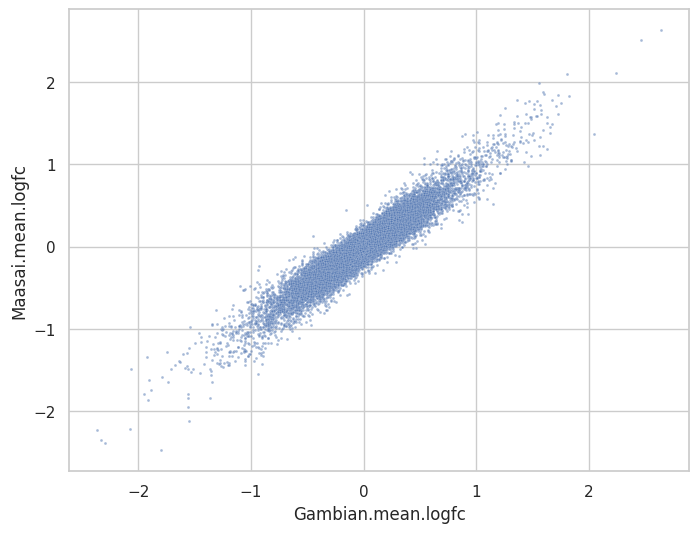

Pearson: 0.9194436876901786
Spearman: 0.7994195076929584


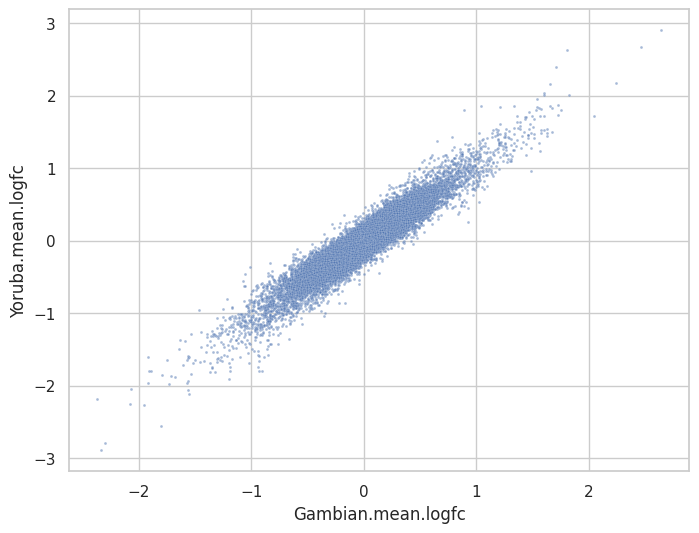

Pearson: 0.9249450944750107
Spearman: 0.8135231096835199


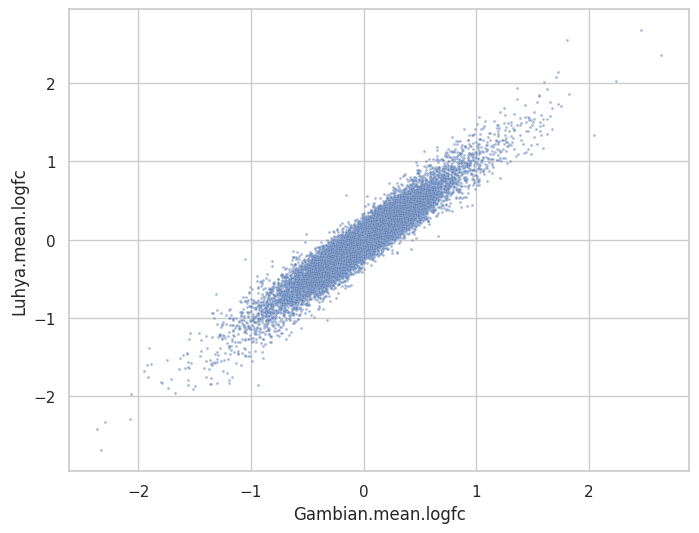

Pearson: 0.9178836734218045
Spearman: 0.8126447578104846


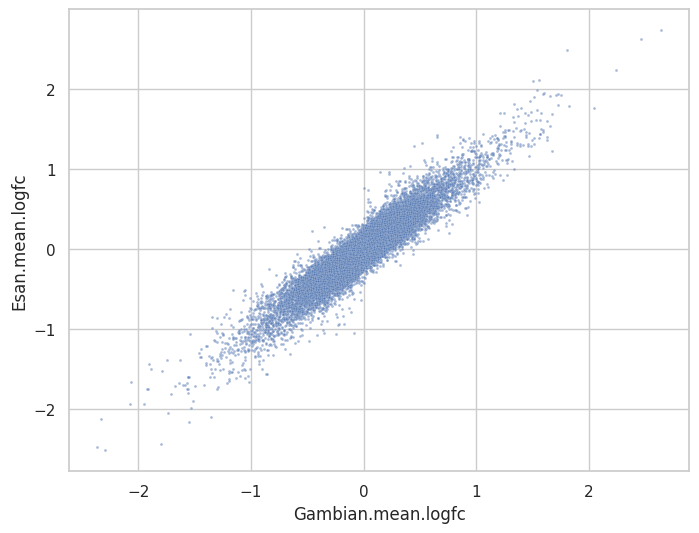

Pearson: 0.865049046051367
Spearman: 0.7299746997192541


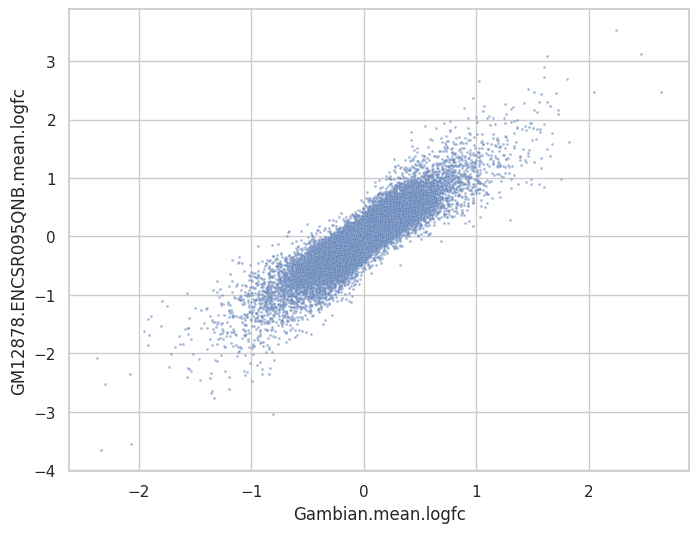

Pearson: 0.9310629785775567
Spearman: 0.833438397904813


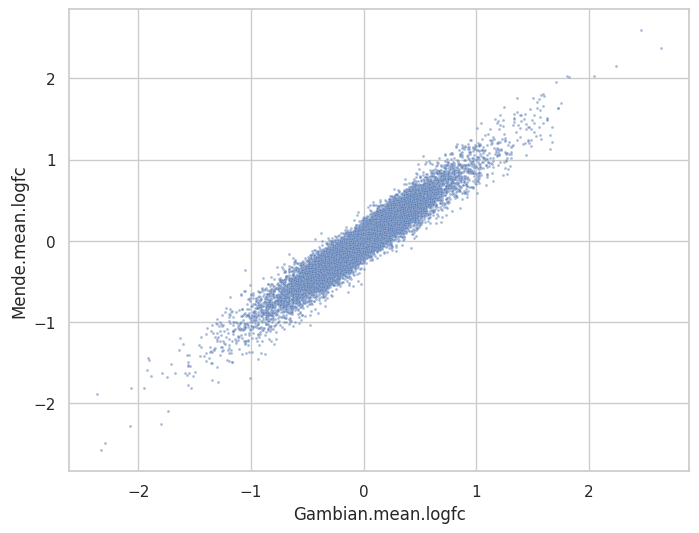

Pearson: 0.8472558290608585
Spearman: 0.7034859219712057


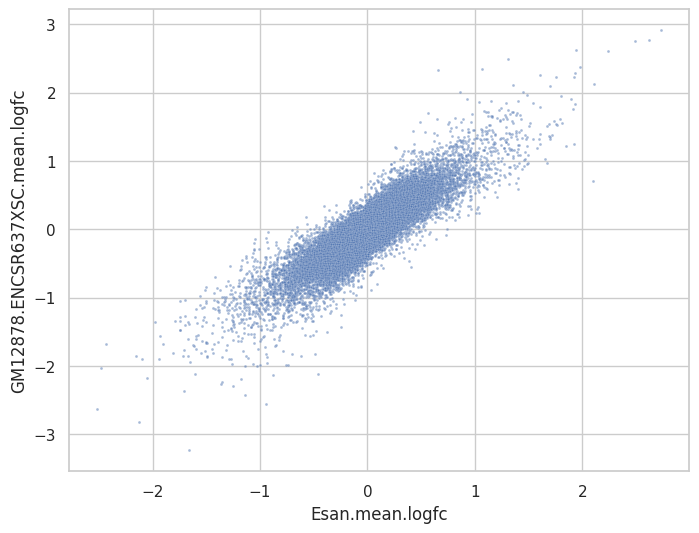

Pearson: 0.913772545672138
Spearman: 0.8128865260558849


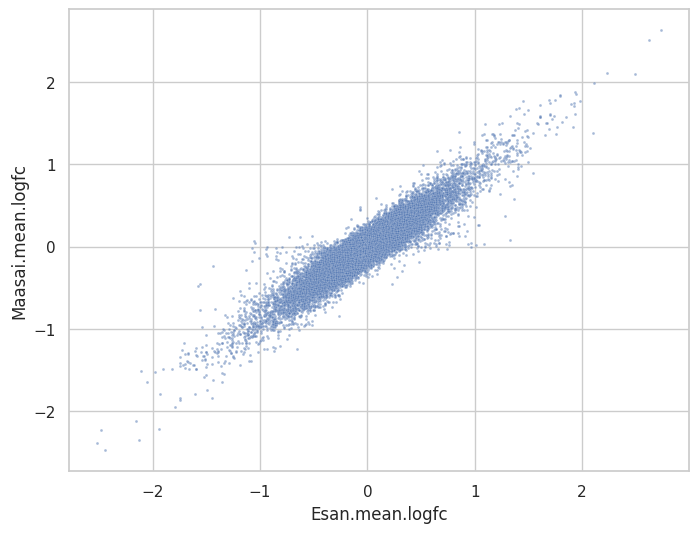

Pearson: 0.920785625617862
Spearman: 0.7947312645217144


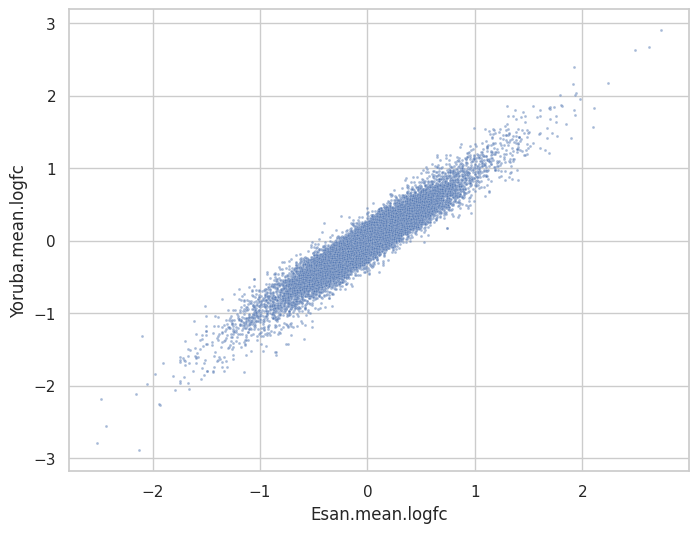

Pearson: 0.9205312785455517
Spearman: 0.8061448084650218


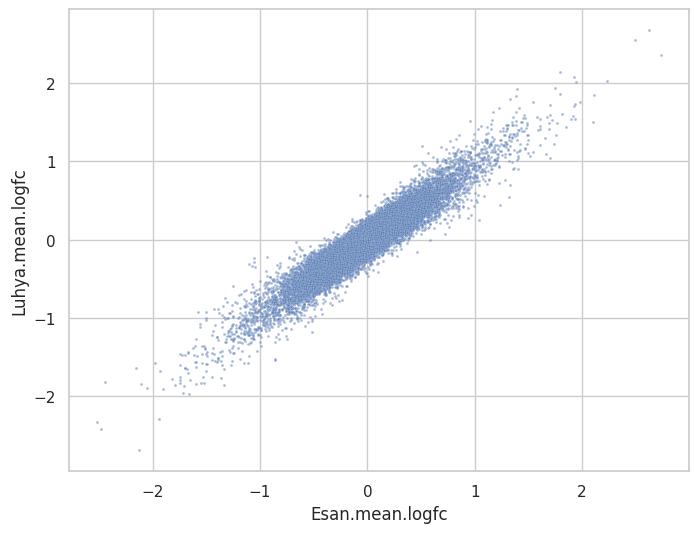

Pearson: 0.9178836734218045
Spearman: 0.8126447578104846


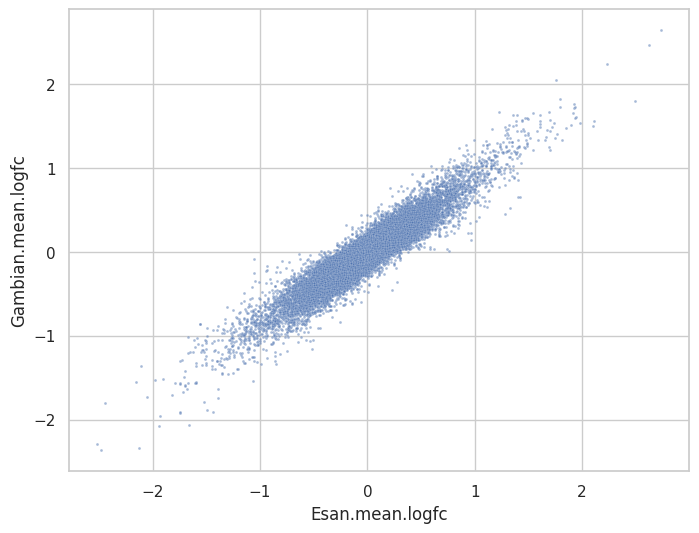

Pearson: 0.8591011460748151
Spearman: 0.7233451439704154


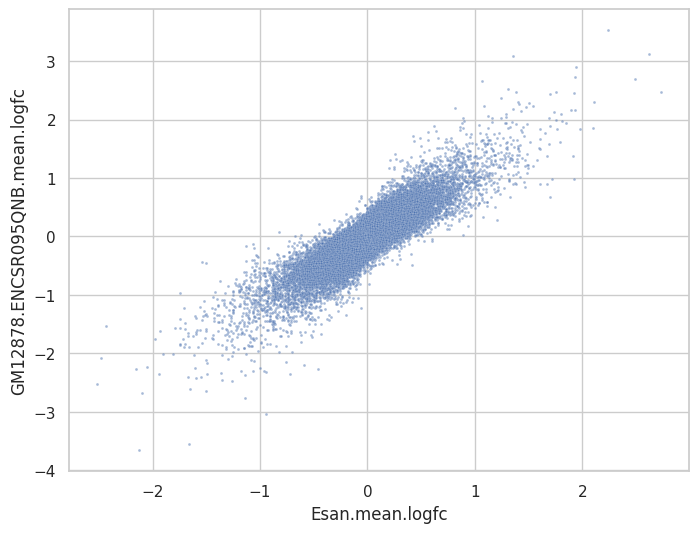

Pearson: 0.9239205816329628
Spearman: 0.8212378662804274


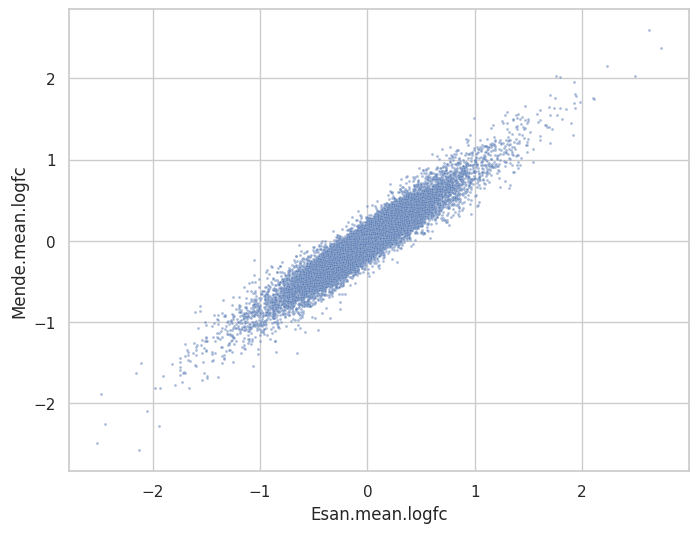

Pearson: 0.8777365543368699
Spearman: 0.7252754963815474


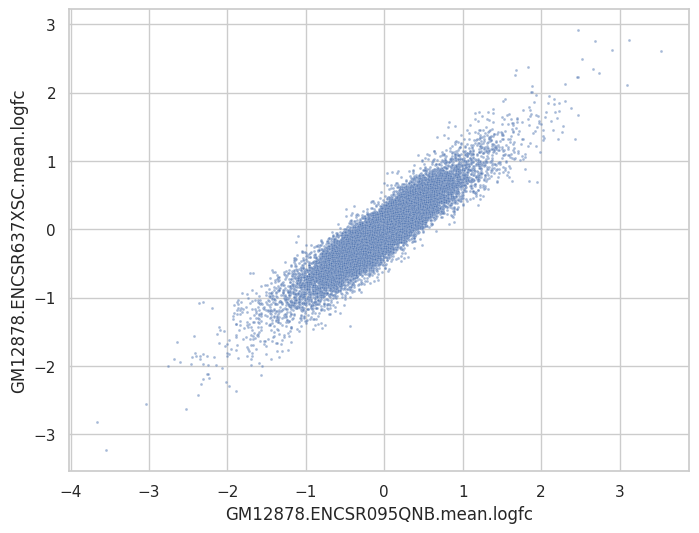

Pearson: 0.849999833054997
Spearman: 0.7188576946868737


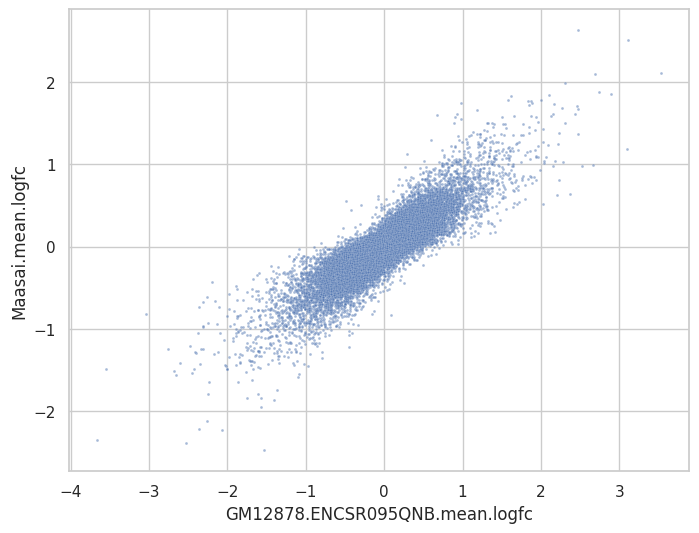

Pearson: 0.8554468879227621
Spearman: 0.7160194821035534


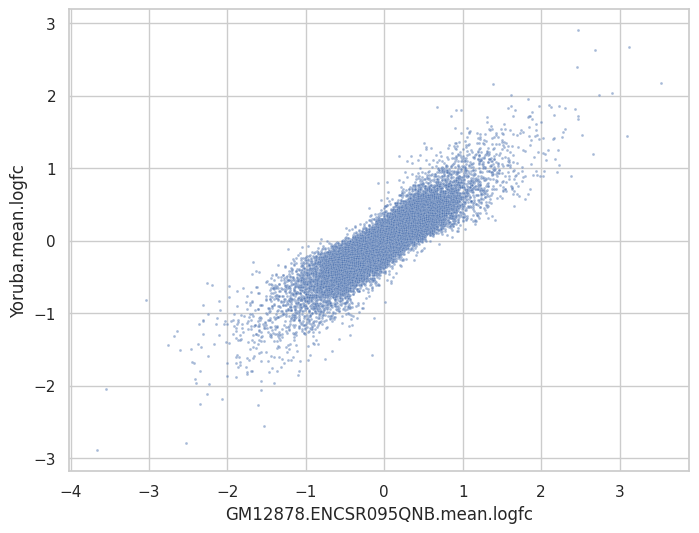

Pearson: 0.8603927958439019
Spearman: 0.720344071183067


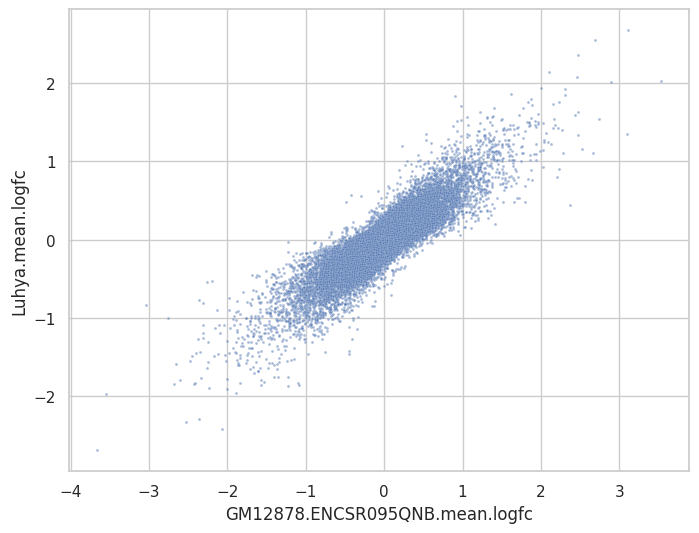

Pearson: 0.865049046051367
Spearman: 0.7299746997192541


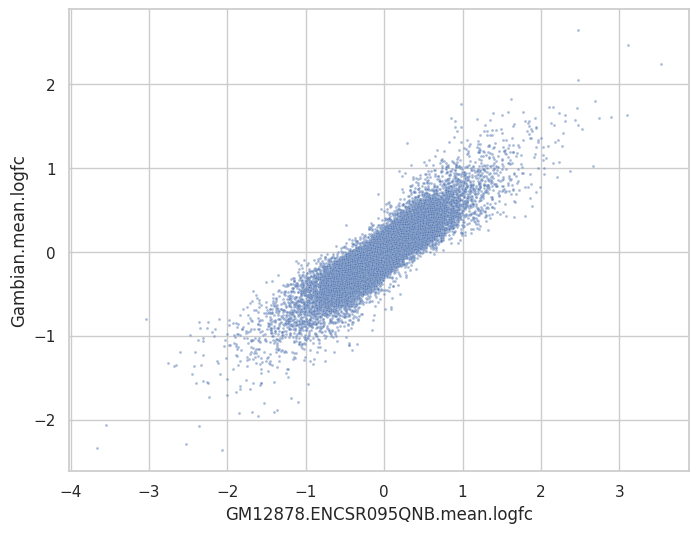

Pearson: 0.8591011460748151
Spearman: 0.7233451439704153


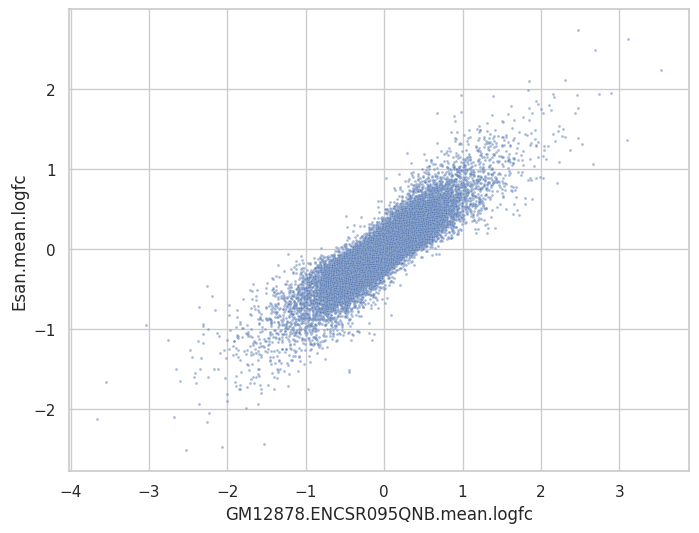

Pearson: 0.8695381146839384
Spearman: 0.730862965119853


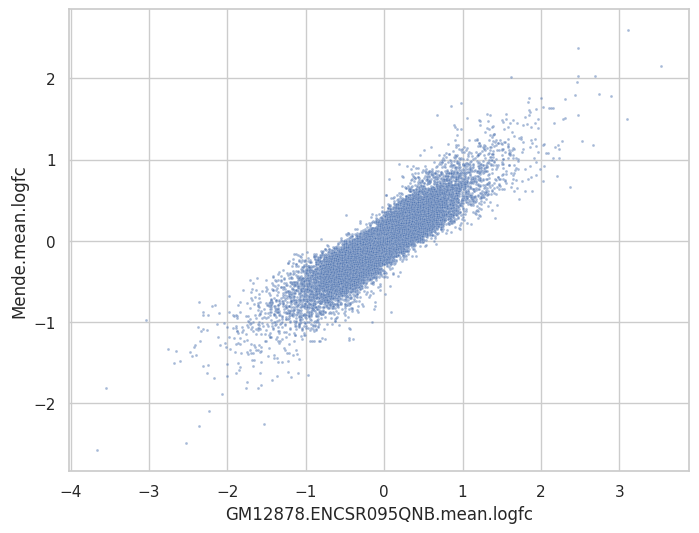

Pearson: 0.8583021963925399
Spearman: 0.7100606021436121


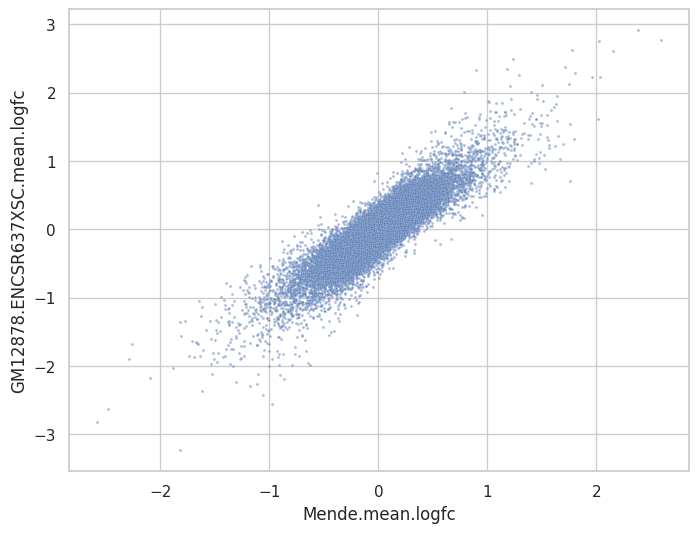

Pearson: 0.9246884690815796
Spearman: 0.8324328011043209


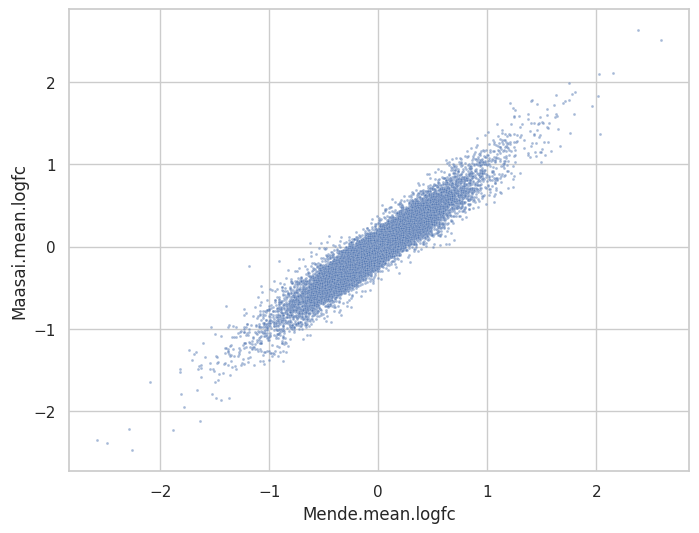

Pearson: 0.9204746660811407
Spearman: 0.8032543592063721


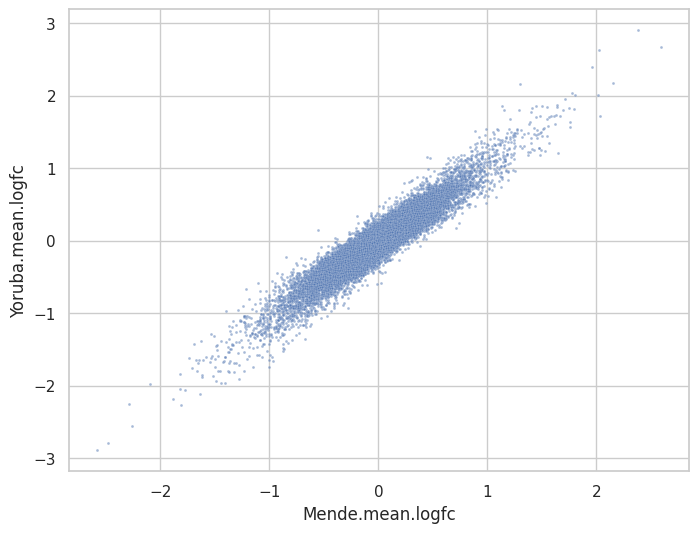

Pearson: 0.9256201778877189
Spearman: 0.8167970570141503


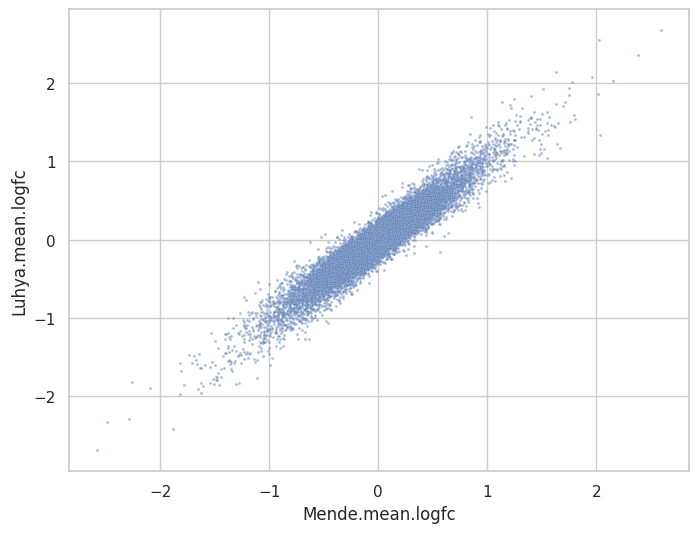

Pearson: 0.9310629785775567
Spearman: 0.833438397904813


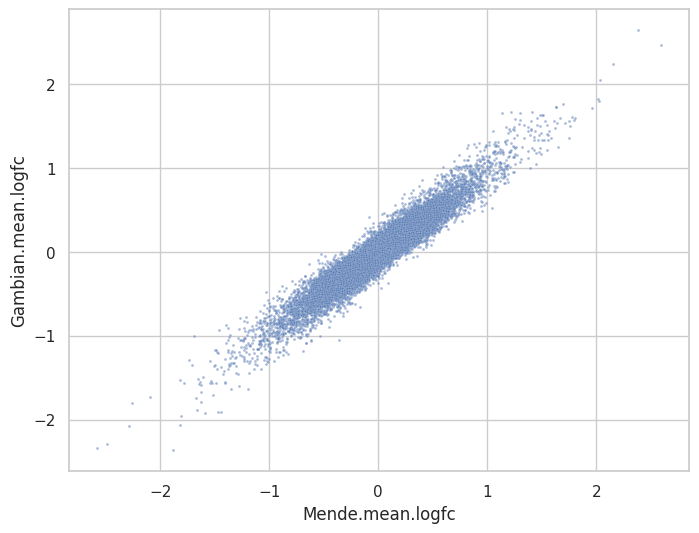

Pearson: 0.9239205816329628
Spearman: 0.8212378662804273


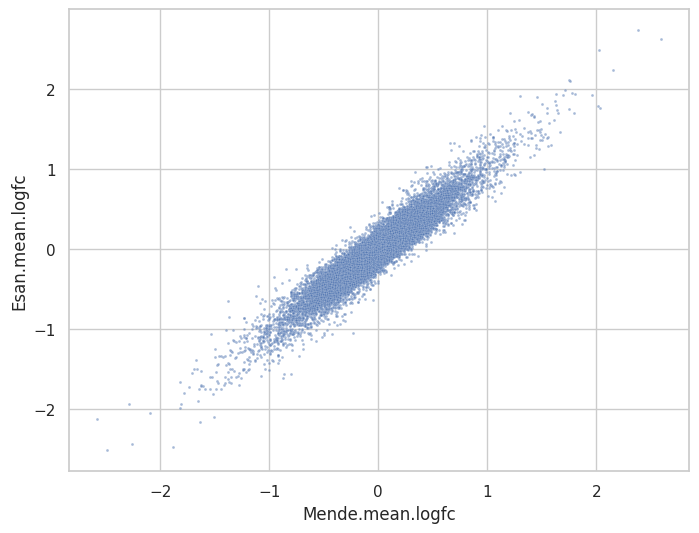

Pearson: 0.8695381146839384
Spearman: 0.730862965119853


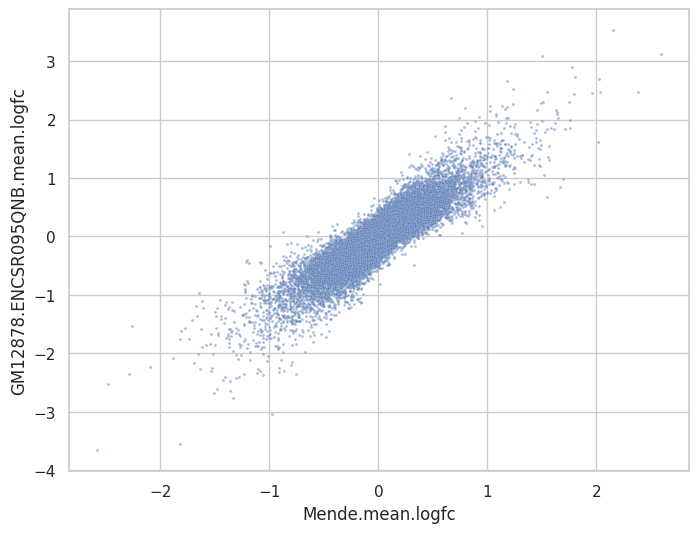

In [83]:
for ancestry1 in ancestries:
    for ancestry2 in ancestries:
        if ancestry1 != ancestry2:
            print('Pearson:', pearsonr(x=asb_scores[ancestry1 + '.mean.logfc'],
                                        y=asb_scores[ancestry2 + '.mean.logfc'])[0])
            print('Spearman:', spearmanr(a=asb_scores[ancestry1 + '.mean.logfc'],
                                         b=asb_scores[ancestry2 + '.mean.logfc'])[0])
            sns.scatterplot(x=ancestry1 + '.mean.logfc', y=ancestry2 + '.mean.logfc', data=asb_scores, alpha=0.5, s=4)
            plt.show()
            plt.close()

Pearson: 0.8857607730886344
Spearman: 0.7947081618472713


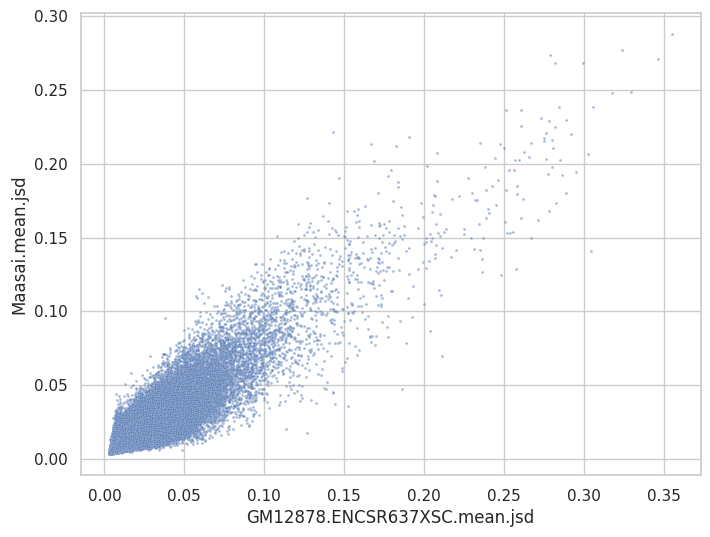

Pearson: 0.8980865935310912
Spearman: 0.827449767411357


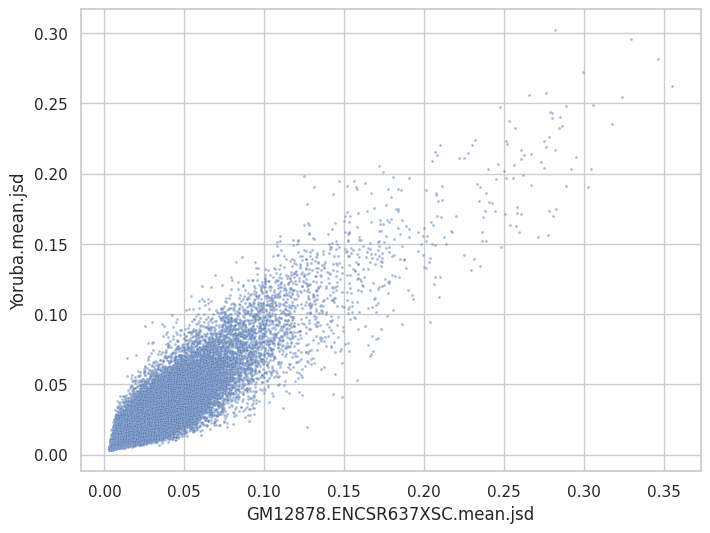

Pearson: 0.9052212801729065
Spearman: 0.8367235742878595


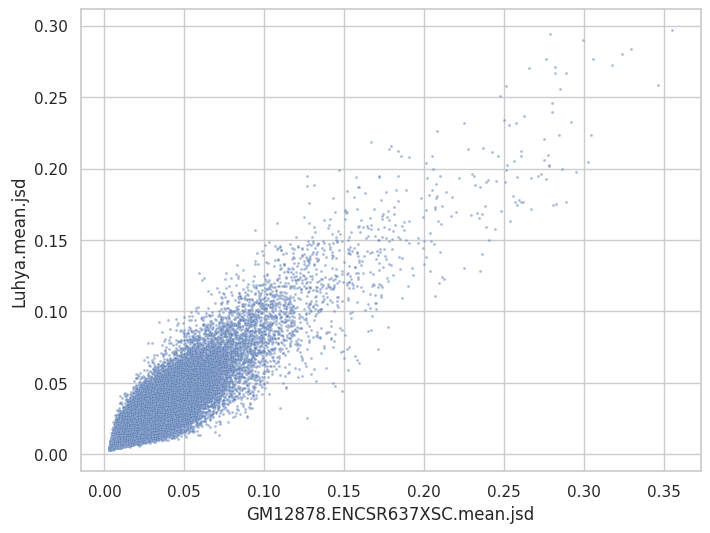

Pearson: 0.9016961898167222
Spearman: 0.8318057069559829


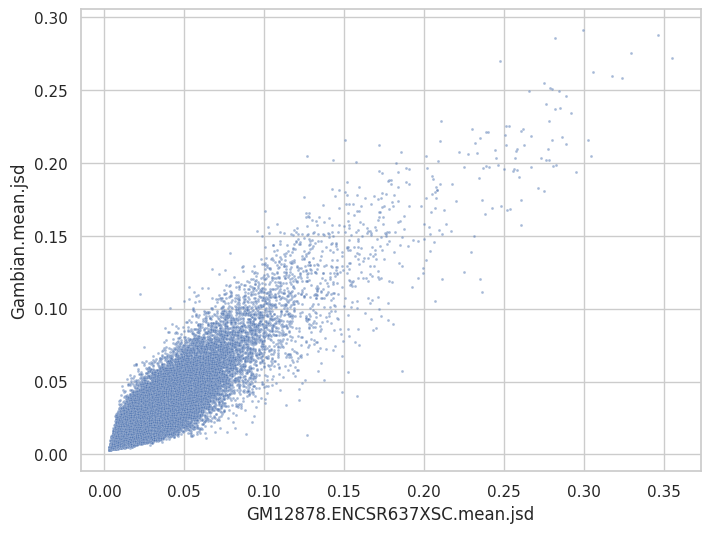

Pearson: 0.8983234562782947
Spearman: 0.828878740300573


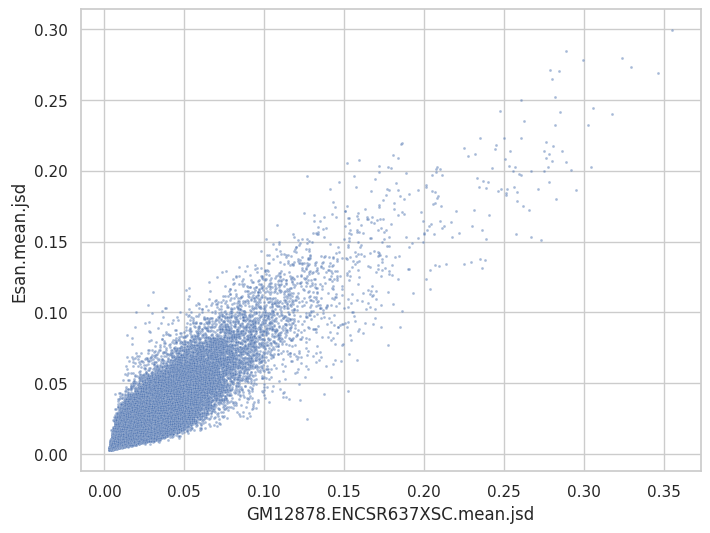

Pearson: 0.9254148868949096
Spearman: 0.8873757508481772


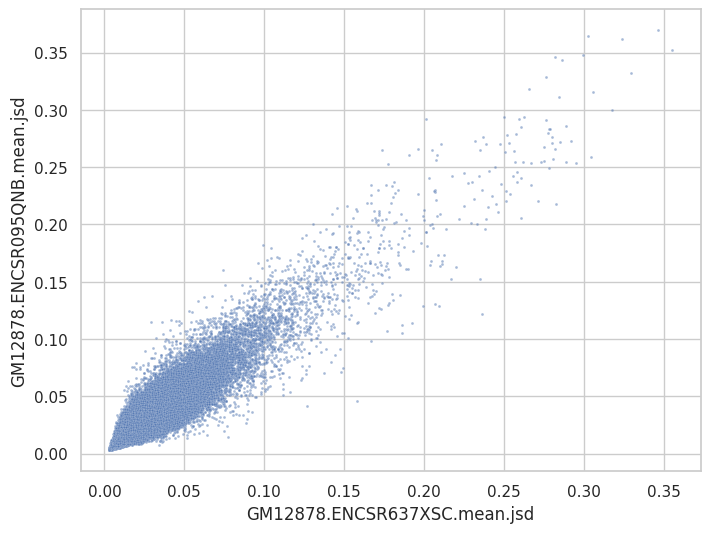

Pearson: 0.8939067922313747
Spearman: 0.8129817417527208


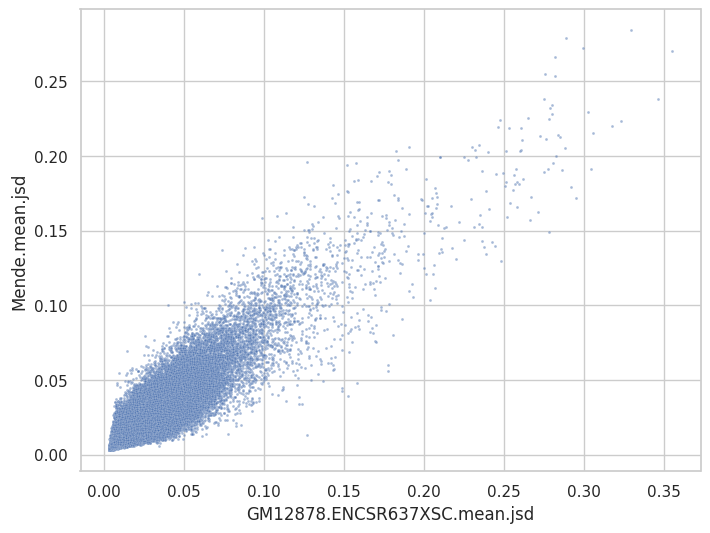

Pearson: 0.8857607730886344
Spearman: 0.7947081618472713


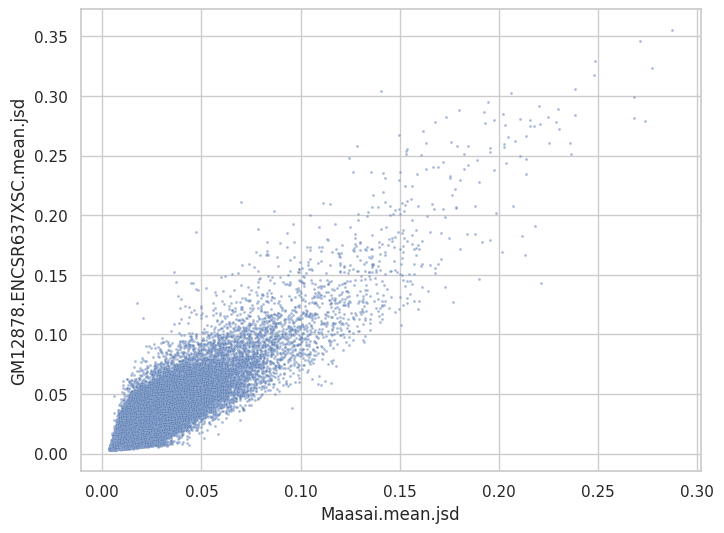

Pearson: 0.9397432982115023
Spearman: 0.9052185581396514


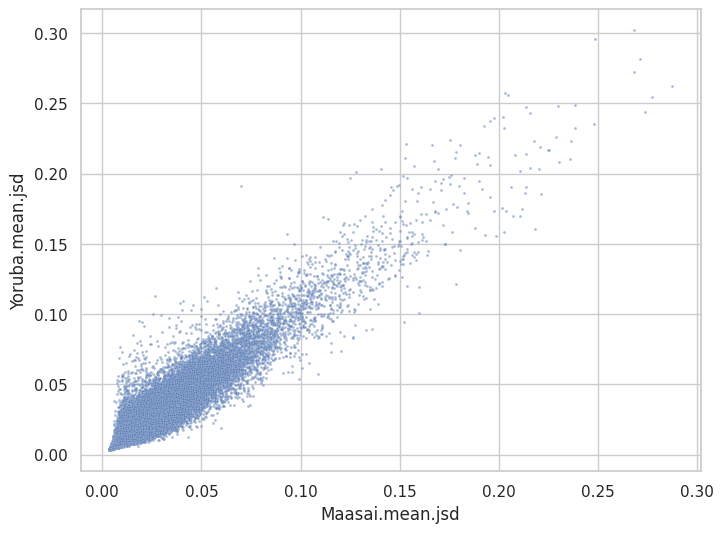

Pearson: 0.9433758210191248
Spearman: 0.9030105518438148


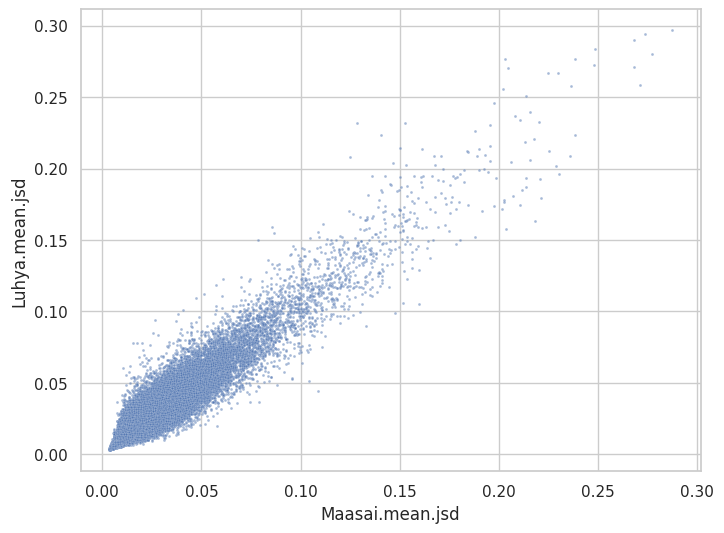

Pearson: 0.940201219354486
Spearman: 0.9015222071769323


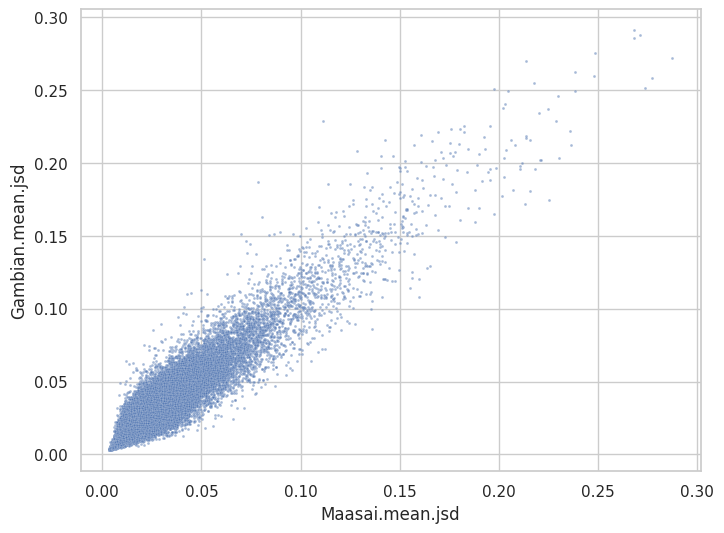

Pearson: 0.9298242919011208
Spearman: 0.8933310937010785


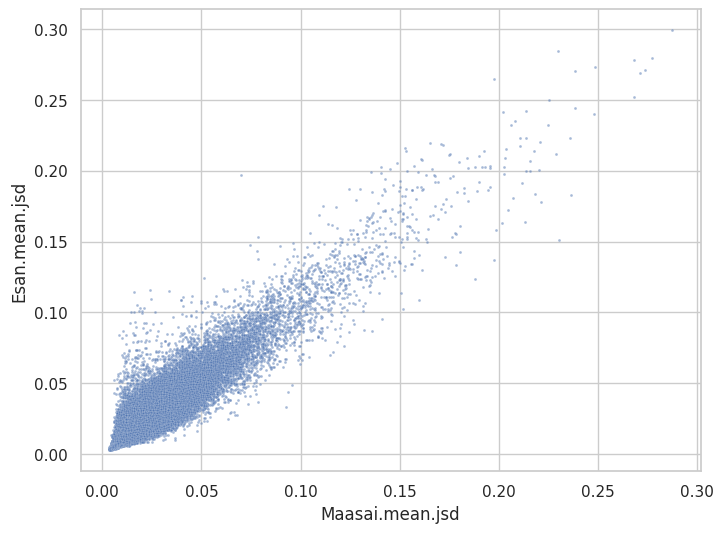

Pearson: 0.8843310026868948
Spearman: 0.8022831335906485


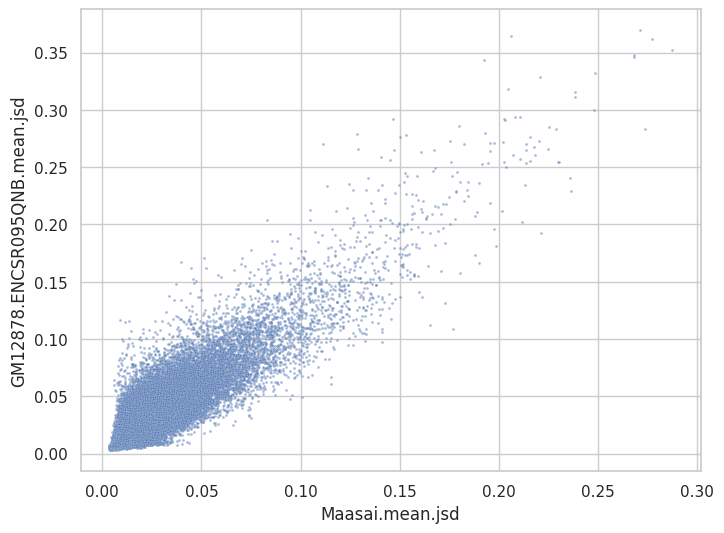

Pearson: 0.936872706981068
Spearman: 0.905793768445727


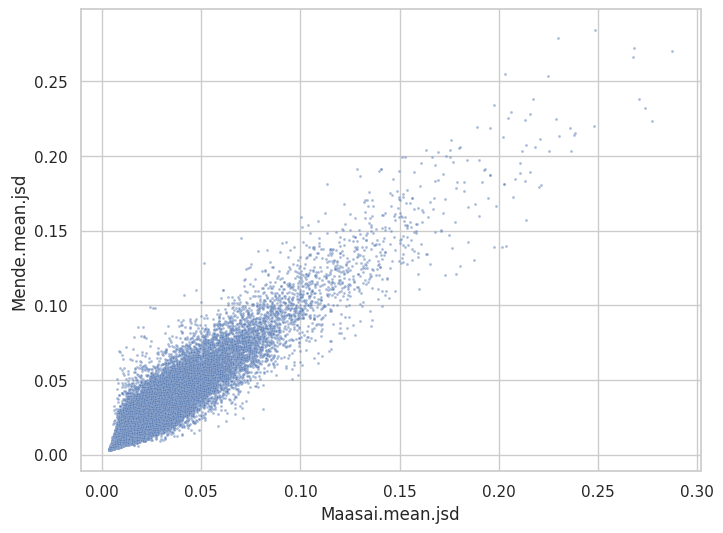

Pearson: 0.8980865935310912
Spearman: 0.827449767411357


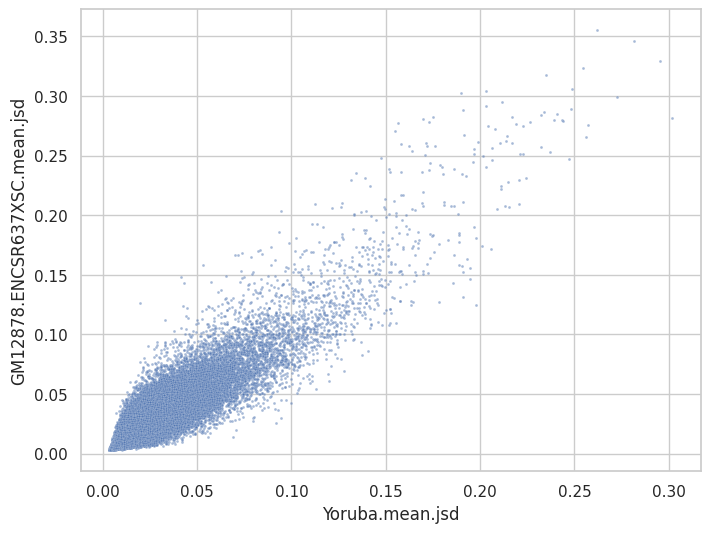

Pearson: 0.9397432982115023
Spearman: 0.9052185581396514


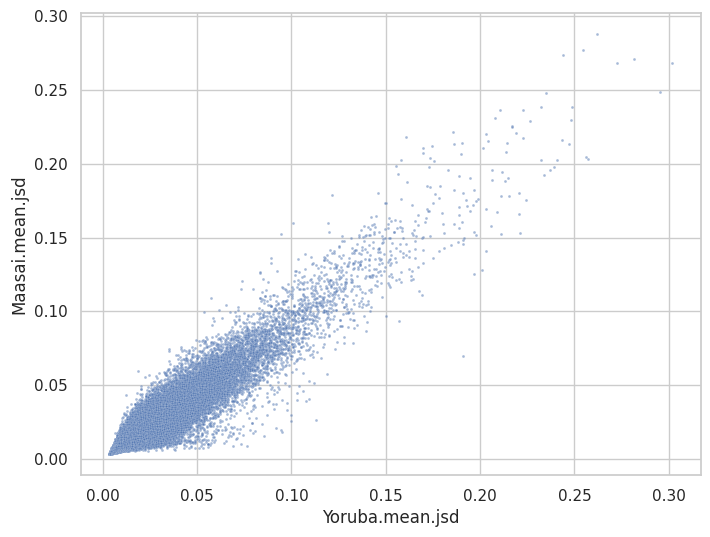

Pearson: 0.9486814619109099
Spearman: 0.9130311545175035


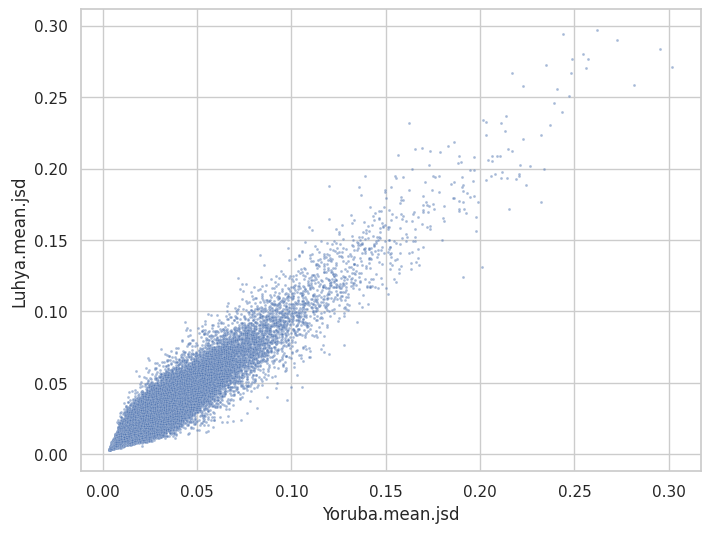

Pearson: 0.943864290311264
Spearman: 0.9087688365716708


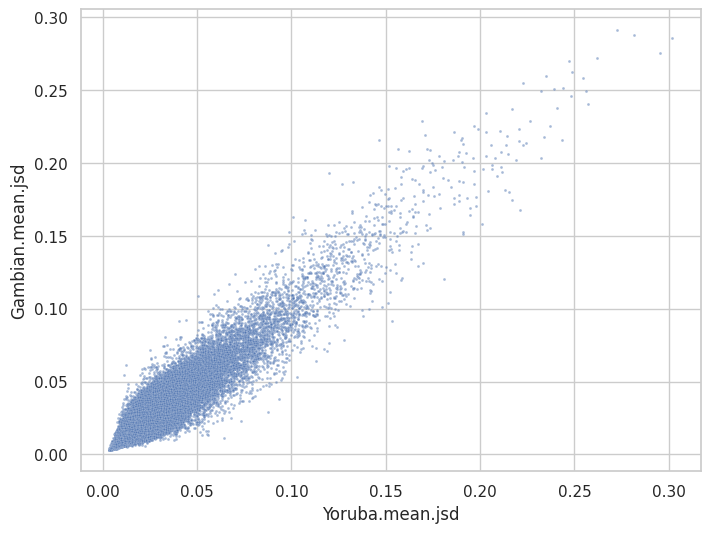

Pearson: 0.9433764389507949
Spearman: 0.9087149581009889


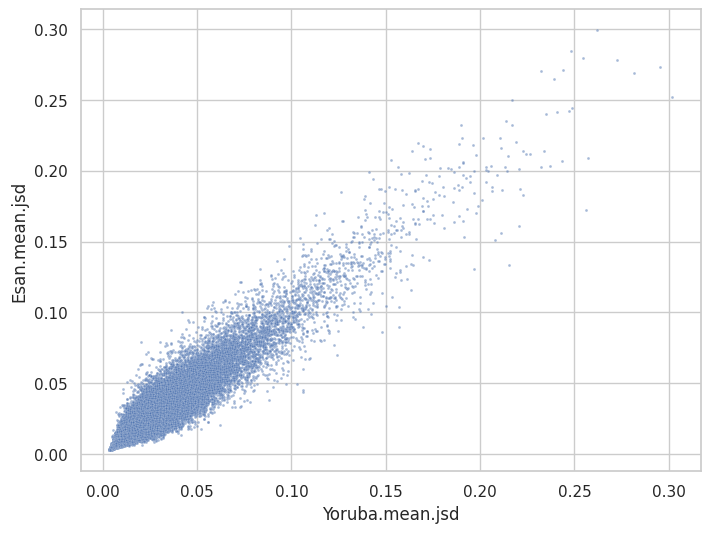

Pearson: 0.8973643610856599
Spearman: 0.833411969508377


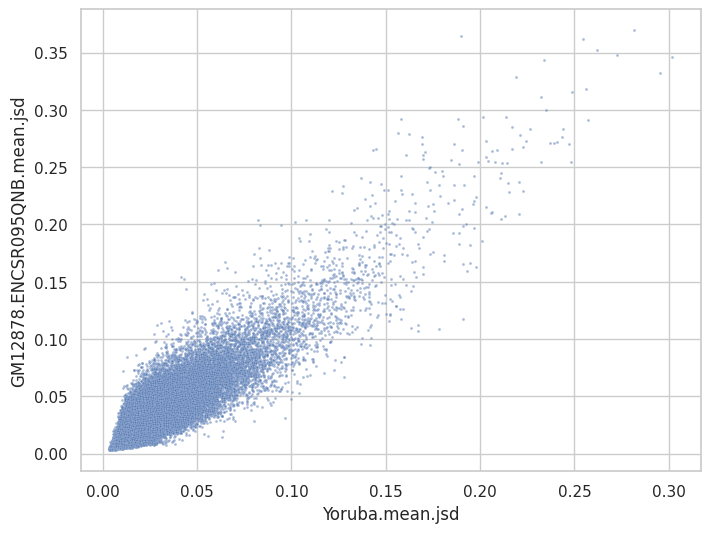

Pearson: 0.9432649514781839
Spearman: 0.9101957001823869


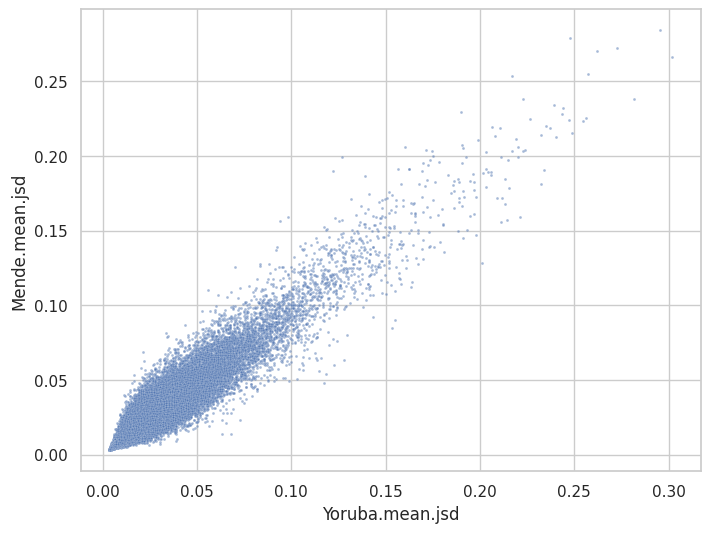

Pearson: 0.9052212801729065
Spearman: 0.8367235742878595


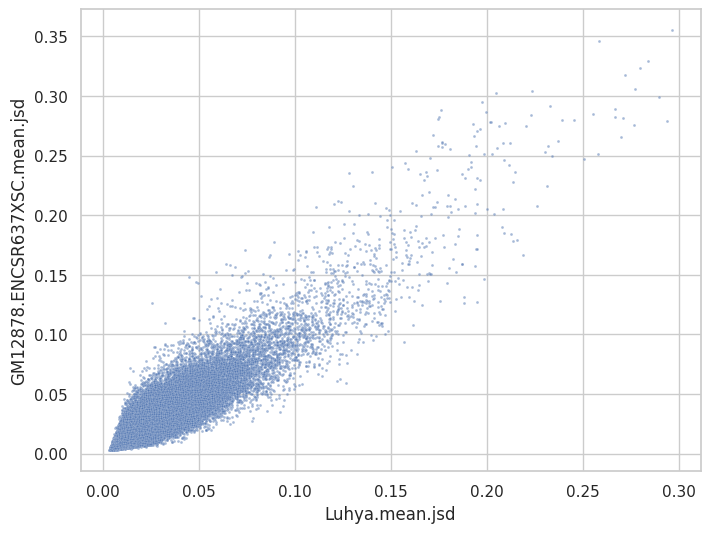

Pearson: 0.9433758210191248
Spearman: 0.9030105518438148


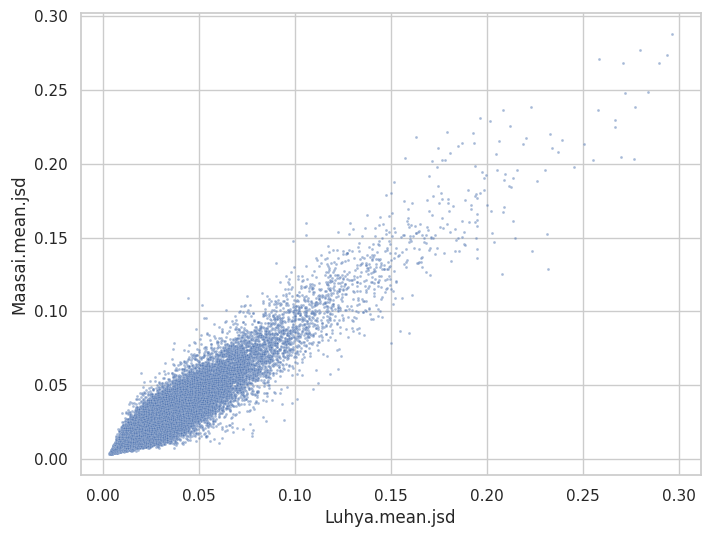

Pearson: 0.9486814619109099
Spearman: 0.9130311545175035


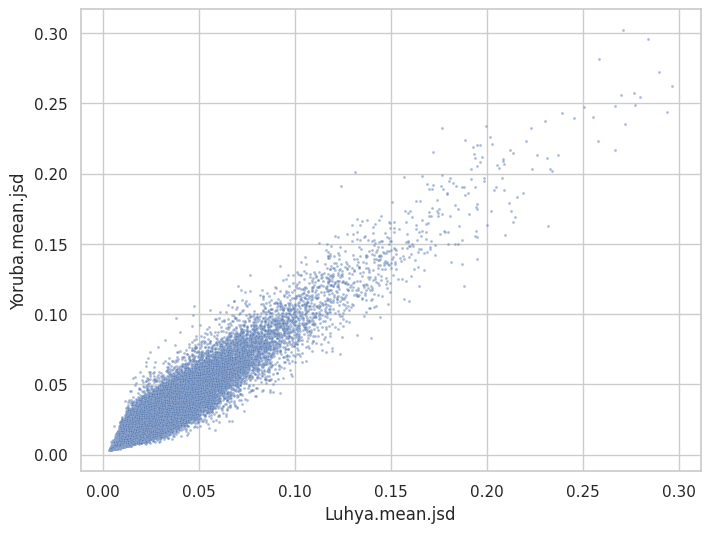

Pearson: 0.9454809942341706
Spearman: 0.9101549095985723


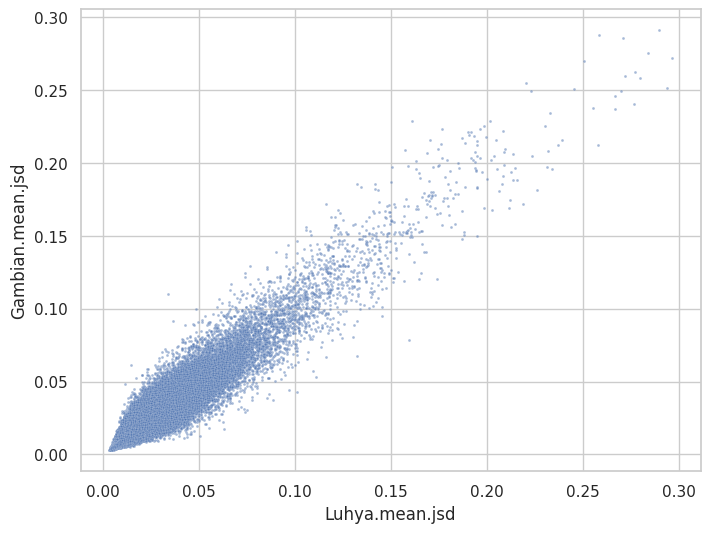

Pearson: 0.9423704038038515
Spearman: 0.907317471463078


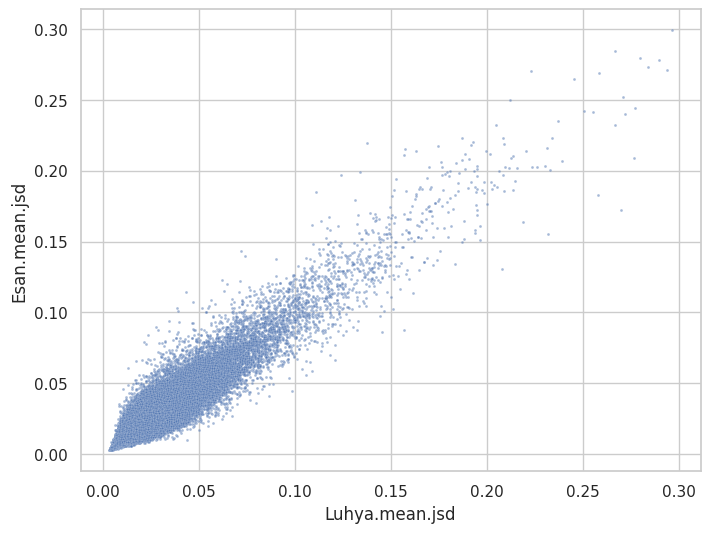

Pearson: 0.900337217317373
Spearman: 0.8409209975771533


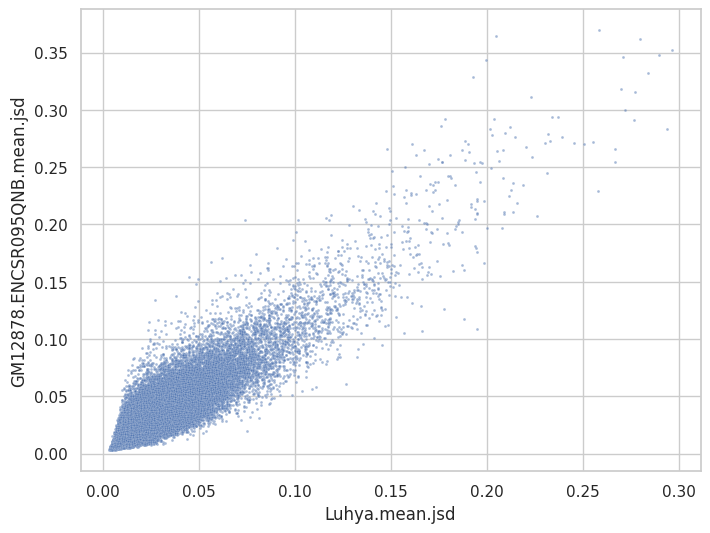

Pearson: 0.9427570025279134
Spearman: 0.9063394536470429


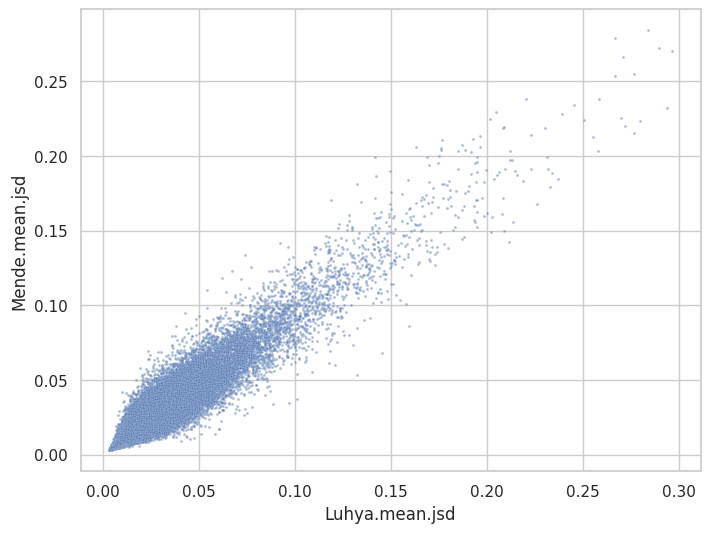

Pearson: 0.9016961898167222
Spearman: 0.8318057069559829


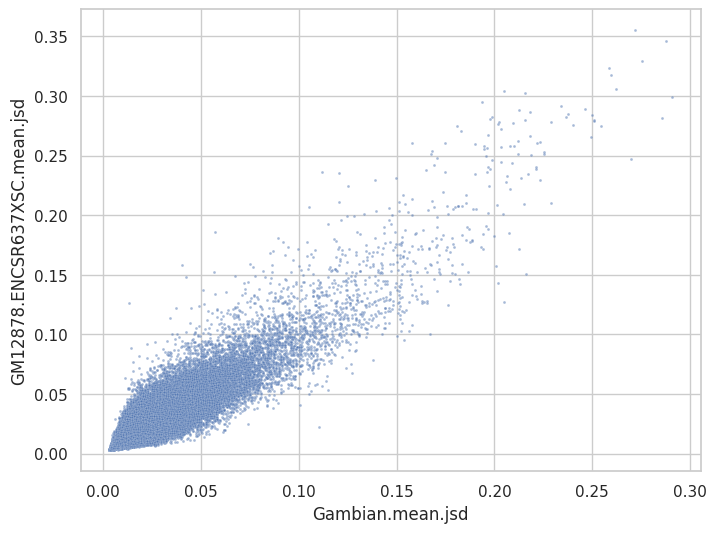

Pearson: 0.940201219354486
Spearman: 0.9015222071769323


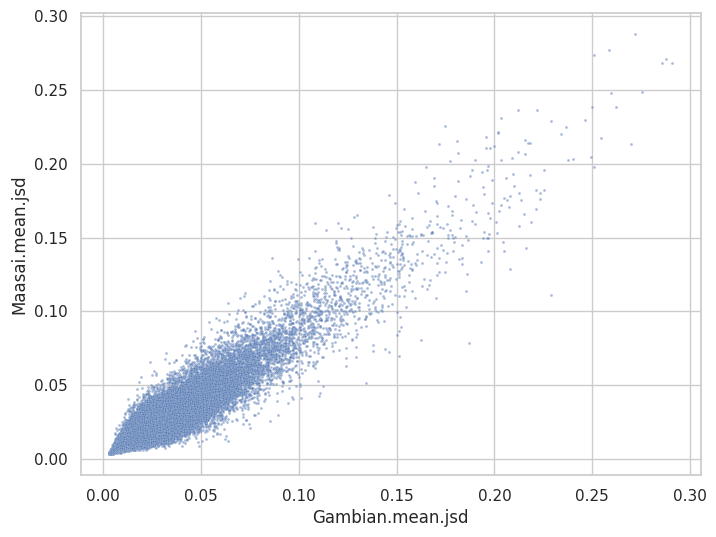

Pearson: 0.943864290311264
Spearman: 0.9087688365716708


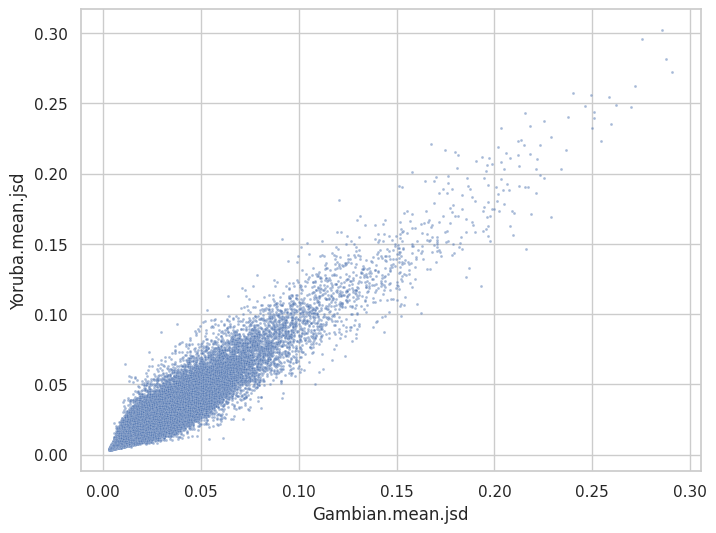

Pearson: 0.9454809942341706
Spearman: 0.9101549095985723


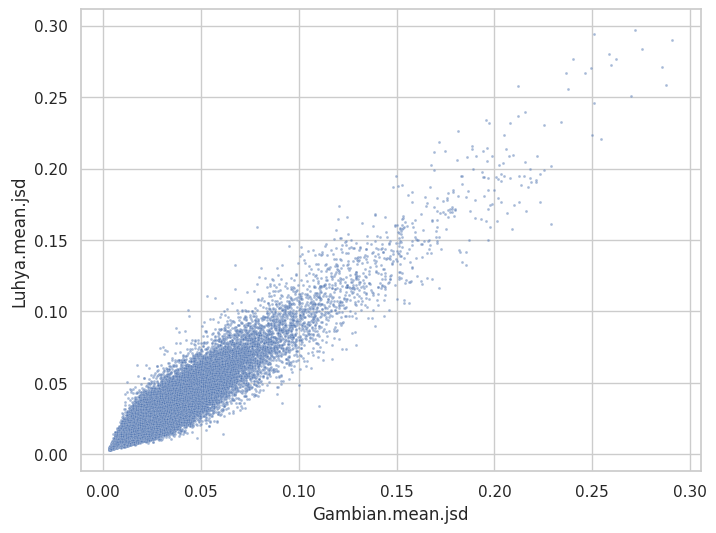

Pearson: 0.9362039540461096
Spearman: 0.9032924252139267


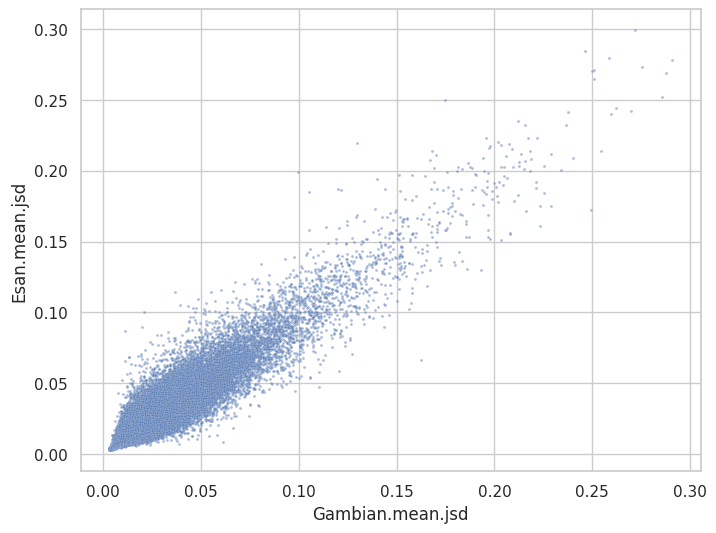

Pearson: 0.9078755951929398
Spearman: 0.8489390814779172


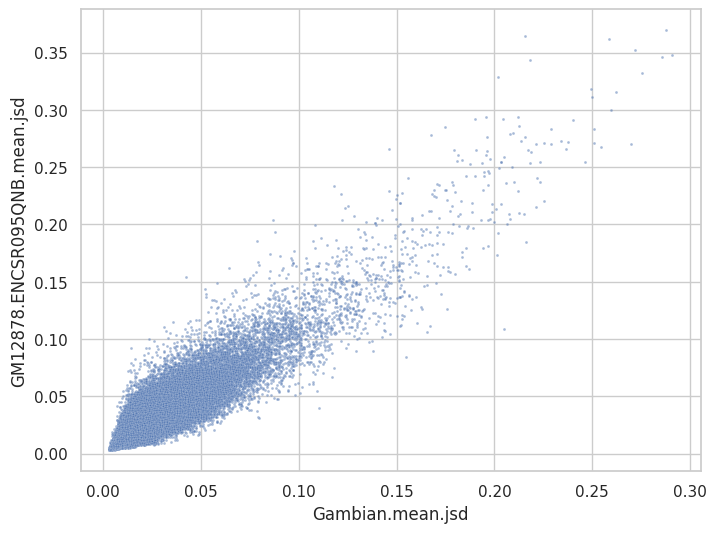

Pearson: 0.945779600117712
Spearman: 0.9086478394175761


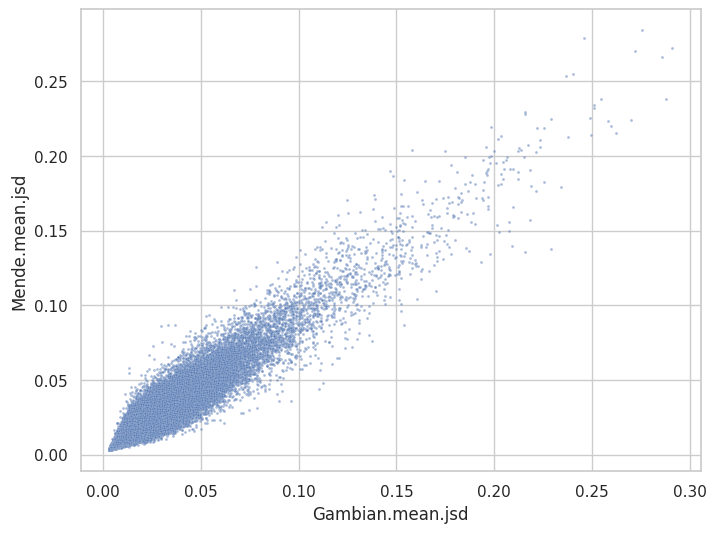

Pearson: 0.8983234562782947
Spearman: 0.828878740300573


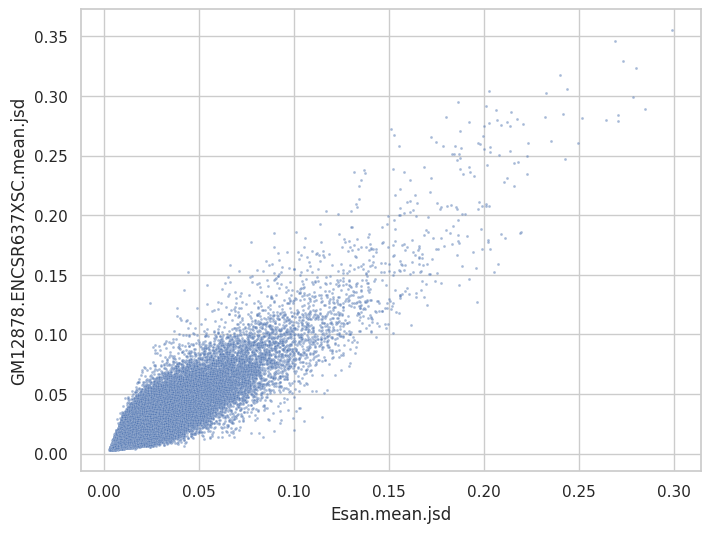

Pearson: 0.9298242919011208
Spearman: 0.8933310937010785


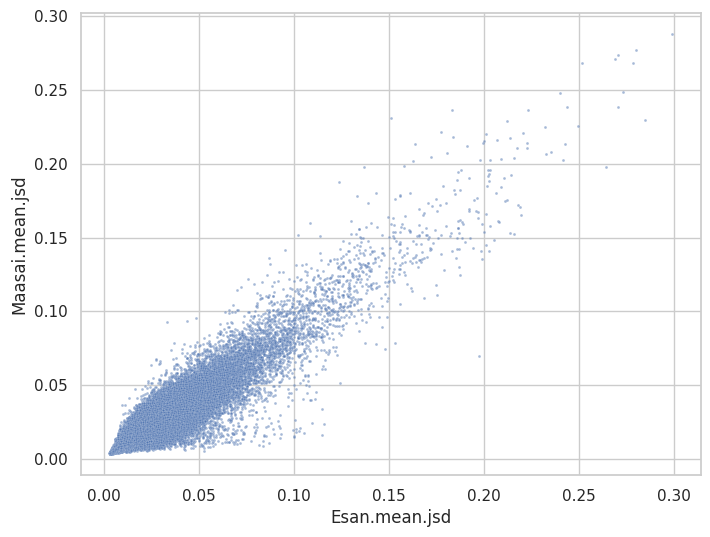

Pearson: 0.9433764389507949
Spearman: 0.9087149581009889


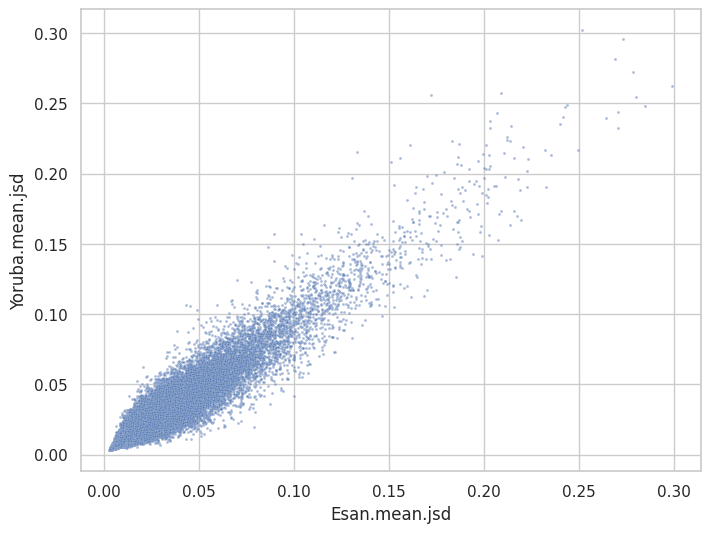

Pearson: 0.9423704038038515
Spearman: 0.907317471463078


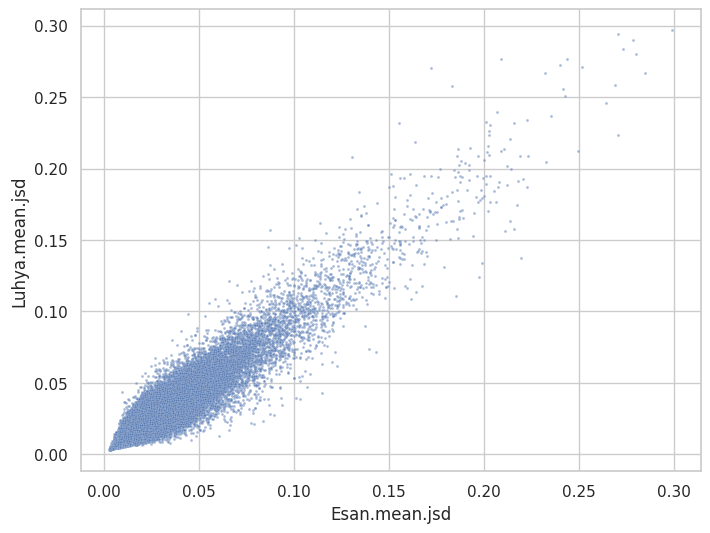

Pearson: 0.9362039540461096
Spearman: 0.9032924252139267


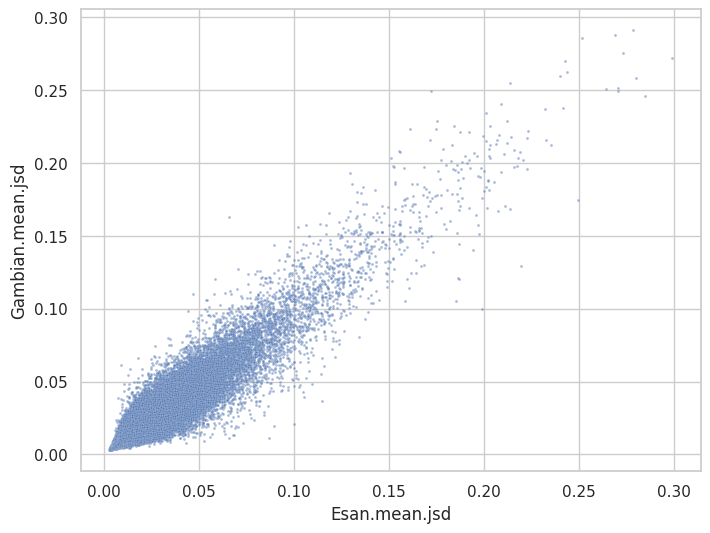

Pearson: 0.8980735195770629
Spearman: 0.836801643039078


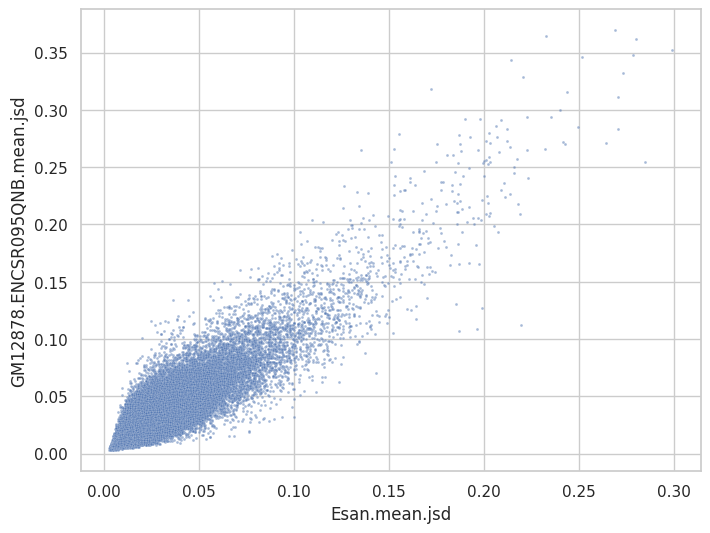

Pearson: 0.9391588120272338
Spearman: 0.9042540602181045


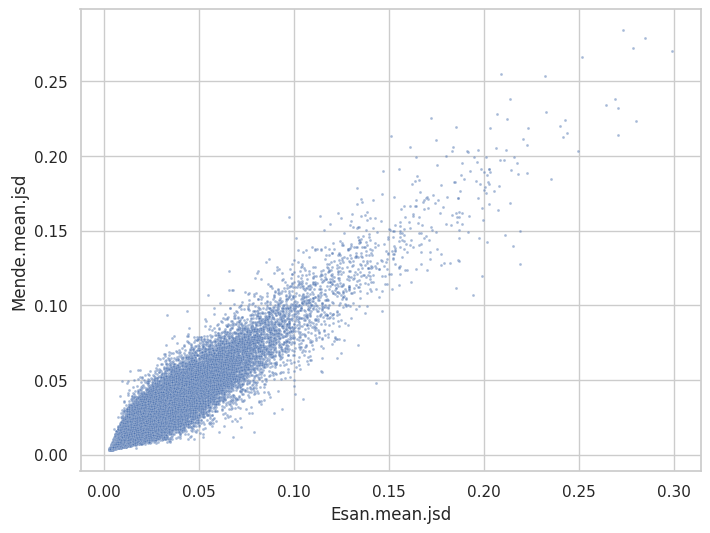

Pearson: 0.9254148868949096
Spearman: 0.8873757508481772


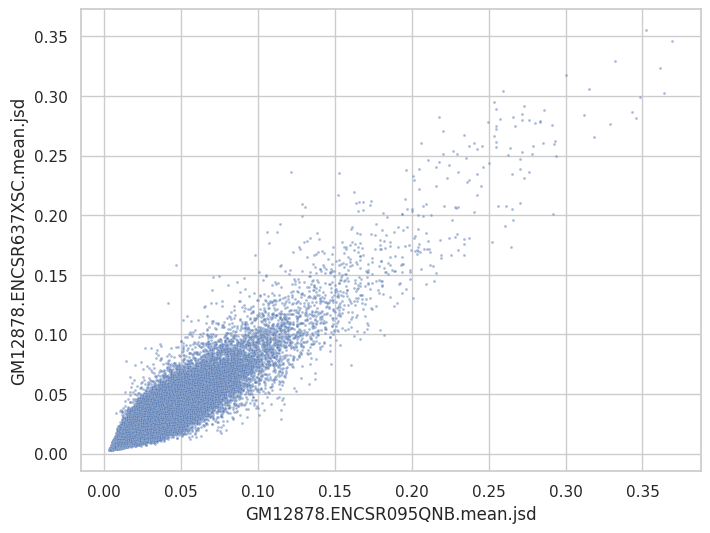

Pearson: 0.8843310026868948
Spearman: 0.8022831335906485


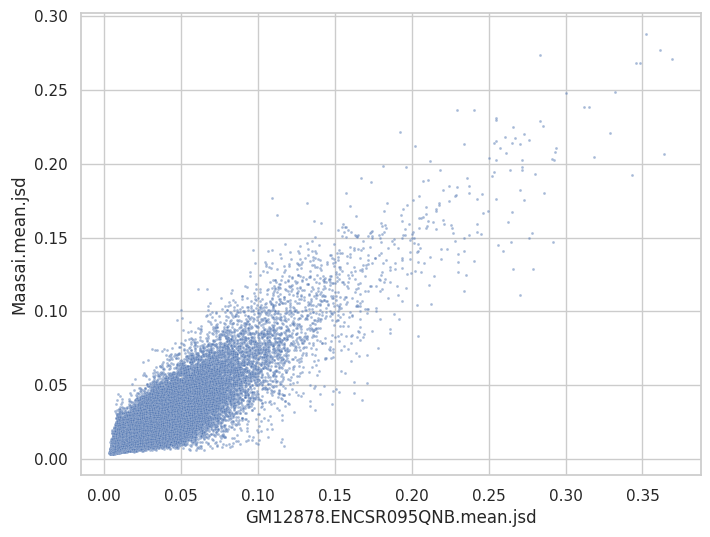

Pearson: 0.8973643610856599
Spearman: 0.833411969508377


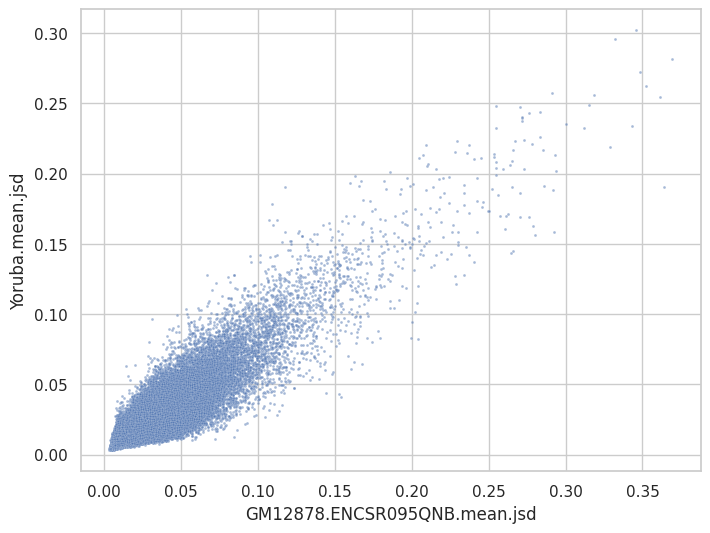

Pearson: 0.900337217317373
Spearman: 0.8409209975771533


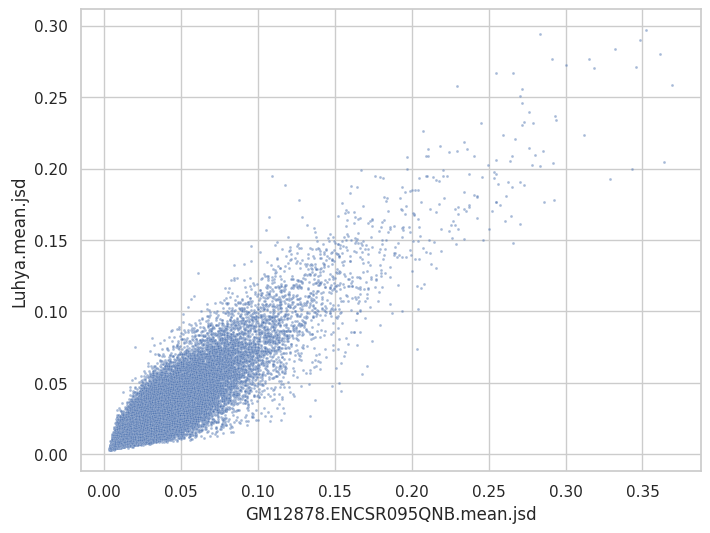

Pearson: 0.9078755951929398
Spearman: 0.8489390814779172


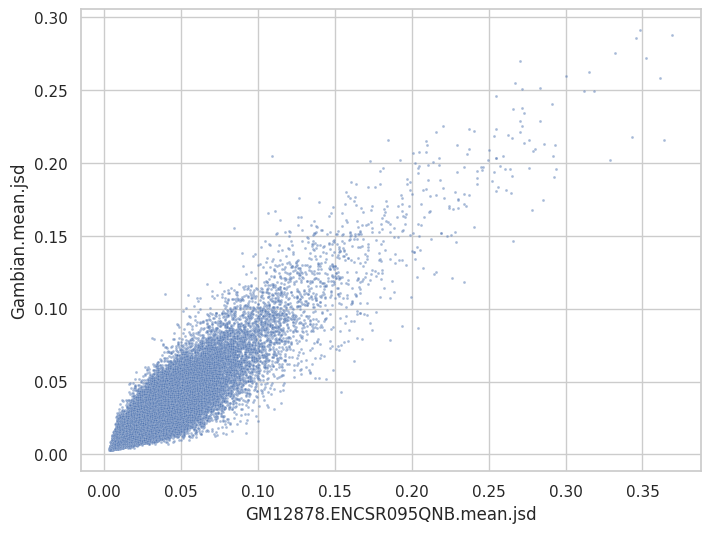

Pearson: 0.8980735195770629
Spearman: 0.836801643039078


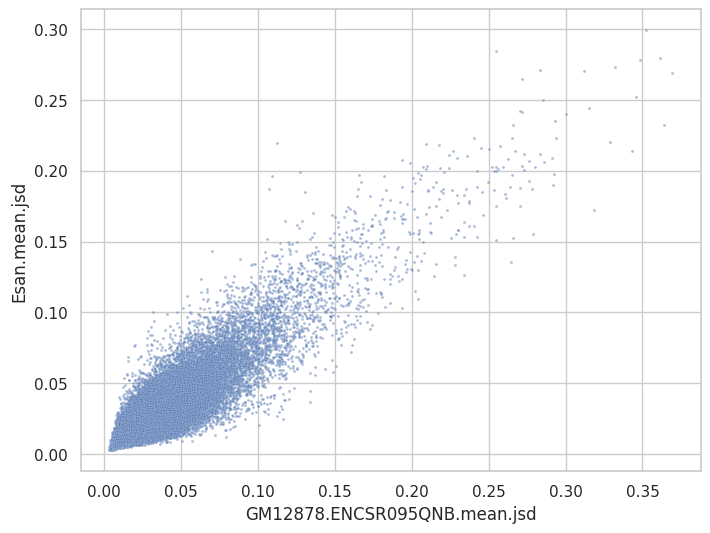

Pearson: 0.900464916111337
Spearman: 0.8251647173273496


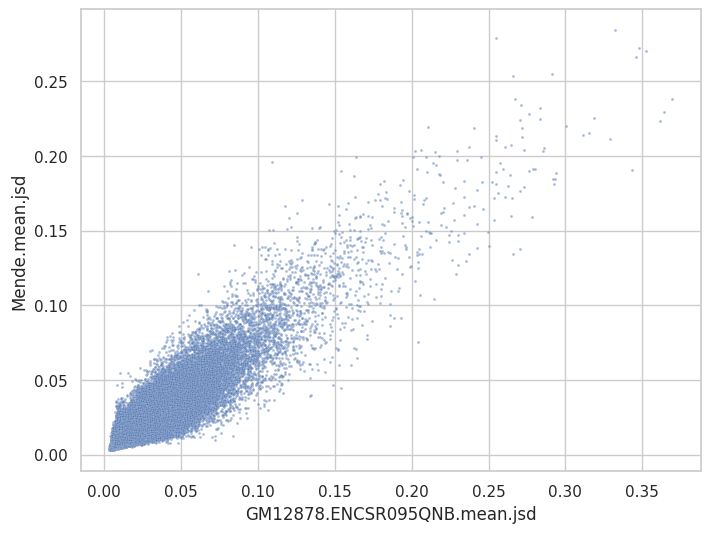

Pearson: 0.8939067922313747
Spearman: 0.8129817417527208


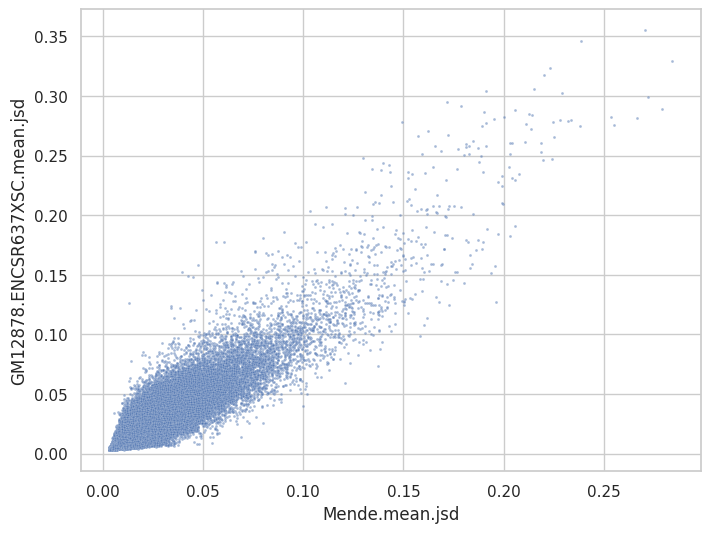

Pearson: 0.936872706981068
Spearman: 0.905793768445727


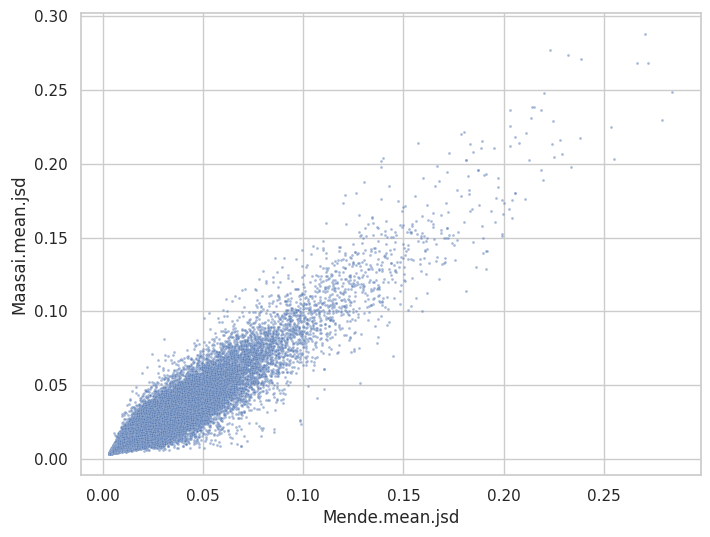

Pearson: 0.9432649514781839
Spearman: 0.9101957001823869


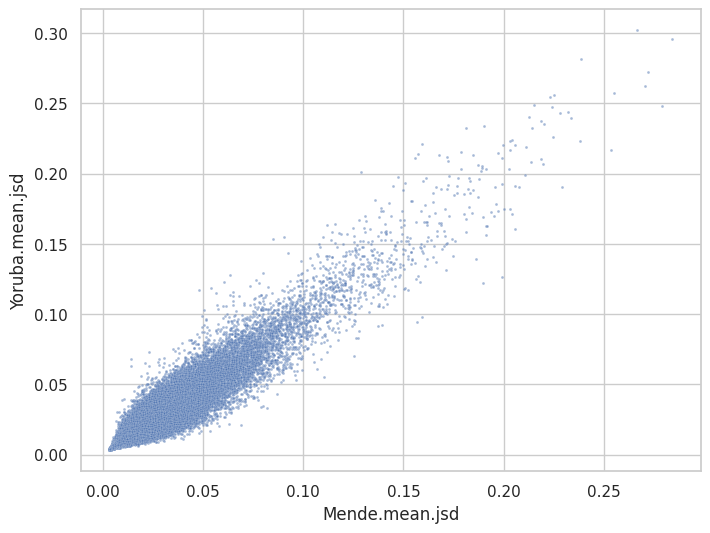

Pearson: 0.9427570025279134
Spearman: 0.9063394536470429


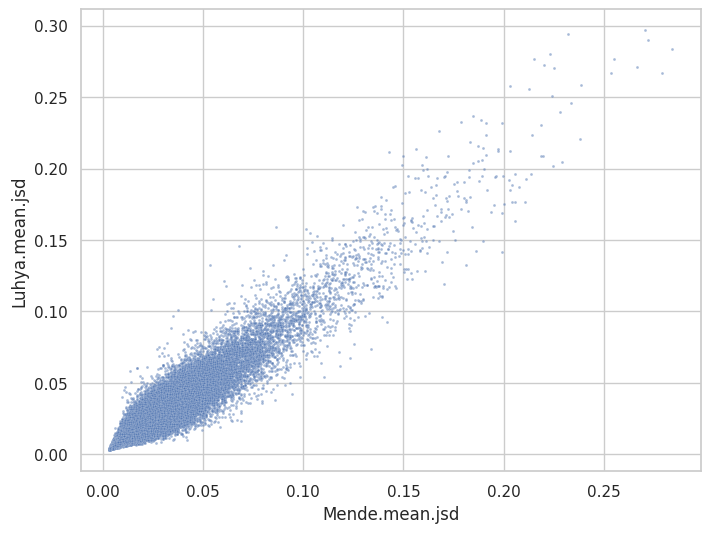

Pearson: 0.945779600117712
Spearman: 0.9086478394175761


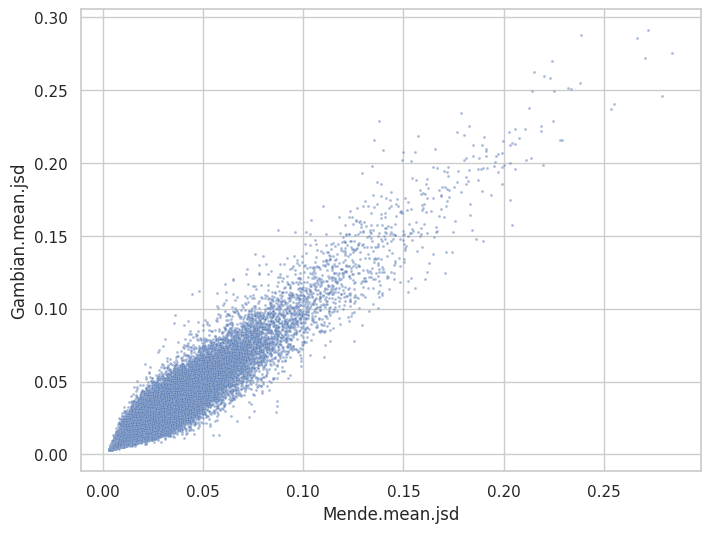

Pearson: 0.9391588120272338
Spearman: 0.9042540602181045


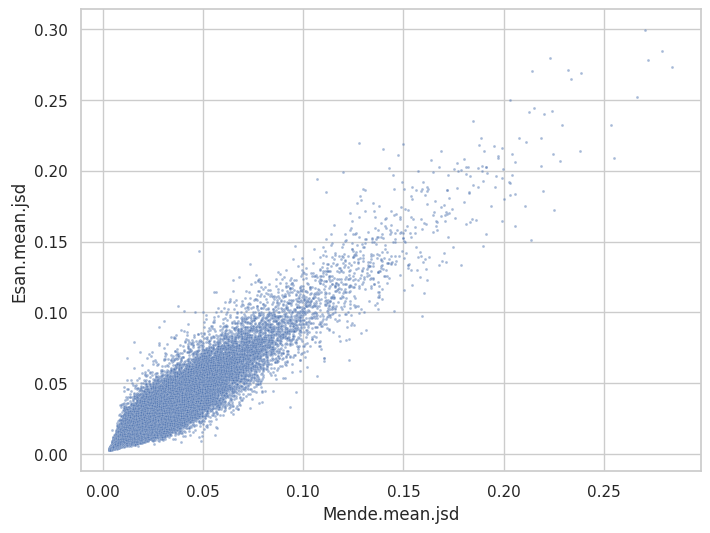

Pearson: 0.900464916111337
Spearman: 0.8251647173273496


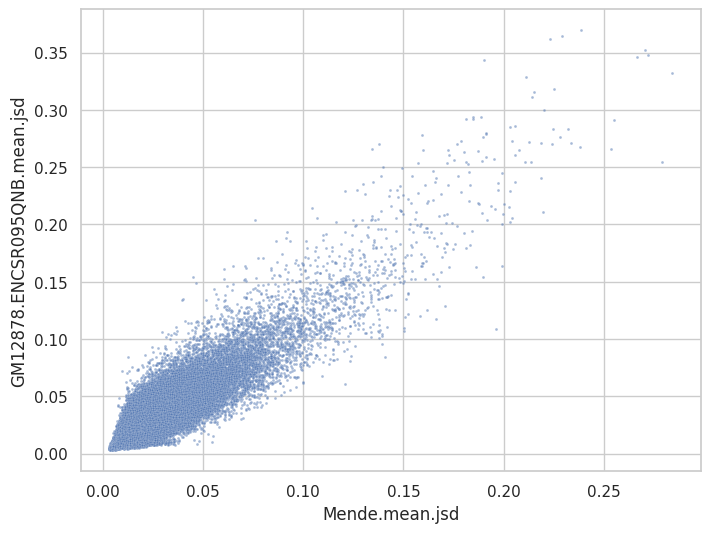

In [84]:
for ancestry1 in ancestries:
    for ancestry2 in ancestries:
        if ancestry1 != ancestry2:
            print('Pearson:', pearsonr(x=asb_scores[ancestry1 + '.mean.jsd'],
                                        y=asb_scores[ancestry2 + '.mean.jsd'])[0])
            print('Spearman:', spearmanr(a=asb_scores[ancestry1 + '.mean.jsd'],
                                         b=asb_scores[ancestry2 + '.mean.jsd'])[0])
            sns.scatterplot(x=ancestry1 + '.mean.jsd', y=ancestry2 + '.mean.jsd', data=asb_scores, alpha=0.5, s=4)
            plt.show()
            plt.close()

In [ ]:
ax = sns.boxplot(data=[asb_scores[i + '.mean.abs_logfc'] for i in ancestries])
ax.set_xticks([i for i in range(6)], [i for i in ancestries])
ax.set(xlabel='Ancestry', ylabel='ChromBPNet Mean Absolute LogFC Scores')
plt.show()

## All Significant SNPs

In [ ]:
merged_scores.loc[(merged_scores['all.mean.abs_logfc.pval'] < 0.01)]['all.mean.abs_logfc'].describe()

In [ ]:
merged_scores.loc[(merged_scores['all.mean.jsd.pval'] < 0.01)]['all.mean.jsd'].describe()

## Save Significant Scores

In [ ]:
sig_snps = merged_scores.loc[merged_scores['all.mean.abs_logfc.pval'] < 0.01].copy()

sig_snps

In [ ]:
sig_snps.to_csv(table_dir + '/' + 'sig.scores.abs_logfc_pval_0.01.tsv', index=False, sep='\t')